# Coco Assembly and Ribosome Collision

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

##### Arpat

In [ ]:
temp_repo_dir = "/home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/mouse"
data_repo_dir = "/home/kai/HDD_Kemal/from_raf_computer/Kemal/Data/sam_arpat"
script_path_infrastructure = "/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure"
import sys
sys.path.insert(0, '/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis')
from infrastructure.main import *

disomes = [os.path.join(data_repo_dir, i) for i in ["SRR9715828.sam", "SRR9715826.sam"]]
monosomes = [os.path.join(data_repo_dir, i) for i in ["SRR1930189.sam", "SRR1930188.sam"]]

I = Infrastructre(temp_repo_dir,
                  ensembl_release=102,
                  organism="mus_musculus",
                  #include_gene3d=True,
                  verbose=True)

I.riboseq_sixtymers = RiboSeqSixtymers(I.temp_repo_dir, monosomes, disomes, "sixtymers",
                                       riboseq_assign_to="best_transcript", riboseq_assign_at=-15,
                                       protein_genome_instance=I.protein_genome,
                                       gene_info_dictionary=I.gene_info,
                                       exclude_genes=I.exclude_genes, verbose=I.verbose,
                                       footprint_len_experiment=list(range(45,71)),  # From paper
                                       footprint_len_background=list(range(26, 36))  # From paper
                                       )

#### Bukau

In [2]:
temp_repo_dir = "/home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/"
data_repo_dir = "/home/kai/HDD_Kemal/from_raf_computer/Kemal/Data/sam_bukau"
script_path_infrastructure = "/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure"
import sys
sys.path.insert(0, '/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis')
from infrastructure.main import *

spt = [os.path.join(data_repo_dir, i) for i in ["Sixtymers_TT1.sam", "Sixtymers_TT2.sam"]]
sps = [os.path.join(data_repo_dir, i) for i in ["Sixtymers_Rep1.sam", "Sixtymers_Rep2.sam", "Sixtymers_NoPK.sam"]]

erb_serb = [os.path.join(data_repo_dir, f"SeRP/EBP1/Rep{i+1}/IP/IP{i+1}.sam") for i in range(2)]
erb_total = [os.path.join(data_repo_dir, f"SeRP/EBP1/Rep{i+1}/Total/Total{i+1}.sam") for i in range(2)]
nac_serb = [os.path.join(data_repo_dir, f"SeRP/NAC/Rep{i+1}/IP/IP{i+1}.sam") for i in range(2)]
nac_total = [os.path.join(data_repo_dir, f"SeRP/NAC/Rep{i+1}/Total/Total{i+1}.sam") for i in range(2)]

coco_d = [os.path.join(data_repo_dir, i) for i in ["Coco_Dis1.sam", "Coco_Dis2.sam"]]
coco_m = [os.path.join(data_repo_dir, i) for i in ["Coco_Mono1.sam", "Coco_Mono2.sam"]]

exclude_genes = ["ENSG00000160789"]

I = Infrastructre(temp_repo_dir,
                  exclude_genes=exclude_genes,
                  ensembl_release=102,
                  organism="homo_sapiens",
                  #include_gene3d=True,
                  verbose=True)
I.riboseq_sixtymers = RiboSeqSixtymers(I.temp_repo_dir, spt, sps, "sixtymers",
                                        riboseq_assign_to="best_transcript", riboseq_assign_at="auto",
                                        protein_genome_instance=I.protein_genome,
                                        gene_info_dictionary=I.gene_info,
                                        exclude_genes=I.exclude_genes, verbose=I.verbose)
# Should be first to calculate, since multiprocessing is quite memory inefficient.
I.riboseq_coco = RiboSeqCoco(I.temp_repo_dir, coco_m, coco_d, "cocoassembly",
                             riboseq_assign_to="best_transcript", riboseq_assign_at=-15,
                             protein_genome_instance=I.protein_genome,
                             gene_info_dictionary=I.gene_info,
                             exclude_genes=I.exclude_genes, verbose=I.verbose)

/home/kai/anaconda3/envs/kemals/lib/python3.6/site-packages/ipykernel_launcher.py:26: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.


[28/06/2021 10:40:21 CEST] Gene information dictionary is found in path: /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/gene_info_database.joblib


INFO:pyensembl.sequence_data:Loaded sequence dictionary from /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/Homo_sapiens.GRCh38.cdna.all.fa.pickle
INFO:pyensembl.sequence_data:Loaded sequence dictionary from /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/Homo_sapiens.GRCh38.pep.all.fa.pickle


[28/06/2021 10:40:48 CEST] ProteinGenome found in path: /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/protein_genome_instance.joblib
[28/06/2021 10:40:56 CEST] RiboSeq assignment for sixtymers_background found in path: /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/riboseq_sixtymers_background.joblib
[28/06/2021 10:41:00 CEST] RiboSeq assignment for sixtymers_experiment found in path: /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/riboseq_sixtymers_experiment.joblib
[28/06/2021 10:41:06 CEST] RiboSeq assignment for cocoassembly_background found in path: /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/riboseq_cocoassembly_background.joblib
[28/06/2021 10:41:10 CEST] RiboSeq assignment for cocoassembly_experiment found in path: /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/riboseq_cocoassembly_experiment.joblib
Fitting calculations found for cocoassembly in path: /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/riboseq_cocoassembly_fitting_c

In [3]:
def bootstrap(data, n=1000, func=np.mean, p=0.95):
    data = data[~np.isnan(data)]
    # Bootstrap is conducted by sampling with replacement
    sample_size = len(data)
    simulations = [func(np.random.choice(data, size=sample_size, replace=True)) for i in range(n)]
    low_ci = np.percentile(simulations, 100*(1-p)/2)
    high_ci = np.percentile(simulations, 100*(1-(1-p)/2))
    return (low_ci, high_ci)
def normalization(data1d):
    return (data1d - np.nanmin(data1d)) / (np.nanmax(data1d) - np.nanmin(data1d))
def confidence_interval_normal(metag, confidence=0.95):
    ci = np.empty((2, metag.shape[1]))
    for i in range(metag.shape[1]):
        data = metag[:, i]
        mean=np.nanmean(data)
        std=np.nanstd(data, ddof=1)
        size=np.sum(~np.isnan(data))
        alpha=1-confidence
        t_score=stats.t.isf(alpha/2,df=(size-1))
        ME=t_score*std/np.sqrt(size)
        lower_CI=mean-ME
        upper_CI=mean+ME
        ci[:,i] = np.array([lower_CI, upper_CI])
    return ci
def confidence_interval_poission(metag, confidence=0.95):
    # https://stats.stackexchange.com/questions/15371/how-to-calculate-a-confidence-level-for-a-poisson-distribution
    ci = np.empty((2, metag.shape[1]))
    for i in range(metag.shape[1]):
        data = metag[:, i]
        mean=np.nanmean(data)
        z=stats.norm.ppf(1-(1-confidence)/2)
        size=np.sum(~np.isnan(data))
        lower_CI=mean - z * np.sqrt(mean/size)
        upper_CI=mean + z * np.sqrt(mean/size)
        ci[:,i] = np.array([lower_CI, upper_CI])
    return ci

In [4]:
gene_lengths = {gene_id: I.riboseq_sixtymers.experiment.gene_lengths[gene_id] for gene_id in I.gene_list}
gene_collision = {gene_id: I.riboseq_sixtymers.stalling_peaks_inecik_3(gene_id, probability=0.010) for gene_id in I.gene_list}
print(f"Number of collision sites: {len([j for i in gene_collision for j in gene_collision[i]])}") # 35732

Number of collision sites: 34135


#### CocoOnset

Choose the one of following

In [5]:
gene_onset_raw = {gene_id: I.riboseq_coco.calculate_onset(gene_id) for gene_id in I.gene_list}
print(f"Gene count: {len(I.gene_list)}")
print(f"Genes does not fit CocoAssembly: {np.isnan(np.array(list(gene_onset_raw.values()))).sum()}")
print(f"Genes fit CocoAssembly: {len(I.gene_list) - np.isnan(np.array(list(gene_onset_raw.values()))).sum()}")

/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1982: RuntimeWarning: overflow encountered in exp
  ((1 - i_final) / (1 + np.exp(-a_2 * (x - (i_mid + i_dist)))) + i_final)
/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1981: RuntimeWarning: overflow encountered in exp
  return ((i_max - i_init) / (1 + np.exp(-a_1 * (x - i_mid))) + i_init) * \
/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1977: RuntimeWarning: overflow encountered in exp
  return (i_max - i_init) / (1 + np.exp(-a * (x - i_mid))) + i_init


Gene count: 22524
Genes does not fit CocoAssembly: 15604
Genes fit CocoAssembly: 6920


In [6]:
pubdata = pd.read_excel(os.path.join(os.path.dirname(script_path_infrastructure), "matilde_kai_2021.xlsx"), header=1)
pubdata["High_conf"] = pubdata["High_conf"].replace(np.nan, False)
pubdata["Low_conf"] = pubdata["Low_conf"].replace(np.nan, False)
pubdata["Low_conf"] = pubdata["Low_conf"].astype(bool)
pubdata["High_conf"] = pubdata["High_conf"].astype(bool)
print(f"Data frame All: {pubdata.shape}")

Data frame All: (4130, 5)


In [7]:
# Get the gene names from the infrastrcture
gene_name_to_gene_id = dict()
for gene_id in I.gene_list:
    for gene_name in I.gene_info[gene_id].gene_names:
        gene_name_to_gene_id[gene_name] = gene_name_to_gene_id.get(gene_name, []) + [gene_id]

# Create an accurate mapping
toensembl = dict()
for gene_name in pubdata["Gene"]:
    if gene_name in gene_name_to_gene_id:
        toensembl[gene_name] = gene_name_to_gene_id[gene_name]
    else:
        for k in gene_name.split("-"):
            if k in gene_name_to_gene_id:
                toensembl[gene_name] = toensembl.get(gene_name, []) + gene_name_to_gene_id[k]
    #if gene_name in toensembl:
    #    toensembl[gene_name] = [gene_id for gene_id in toensembl[gene_name] if not np.isnan(gene_onset_raw[gene_id])]

In [8]:
onsetdf = list()
included_already = list()
for row_series in pubdata.iterrows():
    row = row_series[1].to_list()
    if row[0] in toensembl:
        ensemblid = toensembl[row[0]]
        for gene_id in ensemblid:
            included_already.append(gene_id)
            my_onset = gene_onset_raw[gene_id]
            new_row = [gene_id, row[0], my_onset, row[1] * 3, "High" if row[2] else "Low", gene_lengths[gene_id], row[4],
                       I.riboseq_sixtymers.experiment.calculate_rpkm_genes(gene_id),
                       I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)]
            onsetdf.append(new_row)
    else:
        new_row = [np.nan, row[0], np.nan, row[1] * 3, "High" if row[2] else "Low", np.nan, row[4],
                   np.nan, 
                   np.nan]
        onsetdf.append(new_row)
for gene_id in gene_onset_raw:
    if not np.isnan(gene_onset_raw[gene_id]) and gene_id not in included_already:
        my_onset = gene_onset_raw[gene_id]
        new_row = [gene_id, np.nan, my_onset, np.nan, "Extended", gene_lengths[gene_id], np.nan,
                       I.riboseq_sixtymers.experiment.calculate_rpkm_genes(gene_id),
                       I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)]
        onsetdf.append(new_row)
onsetdf = pd.DataFrame(onsetdf, columns = ["GeneID", "GeneName", "MyOnset", "PapersOnset", "Confidence", 
                         "GeneLength", "PaperTotalRPKM", "MySixtymersRPKM", "MyTotalRPKM"])

INFO:numexpr.utils:Note: NumExpr detected 48 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


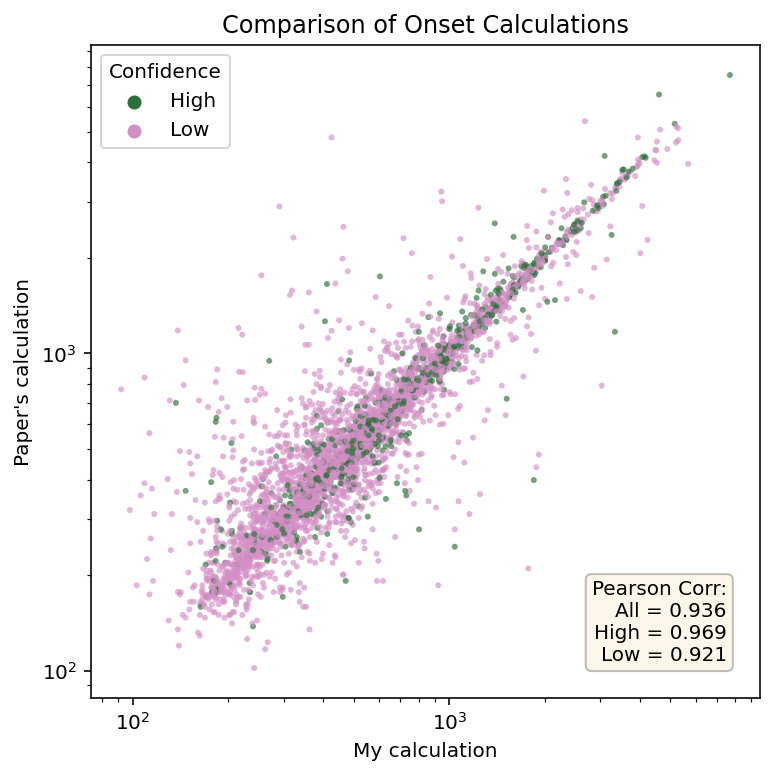

In [9]:
temp_df = onsetdf[(~onsetdf.isna().any(axis=1))] # & (onsetdf["Confidence"] == "High")]
plt.figure(figsize=(6, 6))
sns.scatterplot(data=temp_df, x="MyOnset", y="PapersOnset", hue="Confidence", alpha=0.65,
                palette="cubehelix", linewidth=0, marker = ".", hue_order=["High", "Low"])

temp_r_high = temp_df[temp_df["Confidence"] == "High"]
r_high = stats.pearsonr(temp_r_high["MyOnset"], temp_r_high["PapersOnset"])[0]
temp_r_low = temp_df[temp_df["Confidence"] == "Low"]
r_low = stats.pearsonr(temp_r_low["MyOnset"], temp_r_low["PapersOnset"])[0]
r_all = stats.pearsonr(temp_df["MyOnset"], temp_df["PapersOnset"])[0]

plt.text(0.95, 0.05, "Pearson Corr:\nAll = %.3f\nHigh = %.3f\nLow = %.3f" % (r_all, r_high, r_low), 
            transform=plt.gca().transAxes, verticalalignment='bottom', horizontalalignment="right", alpha=1,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.25))
plt.xlabel("My calculation")
plt.ylabel("Paper's calculation")
plt.title(f"Comparison of Onset Calculations")
plt.xscale("log")
plt.yscale("log")

In [10]:
# Create gene_onset dict
temp_df = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset"]]
temp_df["MyOnset"] = temp_df["MyOnset"].astype(np.int16)
gene_onset = temp_df.set_index('GeneID').to_dict()["MyOnset"]
gene_onset.update({i: np.nan for i in I.gene_list if i not in gene_onset})

#### Collect Data for Analysis

In [11]:
slopes_temp = list()
for row_series in onsetdf.iterrows():
    gene_id = row_series[1]["GeneID"]
    ons = row_series[1]["MyOnset"]
    if not np.isnan(ons):
        ons = int(ons)
        curve_derivative = np.gradient(I.riboseq_coco.calculate_curve(gene_id))
        slopes_temp.append(curve_derivative[ons])
    else:
        slopes_temp.append(np.nan)
onsetdf["SlopeMyOnset"] = slopes_temp

/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1982: RuntimeWarning: overflow encountered in exp
  ((1 - i_final) / (1 + np.exp(-a_2 * (x - (i_mid + i_dist)))) + i_final)
/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1977: RuntimeWarning: overflow encountered in exp
  return (i_max - i_init) / (1 + np.exp(-a * (x - i_mid))) + i_init
/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1981: RuntimeWarning: overflow encountered in exp
  return ((i_max - i_init) / (1 + np.exp(-a_1 * (x - i_mid))) + i_init) * \


In [12]:
height_temp = list()
width_temp = list()
for row_series in onsetdf.iterrows():
    gene_id = row_series[1]["GeneID"]
    ons = row_series[1]["MyOnset"]
    if not np.isnan(ons):
        ons = int(ons)
        sgnl = I.riboseq_coco.calculate_curve(gene_id)
        drvt = np.gradient(sgnl)
        m = drvt[ons]
        karsi = (sgnl[ons] - sgnl[0]) * 2
        height_temp.append(karsi)
        width_temp.append(karsi / m)
    else:
        height_temp.append(np.nan)
        width_temp.append(np.nan)
onsetdf["HeightAssembly"] = height_temp
onsetdf["WidthAssembly"] = width_temp

In [13]:
##### Monosome Depletion

def find_max(the_arr):
    the_arr = list(the_arr)
    while the_arr:
        max_point = max(the_arr)
        last_point = the_arr.pop(-1)
        if max_point != last_point:
            return the_arr.index(max_point)
    return 0
def helper(p_ind, p_i, p_j, p_y_mid):
    return p_ind if abs(p_i - p_y_mid) < abs(p_j - p_y_mid) else p_ind + 1
def find_lg(the_arr, arr_max):
    if len(the_arr) == 0:
        raise AssertionError("Unexpected!")
    arr_stride = np.lib.stride_tricks.as_strided(the_arr, shape=(len(the_arr), 2), strides=(the_arr.strides + the_arr.strides))
    # last element is just bullshit
    y_mid = (arr_max + the_arr.min()) / 2
    x_mid = list(set([helper(ind, i, j, y_mid) for ind, (j, i) in enumerate(arr_stride[:-1]) if i <= y_mid <= j]))
    assert len(x_mid) != 0, f"Type 0 error in find_onset: {gene_id}"
    assert len(x_mid) == 1, f"Type 1 error in find_onset: {gene_id}"
    return x_mid[0]

mondep_lg_temp = list()
for row_series in onsetdf.iterrows():
    gene_id = row_series[1]["GeneID"]
    ons = row_series[1]["MyOnset"]
    if not np.isnan(ons):
        sigmoid_type = I.riboseq_coco.best_model[gene_id]["winner_model"]
        glength = I.riboseq_coco.experiment.gene_lengths[gene_id]
        if sigmoid_type == "ssig":
            mondep_lg_temp.append(glength)
        elif sigmoid_type == "dsig":
            # from infrastructure
            arr = I.riboseq_coco.calculate_curve(gene_id, model_name="dsig")
            marr = smooth_array(np.round(arr, 2), window_len=15, window="hanning")  # smooth and round
            derivative = np.gradient(marr)
            descending = np.sum(derivative < 0)
            ascending = np.sum(derivative > 0)
            if descending != 0 and ascending == 0:
                mondep_lg_temp.append(np.nan)
                raise AssertionError("Shouldn't be here1")
            elif descending == 0 and ascending != 0:
                mondep_lg_temp.append(glength)
            else:
                max_value_index = find_max(marr)
                sub_arr = arr[max_value_index:]
                max_value = arr[max_value_index]
                mondep_lg_temp.append(find_lg(sub_arr, max_value) + max_value_index)
        else:
            raise AssertionError("Shouldn't be here2")
    else:
        mondep_lg_temp.append(np.nan)
onsetdf["MonDep_lg_val"] = mondep_lg_temp

mondep_temp = list()
for row_series in onsetdf.iterrows():
    gene_id = row_series[1]["GeneID"]
    ons = row_series[1]["MyOnset"]
    if not np.isnan(ons):
        ons = int(ons)
        lg = int(row_series[1]["MonDep_lg_val"])
        
        
        tg = np.mean(I.riboseq_sixtymers.background.gene_assignments[gene_id], axis=0)
        
        #I.riboseq_sixtymers.background.calculate_rpm_positions(gene_id, average=True) # tt
        mg = np.mean(I.riboseq_coco.background.gene_assignments[gene_id], axis=0)
        
        #I.riboseq_coco.background.calculate_rpm_positions(gene_id, average=True)[:lg] # monosome
        rg = (np.sum(mg[ons:])/np.sum(tg[ons:]))/(np.sum(mg[:ons])/np.sum(tg[:ons]))
        mondep_temp.append(1-rg)
    else:
        mondep_temp.append(np.nan)
onsetdf["MonosomeDepletion"] = mondep_temp

/home/kai/anaconda3/envs/kemals/lib/python3.6/site-packages/ipykernel_launcher.py:71: RuntimeWarning: divide by zero encountered in double_scalars


In [14]:
###### Transmembrane Domains

#script_path_tmhmm_db = os.path.abspath(os.path.join(os.path.dirname(script_path_infrastructure), "tmhmm.R"))
ero = ensembl_release_object_creator(I.temp_repo_dir, I.ensembl_release, I.organism)
#I.db_tmhmm = EnsemblDomain(I.temp_repo_dir, script_path_tmhmm_db, I.protein_genome,
#                                                 ero, ensembl_release=I.ensembl_release,
#                                                 organism=I.organism, verbose=I.verbose)
I.db_tmhmm = joblib.load("/home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/tmhmm.joblib")
tmd_genes = list(set([ero.gene_id_of_protein_id(i) for i in I.db_tmhmm.df["ensembl_peptide_id"].unique()]))

tmd_temp = list()
constantandshort_temp = list()
for row_series in onsetdf.iterrows():
    gene_id = row_series[1]["GeneID"]
    ons = row_series[1]["MyOnset"]
    if not np.isnan(ons):
        c = "ConstantandShort" if row_series[1]["WidthAssembly"] < 12 else "Others"
        constantandshort_temp.append(c)        
    else:
        constantandshort_temp.append(np.nan)
    t = "ContainsTMD" if gene_id in tmd_genes else "NoTMD"
    tmd_temp.append(t)
onsetdf["TMD"] = tmd_temp
onsetdf["WidthCategory"] = constantandshort_temp


# Create boolean arrays of tm domains for each genes in onsetdb.
tmd_dict = dict()
for gene_id in I.gene_list:
    if not pd.isna(gene_id):
        best_protein = I.gene_info[gene_id].transcripts.iloc[0, 1]
        best_transcript = I.gene_info[gene_id].transcripts.iloc[0, 0]
        the_vector = np.zeros(len(I.protein_genome.db[best_transcript][1]) * 3).astype(np.int8)
        tmd_info = I.db_tmhmm.df[I.db_tmhmm.df["ensembl_peptide_id"] == best_protein]
        for start, end in zip(tmd_info["tmhmm_start"], tmd_info["tmhmm_end"]):
            the_vector[start * 3 - 3: end * 3 - 1] = 1
        tmd_dict[gene_id] = the_vector

INFO:pyensembl.sequence_data:Loaded sequence dictionary from /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/Homo_sapiens.GRCh38.cdna.all.fa.pickle
INFO:pyensembl.sequence_data:Loaded sequence dictionary from /home/kai/HDD_Kemal/from_raf_computer/Kemal/Temp/human/Homo_sapiens.GRCh38.pep.all.fa.pickle


In [15]:
####### mRNA Secondary Structure

# Download RNAStructuromeDB
ss_ed_for = "all_chr_forward_ed.bw"
ss_ed_rev = "all_chr_reverse_ed_0.bw"
ss_fmfe_for = "all_chr_forward_fmfe.bw"
ss_fmfe_rev = "all_chr_reverse_fmfe.bw"
ss_mfe_for = "all_chr_forward_mfe.bw"
ss_mfe_rev = "all_chr_reverse_mfe.bw"
ss_pvalue_for = "all_chr_forward_pvalue_0.bw"
ss_pvalue_rev = "all_chr_reverse_pvalue.bw"
ss_zscore_for = "all_chr_forward_zscore_0.bw"
ss_zscore_rev = "all_chr_reverse_zscore.bw"

def convert_mrna_sec_str_dict(f_for, f_rev):
    counter = 0
    the_dict = dict()
    
    f_for = os.path.join(temp_repo_dir, "rnastructuromedb", f_for)
    f_rev = os.path.join(temp_repo_dir, "rnastructuromedb", f_rev)
    
    with pyBigWig.open(f_for) as bw_for, pyBigWig.open(f_rev) as bw_rev:
    
        available_for = list(bw_for.chroms().keys())
        available_rev = list(bw_rev.chroms().keys())
    
        for ind, row_series in onsetdf.iterrows():
            the_list = list()
            # progress_bar(ind, len(onsetdf)-1, verbose=True)
            
            gene_id = row_series["GeneID"]
            if pd.isna(gene_id):
                continue
            
            best_transcript = I.gene_info[gene_id].transcripts.iloc[0,0]
            transcript_info = I.protein_genome.db[best_transcript]
            cds_ranges = transcript_info[0]
            contig = transcript_info[3]
            contig = "chr" + str(contig)
            strand = transcript_info[4]
            
            assert strand in ["+", "-"]
            try: 
                for rng in cds_ranges:
                    if strand == "+":
                        assert contig in available_for
                        the_list.append(bw_for.values(contig, rng[0], rng[1] + 1, numpy=True))
                    else:
                        assert contig in available_rev
                        the_list.append(np.flip(bw_rev.values(contig, rng[1], rng[0] + 1, numpy=True)))
                the_dict[gene_id] = np.concatenate(the_list)
            except AssertionError:
                counter += 1
    print(f"Number of genes that has no secondary structure information: {counter}")
    return the_dict        

ss_mfe = convert_mrna_sec_str_dict(ss_mfe_for, ss_mfe_rev)
ss_ed = convert_mrna_sec_str_dict(ss_ed_for, ss_ed_rev)
ss_fmfe = convert_mrna_sec_str_dict(ss_fmfe_for, ss_fmfe_rev)
ss_pvalue = convert_mrna_sec_str_dict(ss_pvalue_for, ss_pvalue_rev)
ss_zscore = convert_mrna_sec_str_dict(ss_zscore_for, ss_zscore_rev)

Number of genes that has no secondary structure information: 411
Number of genes that has no secondary structure information: 411
Number of genes that has no secondary structure information: 411
Number of genes that has no secondary structure information: 411
Number of genes that has no secondary structure information: 411


In [366]:
temp_df = onsetdf[(~onsetdf.isna().any(axis=1))]

In [17]:
#tofrank = temp_df[["GeneID", "GeneName", "Confidence", "GeneLength", "MyOnset", "SlopeMyOnset", "HeightAssembly", "MonosomeDepletion"]]
#tofrank
#joblib.dump(tofrank, "tofrank_corrected.joblib")

In [18]:
number_of_peak_coco = np.sum([len(gene_collision[i]) for i in temp_df["GeneID"]])
print(f"Number of peaks in Coco Candidates: {number_of_peak_coco}")
print(f"Average peaks per Coco Candidate: {number_of_peak_coco / len(temp_df['GeneID'])}")

Number of peaks in Coco Candidates: 13423
Average peaks per Coco Candidate: 3.257219121572434


#### Protein Structures from Uniprot

In [447]:
# Uniprot downloader
def uniprot_download(db_name):
    try:
        return joblib.load(os.path.join(temp_repo_dir, f"{db_name}.joblib"))
    except:
        imported_df = pd.read_table(os.path.join(temp_repo_dir, "UP000005640_9606_beds", f"UP000005640_9606_{db_name}.bed"), header=None)[[0, 1, 2, 3, 5, 13]]
        assert all([i =="MT" or i.startswith("chr") for i in imported_df[0].unique()])
        imported_df[0] = ["MT" if i =="MT" else i.split("chr")[1] for i in imported_df[0]]
        result_struct = list()
        for ind, (chrom_struct, start_struct, end_struct, uniprot_id_struct, strand_struct, struct_info) in imported_df.iterrows():
            if ind % 100 == 1 or ind == len(imported_df)-1:
                progress_bar(ind, len(imported_df)-1, verbose=True, suffix=f"    {db_name}")
            transcripts_at_locus = ero.transcript_ids_at_locus(chrom_struct, start_struct, end_struct)
            for transcript_id in transcripts_at_locus:
                # strand'ler uyuşuyor mu
                if transcript_id in I.protein_genome.db and I.protein_genome.db[transcript_id][4] == strand_struct:
                    rngs = I.protein_genome.db[transcript_id][0]
                    assert strand_struct in ["+", "-"]
                    if strand_struct == "-":
                        chain_iterator_list = np.fromiter(itertools.chain.from_iterable([range(s, e-1, -1) for s, e in rngs]), np.int32)
                    else:
                        chain_iterator_list = np.fromiter(itertools.chain.from_iterable([range(s, e+1) for s, e in rngs]), np.int32)
                    assert len(chain_iterator_list) == len(I.protein_genome.db[transcript_id][2])
                    struct_protein = np.fromiter(range(start_struct, end_struct), np.int32)            
                    intsc = np.intersect1d(chain_iterator_list, struct_protein,assume_unique=True, return_indices=True)[1]
                    if len(intsc) > 0:
                        transcript_start = np.min(intsc) # PYTHON INDEX
                        transcript_end = np.max(intsc) # PYTHON INDEX
                        if strand_struct == "+":
                            protein_start = (transcript_start + 1) / 3 + 1
                            protein_end = (transcript_end + 2) / 3
                        else:
                            protein_start = (transcript_start + 2) / 3
                            protein_end = transcript_end / 3
                        # assert protein_start%1 == protein_end%1 == 0
                        result_struct.append([chrom_struct, start_struct, end_struct, strand_struct, uniprot_id_struct, struct_info, 
                                              transcript_id, protein_start, protein_end])
        result_struct = pd.DataFrame(result_struct, columns=["chromosome", "feature_start", "feature_end", "strand", "uniprot_id", "annotation",
                                            "transcript_id", "protein_start", "protein_end"])
        joblib.dump(result_struct, os.path.join(temp_repo_dir, f"{db_name}.joblib"))
        return result_struct

In [448]:
def gene_bool_creator(db_name):
    # Create boolean arrays of the feature for each genes.
    try:
        return joblib.load(os.path.join(temp_repo_dir, f"{db_name}_arrays.joblib"))
    except:
        the_dict = dict()
        the_df = uniprot_download(db_name)
        warning_annot, non_warning_annot = 0, 1
        for ind, gene_id in enumerate(I.gene_list):
            if not pd.isna(gene_id):
                if ind % 100 == 1 or ind == len(I.gene_list)-1:
                    progress_bar(ind, len(I.gene_list)-1, verbose=True, prefix=f"{db_name}:", 
                                 suffix=f"   Warning ann.: %{round(warning_annot/non_warning_annot * 100, 3)}")
                best_protein = I.gene_info[gene_id].transcripts.iloc[0, 1]
                best_transcript = I.gene_info[gene_id].transcripts.iloc[0, 0]
                the_vector = np.zeros(len(I.protein_genome.db[best_transcript][1]) * 3).astype(np.bool_)
                the_info = the_df[["protein_start", "protein_end"]][the_df["transcript_id"] == best_transcript]
                for start, end in zip(the_info["protein_start"], the_info["protein_end"]):
                    if not start%1 == end%1 == 0:
                        warning_annot += 1
                    else:
                        non_warning_annot += 1
                    start, end = round(start), round(end)
                    the_vector[start * 3 - 3: end * 3 - 1] = True
                the_dict[gene_id] = the_vector
        joblib.dump(the_dict, os.path.join(temp_repo_dir, f"{db_name}_arrays.joblib"))
        return the_dict

In [451]:
df_helix = uniprot_download("helix")
df_strand = uniprot_download("strand")
df_turn = uniprot_download("turn")
df_carbohyd = uniprot_download("carbohyd")
df_lipid = uniprot_download("lipid")

gene_helix = gene_bool_creator("helix")
gene_strand = gene_bool_creator("strand")
gene_turn = gene_bool_creator("turn")
gene_carbohyd = gene_bool_creator("carbohyd")
gene_lipid = gene_bool_creator("lipid")

# Coco-assembly Onset and Collision Relationship

#### Ribosome colision signal enrichment around onset 

In [24]:
rpkm_threshold_for_sixtymers = 1

In [25]:
number_of_offset = 0
for gene_id in I.gene_list:
    ons = gene_onset[gene_id]
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    if not np.isnan(ons) and rpkm_background > rpkm_threshold_for_sixtymers:
        number_of_offset += 1
number_of_offset

4085

In [26]:
flank = 400
metag = np.full((number_of_offset, flank * 2), np.nan)
ind = 0
for gene_id in I.gene_list:
    ons = gene_onset[gene_id]
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    if not np.isnan(ons) and rpkm_background > rpkm_threshold_for_sixtymers:
        exp_rpm_bs = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)
        normalized_sixtymers = exp_rpm_bs / rpkm_background
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = normalized_sixtymers[start_position: ons+flank]
        metag[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
ind

4085

In [27]:
# RANDOM Onset
onset_gene = 25
metag_average = np.full((number_of_offset * onset_gene, flank * 2), np.nan)
ind = 0
for gene_id in I.gene_list:
    ons = gene_onset[gene_id]
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    if not np.isnan(ons) and rpkm_background > rpkm_threshold_for_sixtymers:
        exp_rpm_bs = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)
        normalized_sixtymers = exp_rpm_bs / rpkm_background
        for _ in range(onset_gene):
            ons = np.random.randint(gene_lengths[gene_id])
            start_position = max(0, ons-flank)
            start_offset = -min(0, ons-flank)
            marr = normalized_sixtymers[start_position: ons+flank]
            metag_average[ind, start_offset: len(marr) + start_offset] = marr
            ind += 1
ind

102125

In [28]:
m1 = np.array([smooth_array(i, 15, "hanning") for i in metag])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_average])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
print(signif_rnges)

Progress: |████████████████████| 100.0% 
[[129, 135], [231, 240], [246, 436], [518, 607], [612, 724], [746, 750], [760, 767], [769, 793]]


In [29]:
kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_average, confidence=1-((1-kk) / onset_gene))

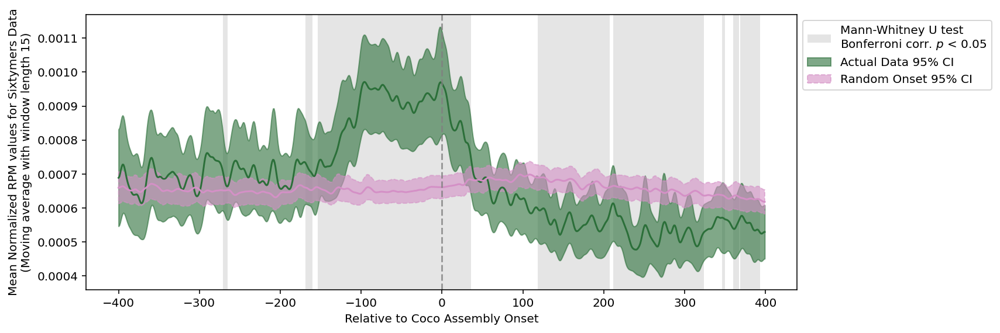

In [30]:
palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_average, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label="Actual Data 95% CI")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label="Random Onset 95% CI")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Coco Assembly Onset")
plt.ylabel("Mean Normalized RPM values for Sixtymers Data\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

#### Ribosome colision peak enrichment around onset

In [31]:
flank = 200
metag = np.full((number_of_offset, flank * 2), np.nan)
ind = 0
for gene_id in I.gene_list:
    ons = gene_onset[gene_id]
    col = gene_collision[gene_id]
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    if not np.isnan(ons) and rpkm_background > rpkm_threshold_for_sixtymers:
        arr = np.arange(ons - flank, ons + flank)
        marr = np.isin(arr, col).astype(float)
        marr[arr < 0] = np.nan
        marr[arr > gene_lengths[gene_id]] = np.nan
        assert len(marr) == flank * 2
        metag[ind] = marr
        ind += 1
ind

4085

In [32]:
# RANDOM Onset
onset_gene = 25
metag_average = np.full((number_of_offset * onset_gene, flank * 2), np.nan)
ind = 0
for gene_id in I.gene_list:
    ons = gene_onset[gene_id]
    col = gene_collision[gene_id]
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    if not np.isnan(ons) and rpkm_background > rpkm_threshold_for_sixtymers:
        for _ in range(onset_gene):
            ons = np.random.randint(gene_lengths[gene_id])
            arr = np.arange(ons - flank, ons + flank)
            marr = np.isin(arr, col).astype(float)
            marr[arr < 0] = np.nan
            marr[arr > gene_lengths[gene_id]] = np.nan
            assert len(marr) == flank * 2
            metag_average[ind] = marr
            ind += 1
ind

102125

In [33]:
m1 = np.array([smooth_array(i, 15, "hanning") for i in metag])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_average])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
print(signif_rnges)

Progress: |████████████████████| 100.0% 
[[98, 112], [116, 116], [118, 135], [138, 155], [170, 210], [347, 347]]


In [34]:
kk = 0.75 
bootstrap_ci = confidence_interval_poission(metag, confidence=kk)
bootstrap_ci_random = confidence_interval_poission(metag_average, confidence=1-((1-kk) / onset_gene))

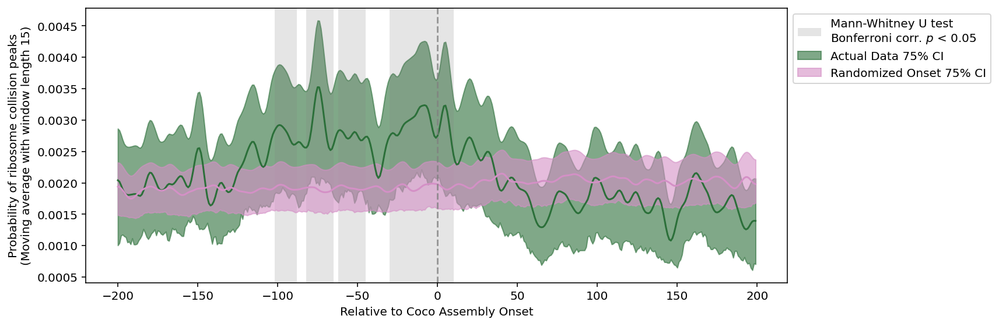

In [35]:
palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))
a1 = smooth_array(np.nanmean(metag, axis=0), 15, "hanning")
a2 = smooth_array(np.nanmean(metag_average, axis=0), 15, "hanning")

plt.plot(x_data, a1, alpha=1, color=palette[0])
plt.plot(x_data, a2, alpha=1, color=palette[1])
plt.fill_between(x_data, smooth_array(bootstrap_ci[0], 15, "flat"), smooth_array(bootstrap_ci[1], 15, "hanning"), 
                 alpha=0.6, color=palette[0], label="Actual Data 75% CI", zorder=0)
plt.fill_between(x_data,smooth_array(bootstrap_ci_random[0], 15, "flat"), smooth_array(bootstrap_ci_random[1], 15, "hanning"), 
                 alpha=0.6, color=palette[1], label="Randomized Onset 75% CI")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")

plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Coco Assembly Onset")
plt.ylabel("Probability of ribosome collision peaks\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

##### Why random onset cases are not horizontal line

In [11]:
data_plot = list()
for gene_id in I.gene_list:
    rpkm_bac = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    rpkm_exp = I.riboseq_sixtymers.experiment.calculate_rpkm_genes(gene_id)
    if rpkm_bac > 0.01 and rpkm_exp > 0.01:
        data_plot.append([gene_lengths[gene_id], rpkm_exp / rpkm_bac])
data_plot = np.array(data_plot).T
print(data_plot.shape)

(2, 13798)


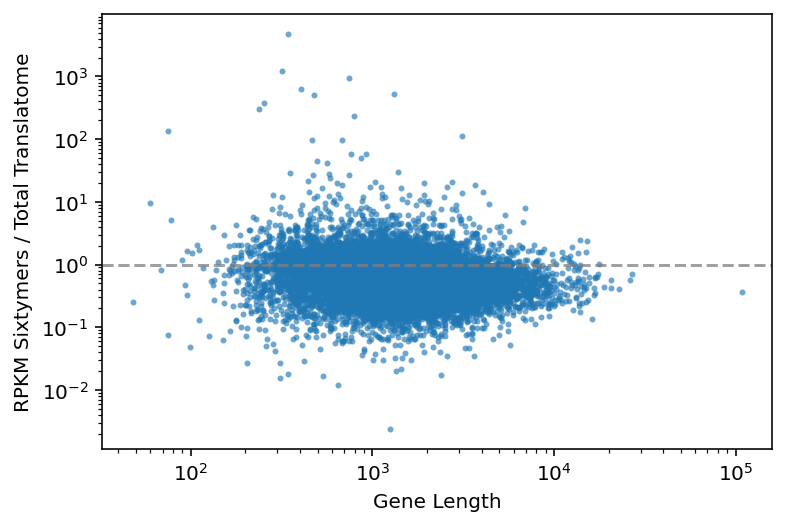

In [13]:
plt.scatter(data_plot[0], data_plot[1], linewidths=0, marker=".", alpha=0.65)
plt.axhline(1, color="gray", alpha=0.75, linestyle = "--")
plt.ylabel("RPKM Sixtymers / Total Translatome")
plt.xlabel("Gene Length")
plt.yscale("log")
plt.xscale("log")

Because the shorter genes tends to have more sixtymers / total translatome rpkm values. Since we normalize the sixtymers data with total translatome rpkm data, the values coming from shorter genes become more and more important. These short genes have impact on the middle points in the metagene profile, but not the edges. Edge average is therefore lower than the middle average in metagene profiles.

# Different Sigmoidal Curve Shapes

## Slope

#### With Normalized Sixtymers Data

In [563]:
import skimage.measure
from astropy import convolution
sio = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", "SlopeMyOnset"]]
sio.sort_values(by=['SlopeMyOnset'], inplace=True)

In [564]:
flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio["MyOnset"][sio["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
        exp_rpm_bs = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)
        normalized_sixtymers = exp_rpm_bs / rpkm_background
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = normalized_sixtymers[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

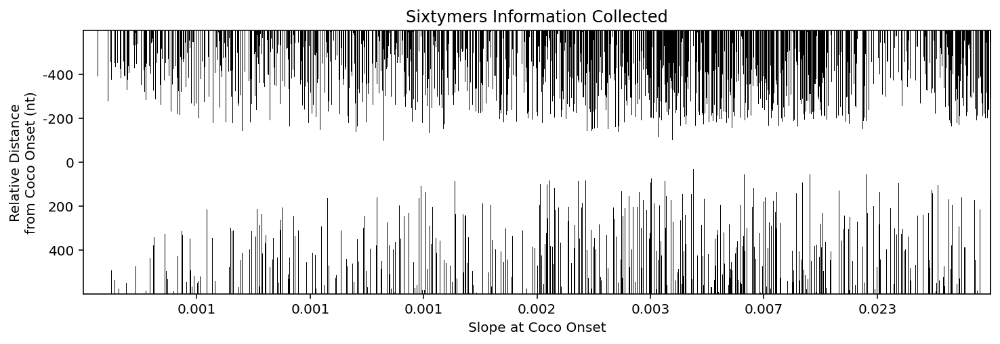

In [565]:
plt.figure(figsize=(12,12))
plt.imshow(~np.isnan(the_matrix), cmap='cubehelix', interpolation='nearest')

locs = np.linspace(0, the_matrix.shape[1], 9)[1:-1]
labels = ["%.3f" % (np.percentile(sio["SlopeMyOnset"], loc/the_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, the_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - the_matrix.shape[0]/2) / (the_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(the_matrix.shape[0] / 2, color="white", alpha=0.25, linestyle = "--")
plt.xlabel("Slope at Coco Onset")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Sixtymers Information Collected")
plt.show()

In [566]:
krnl = 17
a_matrix = skimage.measure.block_reduce(the_matrix, (4,4), np.nanmean)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl)))
print(the_matrix.shape)
print(a_matrix.shape)

(1200, 4121)
(300, 1031)


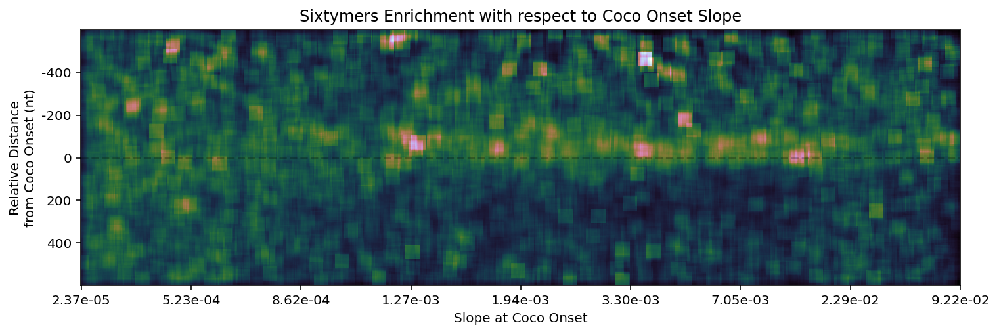

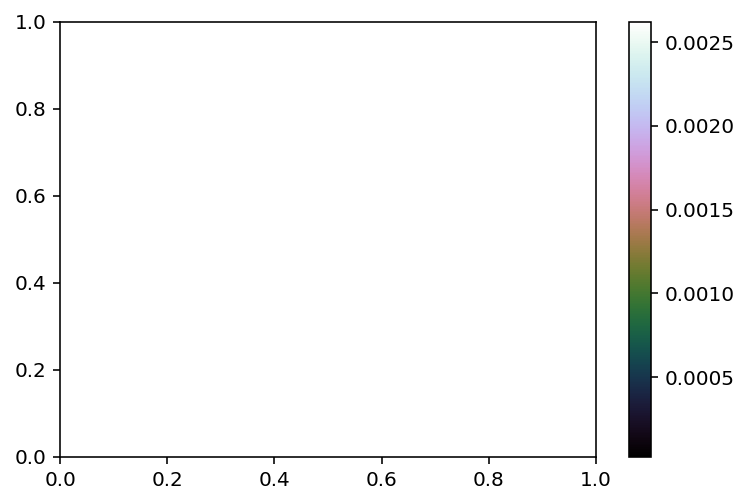

In [567]:
plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='cubehelix', interpolation='nearest')
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.2e" % (np.percentile(sio["SlopeMyOnset"], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Slope at Coco Onset")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Sixtymers Enrichment with respect to Coco Onset Slope")
plt.show()

plt.colorbar(im)
plt.show()

In [12]:
f1, f2 = 1.11e-3, 2.29e-2
print(f"Range: {f1, f2}")

Range: (0.00111, 0.0229)


In [13]:
lst = list()
for i in onsetdf["SlopeMyOnset"]:
    if pd.isna(i):
        lst.append(np.nan)
    elif i > f2:
        lst.append(3)
    elif i > f1:
        lst.append(2)
    else:
        lst.append(1)
onsetdf["SlopeClass"] = lst

In [55]:
narrawons = onsetdf[(~onsetdf.isna().any(axis=1))]
tbl = list()
for m_class in [1, 2, 3]:
    for o_conf in ["High", "Low"]:
        filt_temp = narrawons[(narrawons["Confidence"] == o_conf) & (narrawons["SlopeClass"] == m_class)]
        tbl.append(filt_temp.shape[0])
        #print(f"Class-{m_class}, Conf-{o_conf} {filt_temp.shape[0]}")
tbl = pd.DataFrame(np.array(tbl).reshape(3,2), columns = ["High", "Low"], index=[1,2,3])
tbl

,High,Low
1,302,1067
2,479,1759
3,49,465


In [56]:
chi_test = stats.chi2_contingency(tbl)
print(f"Chi-square test of independence (p-value): {chi_test[1]}")
print(f"Chi-square test of independence (expected-freq):\n{chi_test[3]}")

print(f"\nChi-square test of independence exluding class 3(p-value): {stats.chi2_contingency(tbl.iloc[:2,:])[1]}")
print("Therefore, class 3 has non independent frequency.")

Chi-square test of independence (p-value): 1.0703644649379393e-09
Chi-square test of independence (expected-freq):
[[ 275.72676535 1093.27323465]
 [ 450.74981801 1787.25018199]
 [ 103.52341665  410.47658335]]

Chi-square test of independence exluding class 3(p-value): 0.672188388877605
Therefore, class 3 has non independent frequency.


In [57]:
m_close = list()
m_count = list()
for ind, row_series in narrawons.iterrows():
    col = gene_collision[row_series["GeneID"]]
    ons = int(row_series["MyOnset"])
    closest_peak = (col-ons)[np.argmin(np.abs(col-ons))] if len(col) > 0 else np.nan
    closest_peak = closest_peak if closest_peak != 0 else 1
    m_close.append(closest_peak)
    m_count.append(len(col))

m_class = np.ones(narrawons.shape[0])
m_class[narrawons["SlopeMyOnset"] > f1] += 1
m_class[narrawons["SlopeMyOnset"] > f2] += 1

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    narrawons["ClosestPeakDistance"] = m_close
    narrawons["ClosestPeakDistanceAbsolute"] = np.abs(m_close)
    narrawons["PeakCount"] = m_count
    narrawons["SlopeClass"] = m_class.astype(int)
narrawons.head()

,GeneID,GeneName,MyOnset,PapersOnset,Confidence,GeneLength,PaperTotalRPKM,MySixtymersRPKM,MyTotalRPKM,SlopeMyOnset,HeightAssembly,WidthAssembly,SlopeClass,ClosestPeakDistance,ClosestPeakDistanceAbsolute,PeakCount
0,ENSG00000094914,AAAS,461.0,465.0,High,1638.0,0.121248,102.058374,89.765197,0.005300,0.497321,93.833881,2,15.0,15.0,9
1,ENSG00000081760,AACS,312.0,303.0,High,2016.0,0.023634,13.453680,20.600090,0.010595,0.556481,52.523687,2,382.0,382.0,2
2,ENSG00000109576,AADAT,418.0,558.0,Low,1275.0,0.005600,7.619262,10.523488,0.011941,0.427146,35.771692,2,-20.0,20.0,3
3,ENSG00000131043,AAR2,356.0,321.0,High,1152.0,0.061421,71.800416,65.873338,0.002370,0.283736,119.731143,2,-16.0,16.0,4
4,ENSG00000124608,AARS2,622.0,642.0,Low,2955.0,0.031557,27.380521,25.648697,0.000598,0.389167,650.791953,1,-71.0,71.0,8


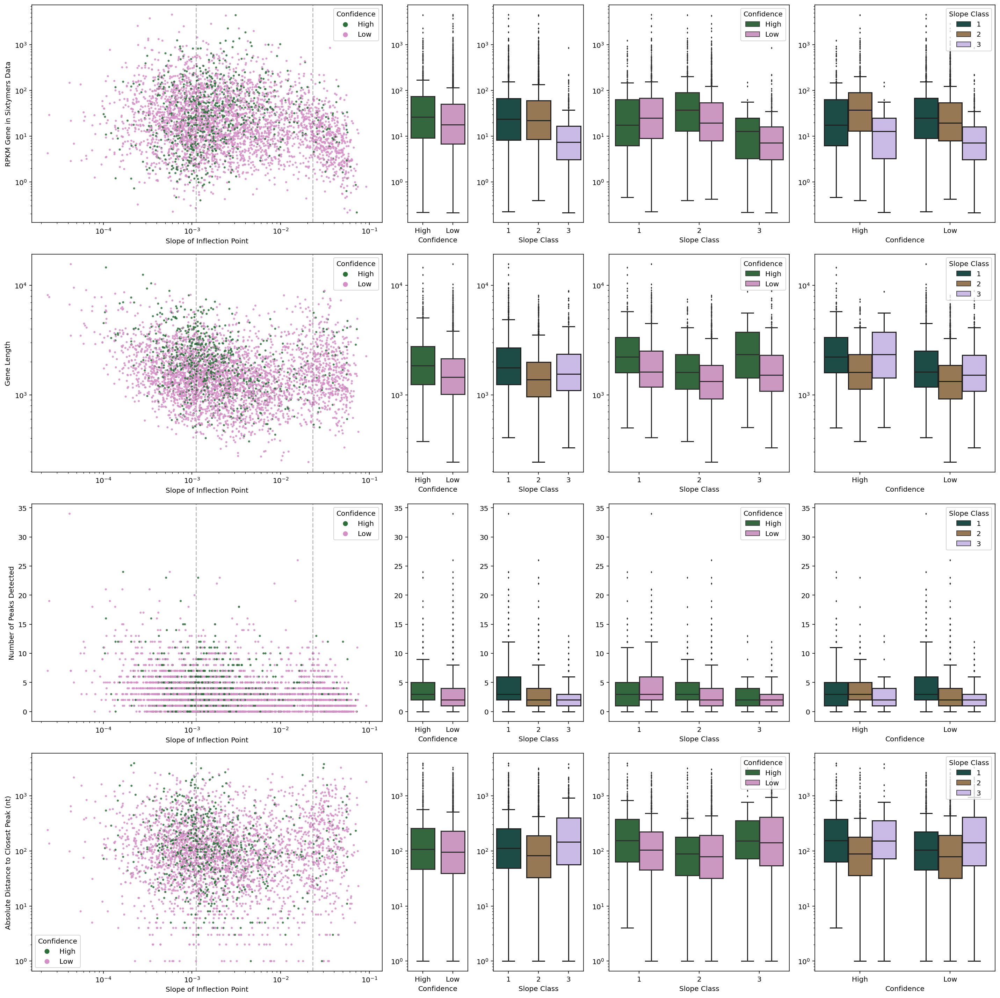

In [58]:
fig, ax = plt.subplots(4, 5, figsize=[4*(5), 5*(4)], gridspec_kw={'width_ratios': [1.75, 0.3, 0.45, 0.9, 0.9]})

for i, y_data, y_label, y_log, x_log in [
    [0, "MySixtymersRPKM", "RPKM Gene in Sixtymers Data", True, True],
    [1, "GeneLength", "Gene Length", True, True],
    [2, "PeakCount", "Number of Peaks Detected", False, True],
    [3, "ClosestPeakDistanceAbsolute", "Absolute Distance to Closest Peak (nt)", True, True],
]:

    sns.scatterplot(data=narrawons, x="SlopeMyOnset", y=y_data, 
                    hue="Confidence", hue_order=["High", "Low"], ax=ax[i,0], alpha=0.85, palette="cubehelix", linewidth=0, marker = ".")
    ax[i,0].axvline(f1, color="black", alpha=0.25, linestyle = "--")
    ax[i,0].axvline(f2, color="black", alpha=0.25, linestyle = "--")
    if y_log: ax[i,0].set_yscale("log")
    if x_log: ax[i,0].set_xscale("log")
    ax[i,0].set_xlabel("Slope of Inflection Point")
    ax[i,0].set_ylabel(y_label)
    #
    sns.boxplot(data=narrawons, x="Confidence", y=y_data, order=["High", "Low"],
                ax=ax[i,1], fliersize=1, palette="cubehelix")
    if y_log: ax[i,1].set_yscale("log")
    ax[i,1].set_xlabel("Confidence")
    ax[i,1].set_ylabel("")
    #
    sns.boxplot(data=narrawons, x="SlopeClass", y=y_data, order=[1, 2, 3],
                ax=ax[i,2], fliersize=1, palette="cubehelix")
    if y_log: ax[i,2].set_yscale("log")
    ax[i,2].set_xlabel("Slope Class")
    ax[i,2].set_ylabel("")
    #
    sns.boxplot(data=narrawons, x="SlopeClass", y=y_data, hue="Confidence", order=[1, 2, 3], hue_order=["High", "Low"], 
                ax=ax[i,3], fliersize=1, palette="cubehelix")
    if y_log: ax[i,3].set_yscale("log")
    ax[i,3].set_xlabel("Slope Class")
    ax[i,3].set_ylabel("")
    ax[i,3].legend(title="Confidence", loc="upper right")
    #
    sns.boxplot(data=narrawons, x="Confidence", y=y_data, hue="SlopeClass", order=["High", "Low"], hue_order=[1,2,3], 
                ax=ax[i,4], fliersize=1, palette="cubehelix")
    if y_log: ax[i,4].set_yscale("log")
    ax[i,4].set_xlabel("Confidence")
    ax[i,4].set_ylabel("")
    ax[i,4].legend(title="Slope Class",loc="upper right")
    
plt.tight_layout()
plt.show()

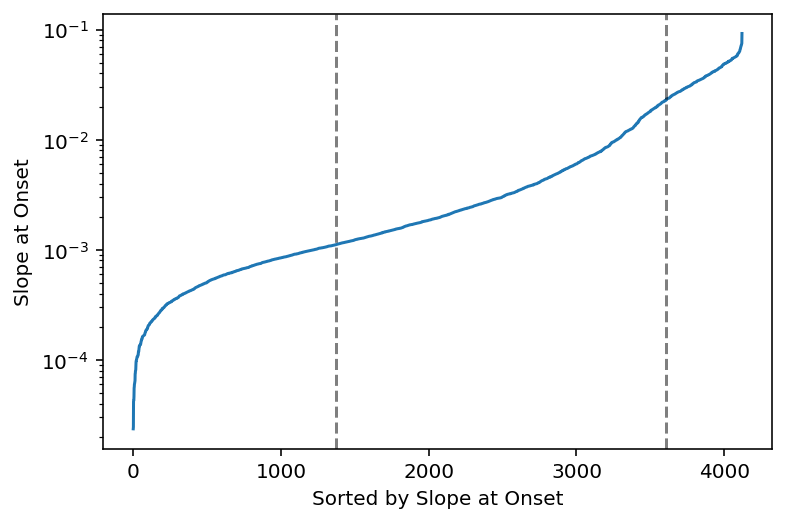

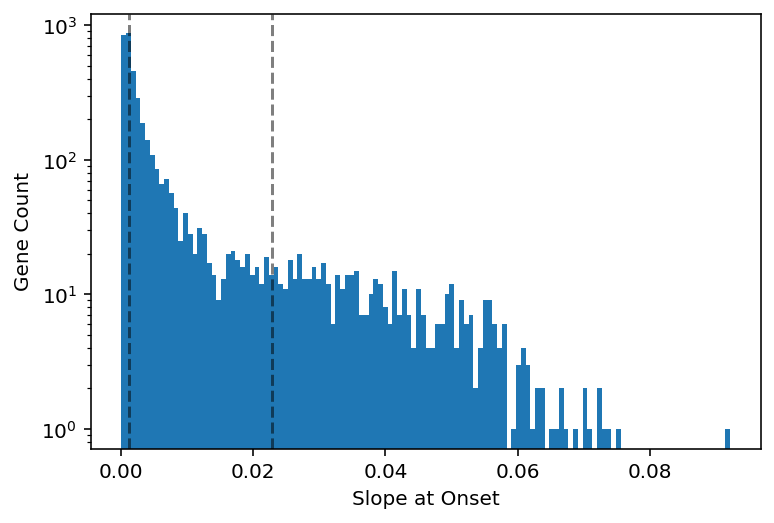

In [59]:
k = np.sort(narrawons["SlopeMyOnset"])
m1 = np.where(k > f1)[0][0]
m2 = np.where(k > f2)[0][0]

plt.plot(k)
plt.axvline(m1, color="black", alpha=0.5, linestyle = "--")
plt.axvline(m2, color="black", alpha=0.5, linestyle = "--")
plt.yscale("log")
plt.ylabel("Slope at Onset")
plt.xlabel("Sorted by Slope at Onset")
plt.show()

plt.hist(k, bins=128)
plt.yscale("log")
plt.axvline(f1, color="black", alpha=0.5, linestyle = "--")
plt.axvline(f2, color="black", alpha=0.5, linestyle = "--")
plt.ylabel("Gene Count")
plt.xlabel("Slope at Onset")
plt.show()

## Height

#### With Normalized Sixtymers Data

In [61]:
import skimage.measure
from astropy import convolution
sioh = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", "HeightAssembly"]]
sioh.sort_values(by=['HeightAssembly'], inplace=True)

In [62]:
flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sioh.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sioh["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sioh["MyOnset"][sioh["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
        exp_rpm_bs = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)
        normalized_sixtymers = exp_rpm_bs / rpkm_background
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = normalized_sixtymers[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

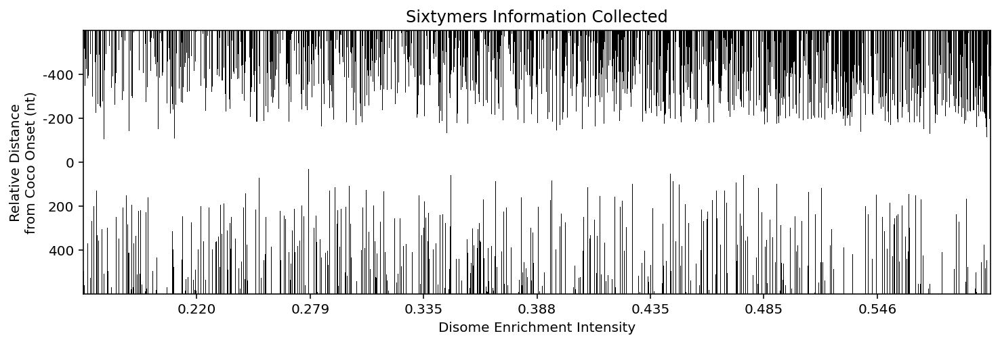

In [63]:
plt.figure(figsize=(12,12))
plt.imshow(~np.isnan(the_matrix), cmap='cubehelix', interpolation='nearest')

locs = np.linspace(0, the_matrix.shape[1], 9)[1:-1]
labels = ["%.3f" % (np.percentile(sioh["HeightAssembly"], loc/the_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, the_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - the_matrix.shape[0]/2) / (the_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(the_matrix.shape[0] / 2, color="white", alpha=0.25, linestyle = "--")
plt.xlabel("Disome Enrichment Intensity")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Sixtymers Information Collected")
plt.show()

In [64]:
krnl = 15
a_matrix = skimage.measure.block_reduce(the_matrix, (4,4), np.nanmean)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl)))
print(the_matrix.shape)
print(a_matrix.shape)

/home/kai/anaconda3/envs/kemals/lib/python3.6/site-packages/skimage/measure/block.py:87: RuntimeWarning: Mean of empty slice
  **func_kwargs)


(1200, 4121)
(300, 1031)


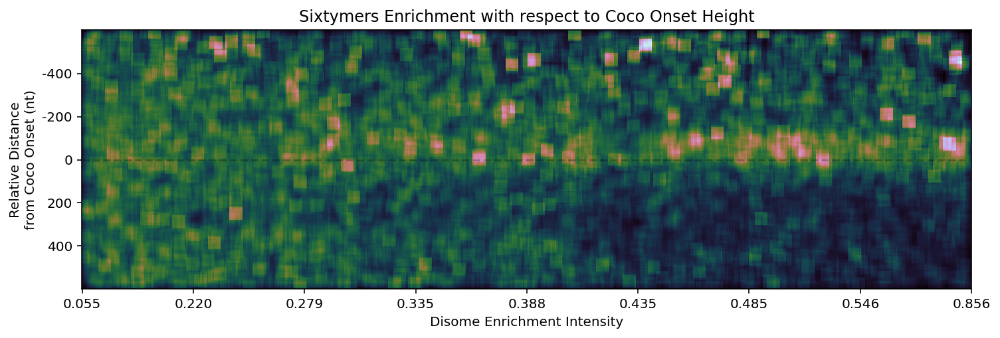

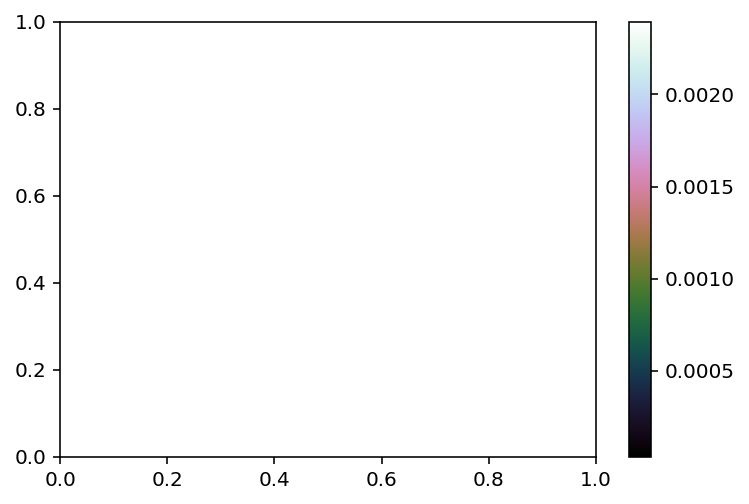

In [65]:
plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='cubehelix', interpolation='nearest')
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sioh["HeightAssembly"], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Disome Enrichment Intensity")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Sixtymers Enrichment with respect to Coco Onset Height")
plt.show()

plt.colorbar(im)
plt.show()

In [66]:
narrawons = onsetdf[(~onsetdf.isna().any(axis=1))]

m_close = list()
m_count = list()
for ind, row_series in narrawons.iterrows():
    col = gene_collision[row_series["GeneID"]]
    ons = int(row_series["MyOnset"])
    closest_peak = (col-ons)[np.argmin(np.abs(col-ons))] if len(col) > 0 else np.nan
    closest_peak = closest_peak if closest_peak != 0 else 1
    m_close.append(closest_peak)
    m_count.append(len(col))

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    narrawons["ClosestPeakDistance"] = m_close
    narrawons["ClosestPeakDistanceAbsolute"] = np.abs(m_close)
    narrawons["PeakCount"] = m_count
narrawons.head()

,GeneID,GeneName,MyOnset,PapersOnset,Confidence,GeneLength,PaperTotalRPKM,MySixtymersRPKM,MyTotalRPKM,SlopeMyOnset,HeightAssembly,WidthAssembly,SlopeClass,ClosestPeakDistance,ClosestPeakDistanceAbsolute,PeakCount
0,ENSG00000094914,AAAS,461.0,465.0,High,1638.0,0.121248,102.058374,89.765197,0.005300,0.497321,93.833881,2.0,15.0,15.0,9
1,ENSG00000081760,AACS,312.0,303.0,High,2016.0,0.023634,13.453680,20.600090,0.010595,0.556481,52.523687,2.0,382.0,382.0,2
2,ENSG00000109576,AADAT,418.0,558.0,Low,1275.0,0.005600,7.619262,10.523488,0.011941,0.427146,35.771692,2.0,-20.0,20.0,3
3,ENSG00000131043,AAR2,356.0,321.0,High,1152.0,0.061421,71.800416,65.873338,0.002370,0.283736,119.731143,2.0,-16.0,16.0,4
4,ENSG00000124608,AARS2,622.0,642.0,Low,2955.0,0.031557,27.380521,25.648697,0.000598,0.389167,650.791953,1.0,-71.0,71.0,8


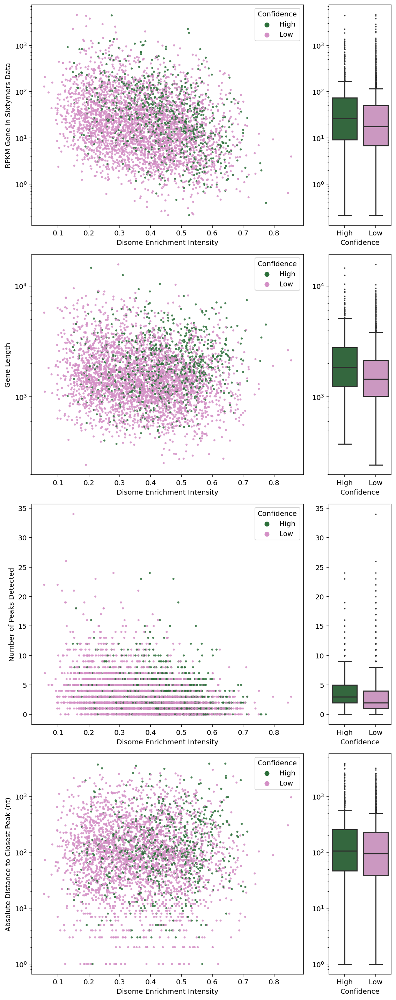

In [67]:
fig, ax = plt.subplots(4, 2, figsize=[4*(2), 5*(4)], gridspec_kw={'width_ratios': [1.75, 0.4]})

for i, y_data, y_label, y_log, x_log in [
    [0, "MySixtymersRPKM", "RPKM Gene in Sixtymers Data", True, False],
    [1, "GeneLength", "Gene Length", True, False],
    [2, "PeakCount", "Number of Peaks Detected", False, False],
    [3, "ClosestPeakDistanceAbsolute", "Absolute Distance to Closest Peak (nt)", True, False],
]:

    sns.scatterplot(data=narrawons, x="HeightAssembly", y=y_data, 
                    hue="Confidence", hue_order=["High", "Low"], ax=ax[i,0], alpha=0.85, palette="cubehelix", linewidth=0, marker = ".")
    if y_log: ax[i,0].set_yscale("log")
    if x_log: ax[i,0].set_xscale("log")
    ax[i,0].set_xlabel("Disome Enrichment Intensity")
    ax[i,0].set_ylabel(y_label)
    #
    sns.boxplot(data=narrawons, x="Confidence", y=y_data, order=["High", "Low"],
                ax=ax[i,1], fliersize=1, palette="cubehelix")
    if y_log: ax[i,1].set_yscale("log")
    ax[i,1].set_xlabel("Confidence")
    ax[i,1].set_ylabel("")
    
plt.tight_layout()
plt.show()

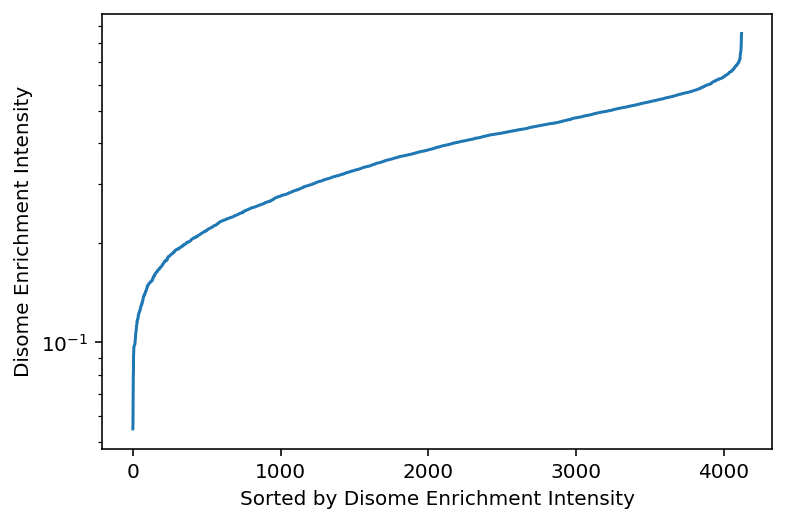

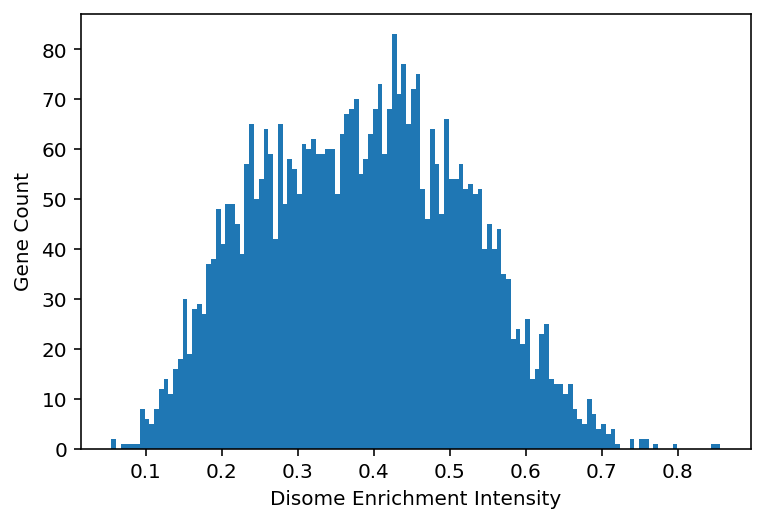

In [68]:
k = np.sort(narrawons["HeightAssembly"])

plt.plot(k)
plt.yscale("log")
plt.ylabel("Disome Enrichment Intensity")
plt.xlabel("Sorted by Disome Enrichment Intensity")
plt.show()

plt.hist(k, bins=128)
#plt.yscale("log")
plt.ylabel("Gene Count")
plt.xlabel("Disome Enrichment Intensity")
plt.show()

## Monosome Depletion

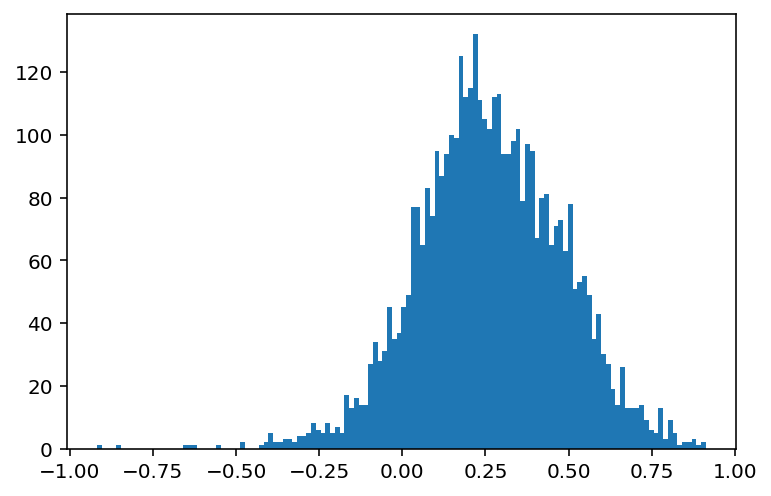

In [70]:
k=temp_df["MonosomeDepletion"][np.isfinite(temp_df["MonosomeDepletion"])]
plt.hist(k, bins=128);

In [71]:
import skimage.measure
from astropy import convolution
siomd = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", "MonosomeDepletion"]]
siomd.sort_values(by=['MonosomeDepletion'], inplace=True)

In [72]:
flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((siomd.shape[0], flank*2), np.nan)
ind = 0
for gene_id in siomd["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(siomd["MyOnset"][siomd["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
        exp_rpm_bs = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)
        normalized_sixtymers = exp_rpm_bs / rpkm_background
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = normalized_sixtymers[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

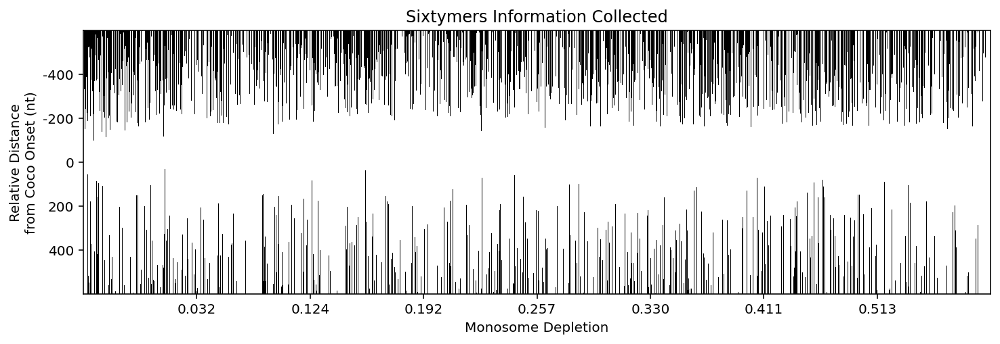

In [73]:
plt.figure(figsize=(12,12))
plt.imshow(~np.isnan(the_matrix), cmap='cubehelix', interpolation='nearest')

locs = np.linspace(0, the_matrix.shape[1], 9)[1:-1]
labels = ["%.3f" % (np.percentile(siomd["MonosomeDepletion"], loc/the_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, the_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - the_matrix.shape[0]/2) / (the_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(the_matrix.shape[0] / 2, color="white", alpha=0.25, linestyle = "--")
plt.xlabel("Monosome Depletion")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Sixtymers Information Collected")
plt.show()

In [74]:
krnl = 13
a_matrix = skimage.measure.block_reduce(the_matrix, (4,4), np.nanmean)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl)))
print(the_matrix.shape)
print(a_matrix.shape)

(1200, 4121)
(300, 1031)


/home/kai/anaconda3/envs/kemals/lib/python3.6/site-packages/skimage/measure/block.py:87: RuntimeWarning: Mean of empty slice
  **func_kwargs)


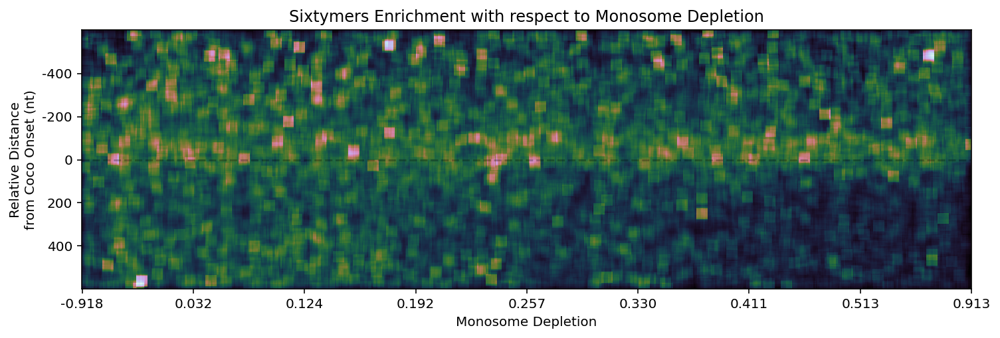

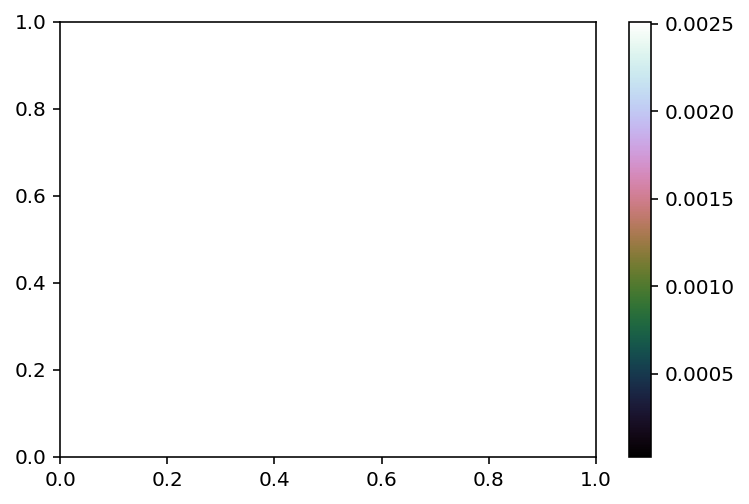

In [76]:
plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='cubehelix', interpolation='nearest')
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(siomd["MonosomeDepletion"], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Monosome Depletion")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Sixtymers Enrichment with respect to Monosome Depletion")
plt.show()

plt.colorbar(im)
plt.show()

## Some More Plots

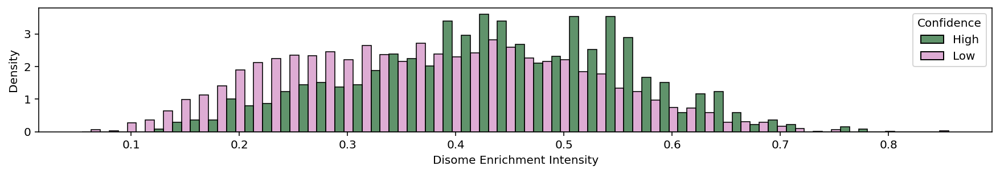

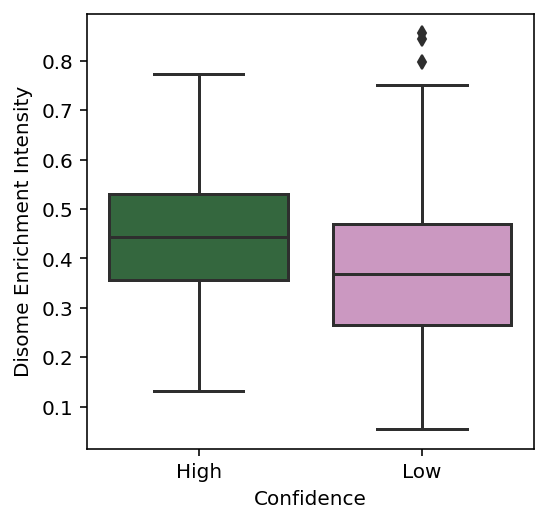

In [79]:
plt.figure(figsize=(15,2))
sns.histplot(data=temp_df, x="HeightAssembly", hue="Confidence", 
             multiple="dodge", stat="density", bins=48, palette="cubehelix", common_norm=False)
plt.xlabel("Disome Enrichment Intensity")
plt.show()

plt.figure(figsize=(4,4))
sns.boxplot(data=temp_df, x="Confidence", y="HeightAssembly", palette="cubehelix")
plt.ylabel("Disome Enrichment Intensity")
plt.show()

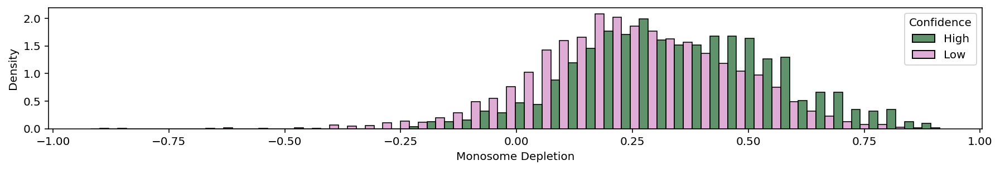

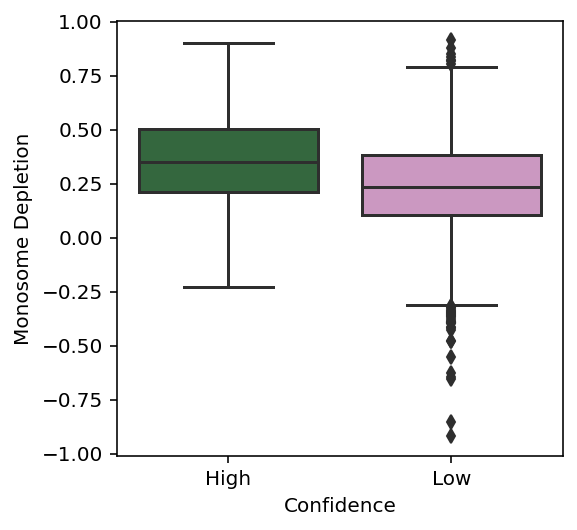

In [78]:
plt.figure(figsize=(15,2))
sns.histplot(data=temp_df, x="MonosomeDepletion", hue="Confidence", 
             multiple="dodge", stat="density", bins=48, palette="cubehelix", common_norm=False)
plt.xlabel("Monosome Depletion")
plt.show()

plt.figure(figsize=(4,4))
sns.boxplot(data=temp_df, x="Confidence", y="MonosomeDepletion", palette="cubehelix")
plt.ylabel("Monosome Depletion")
plt.show()

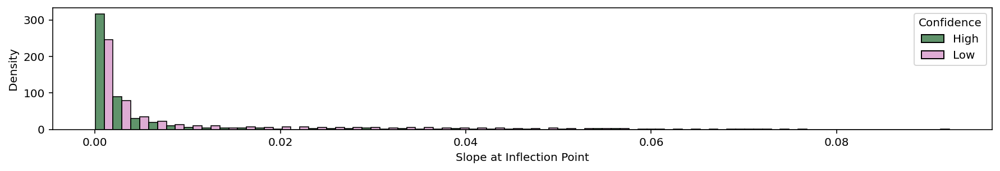

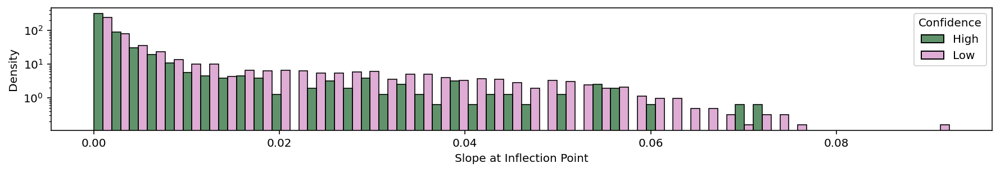

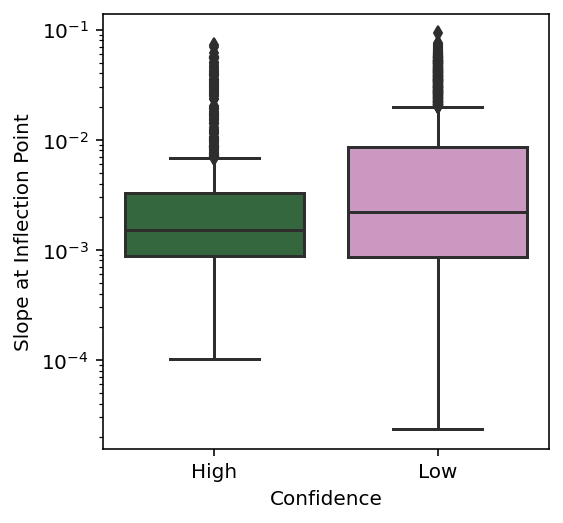

In [80]:
plt.figure(figsize=(15,2))
sns.histplot(data=temp_df, x="SlopeMyOnset", hue="Confidence", 
             multiple="dodge", stat="density", bins=48, palette="cubehelix", common_norm=False)
plt.xlabel("Slope at Inflection Point")
plt.show()

plt.figure(figsize=(15,2))
sns.histplot(data=temp_df, x="SlopeMyOnset", hue="Confidence", 
             multiple="dodge", stat="density", bins=48, palette="cubehelix", common_norm=False)
plt.xlabel("Slope at Inflection Point")
plt.yscale("log")
plt.show()

plt.figure(figsize=(4,4))
sns.boxplot(data=temp_df, x="Confidence", y="SlopeMyOnset", palette="cubehelix")
plt.ylabel("Slope at Inflection Point")
plt.yscale("log")
plt.show()

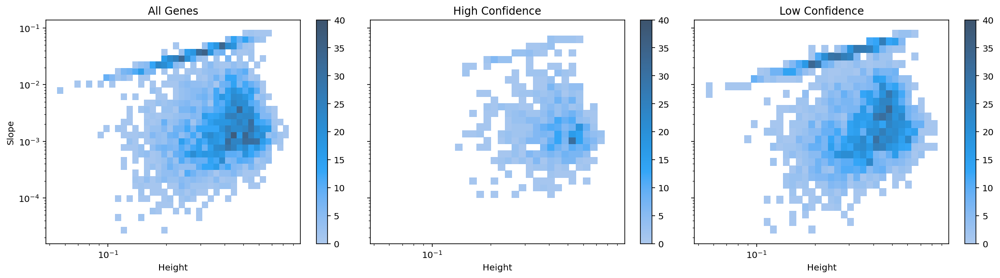

In [81]:
fig, ax = plt.subplots(1, 3, figsize=[16, 4.5], sharex=True, sharey=True) 

sns.histplot(data=temp_df, y="SlopeMyOnset", x="HeightAssembly",
             log_scale=(True, True), cbar=True, ax=ax[0], vmin=0, vmax=40,)
ax[0].set_ylabel("Slope")
ax[0].set_xlabel("Height")
ax[0].set_title("All Genes")

sns.histplot(data=temp_df[temp_df["Confidence"] == "High"], y="SlopeMyOnset", x="HeightAssembly",
             log_scale=(True, True), cbar=True, ax=ax[1], vmin=0, vmax=40,)
ax[1].set_ylabel("Slope")
ax[1].set_xlabel("Height")
ax[1].set_title("High Confidence")

sns.histplot(data=temp_df[temp_df["Confidence"] == "Low"], y="SlopeMyOnset", x="HeightAssembly",
             log_scale=(True, True), cbar=True, ax=ax[2], vmin=0, vmax=40,)
ax[2].set_ylabel("Slope")
ax[2].set_xlabel("Height")
ax[2].set_title("Low Confidence")

plt.tight_layout()
plt.show()

Check weird sharp slopes section

## Weird Sharp Slopes

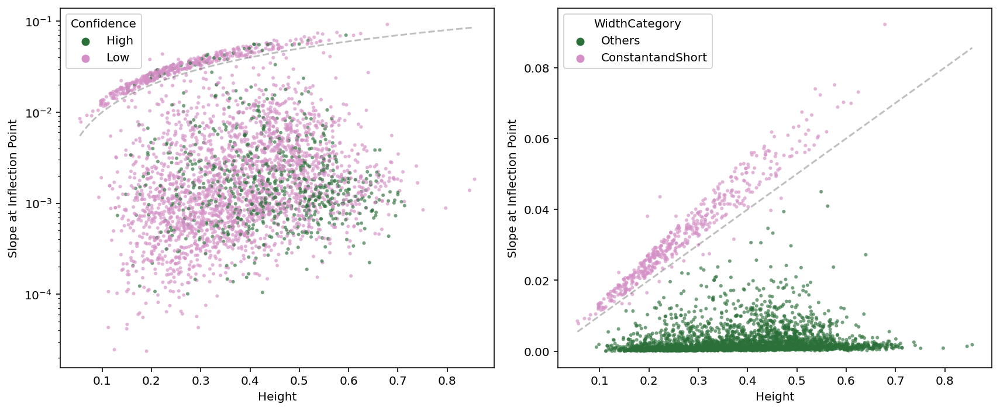

In [88]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
x_data = np.linspace(temp_df["HeightAssembly"].min(), temp_df["HeightAssembly"].max(), 1000)
sns.scatterplot(data=temp_df, x="HeightAssembly", y="SlopeMyOnset", hue="WidthCategory", alpha=0.65,
                palette="cubehelix", linewidth=0, marker = ".", ax=ax[1])
ax[0].plot(x_data, x_data / 10, color="black", alpha=0.25, linestyle = "--")
ax[0].set_xlabel("Height")
ax[0].set_ylabel("Slope at Inflection Point")
ax[0].set_yscale("log")

sns.scatterplot(data=temp_df, x="HeightAssembly", y="SlopeMyOnset", hue="Confidence", alpha=0.65,
                palette="cubehelix", linewidth=0, marker = ".", hue_order=["High", "Low"], ax=ax[0])
ax[1].set_xlabel("Height")
ax[1].set_ylabel("Slope at Inflection Point")
ax[1].plot(x_data, x_data / 10, color="black", alpha=0.25, linestyle = "--")

plt.tight_layout()

Interesting.. Because a certain number of coco assembl completed within a certain nucleotide number. Let'me show it more clearly.

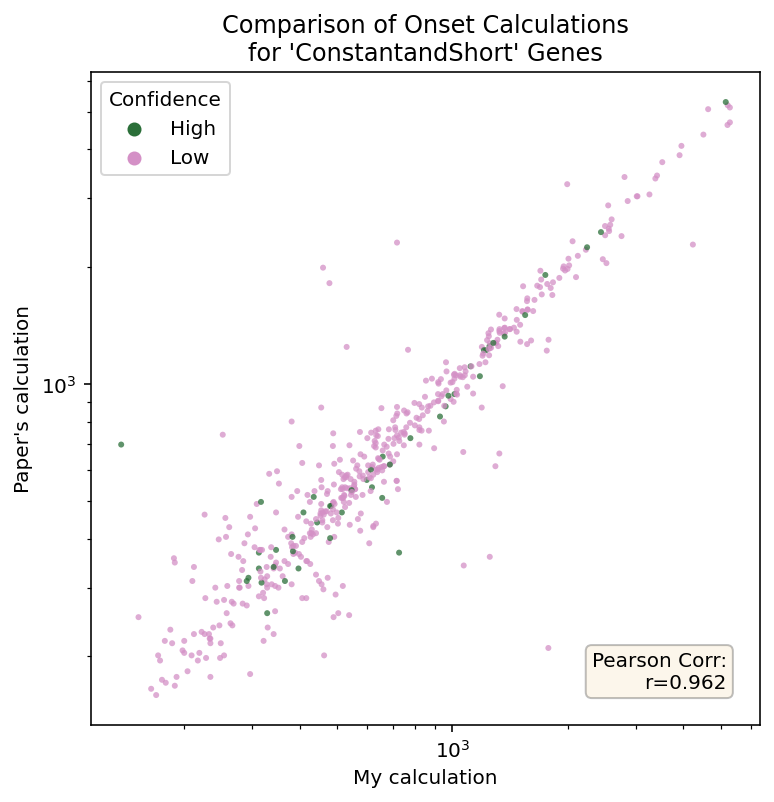

In [89]:
# Make sure I calculated correctly..
plt.figure(figsize=(6, 6))
temp_df_k = temp_df[(temp_df["WidthCategory"] == "ConstantandShort")].sort_values("SlopeMyOnset") 
sns.scatterplot(data=temp_df_k, y="PapersOnset", x="MyOnset", hue="Confidence", alpha=0.75,
                palette="cubehelix", linewidth=0, marker = ".", hue_order=["High", "Low"])
r_all_k = stats.pearsonr(temp_df_k["MyOnset"], temp_df_k["PapersOnset"])
plt.text(0.95, 0.05, "Pearson Corr:\nr=%.3f" % r_all_k[0], 
            transform=plt.gca().transAxes, verticalalignment='bottom', horizontalalignment="right", alpha=1,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.25))

plt.xlabel("My calculation")
plt.ylabel("Paper's calculation")
plt.title(f"Comparison of Onset Calculations\nfor 'ConstantandShort' Genes")
plt.xscale("log")
plt.yscale("log")
plt.show()

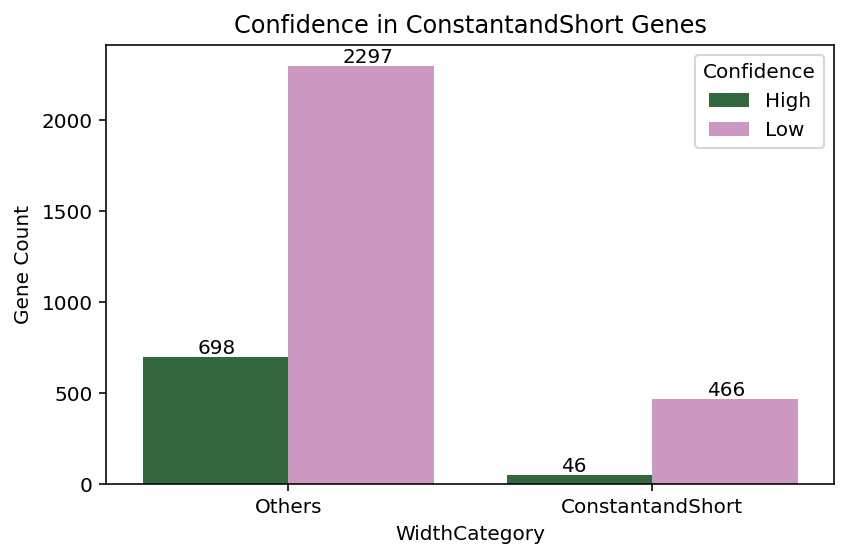

In [90]:
ax = sns.countplot(data=temp_df, x="WidthCategory", hue="Confidence", palette="cubehelix", hue_order=["High", "Low"])
plt.ylabel("Gene Count")
for p in ax.patches:
    ax.annotate('{:1d}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+20))
plt.title("Confidence in ConstantandShort Genes")
plt.tight_layout()

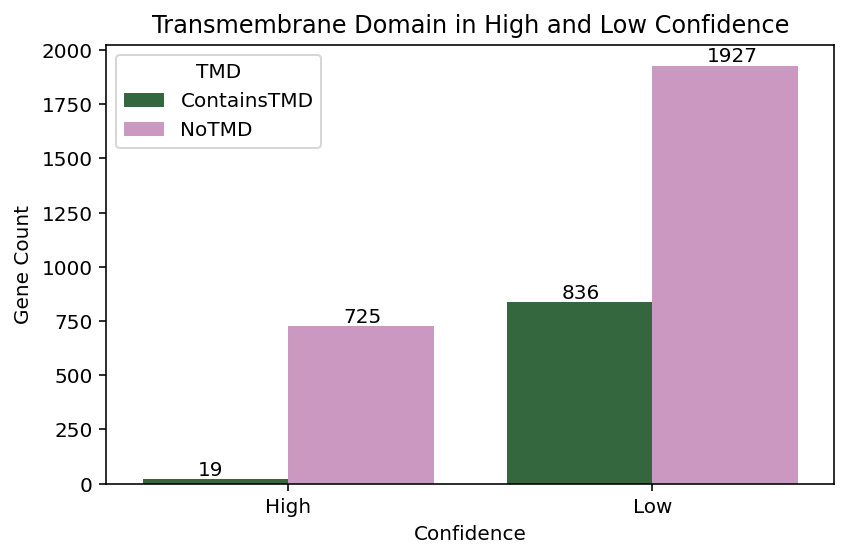

In [91]:
ax = sns.countplot(data=temp_df, x="Confidence", hue="TMD", palette="cubehelix", hue_order=["ContainsTMD", "NoTMD"])
plt.ylabel("Gene Count")
for p in ax.patches:
    ax.annotate('{:1d}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+20))
plt.title("Transmembrane Domain in High and Low Confidence")
plt.tight_layout()

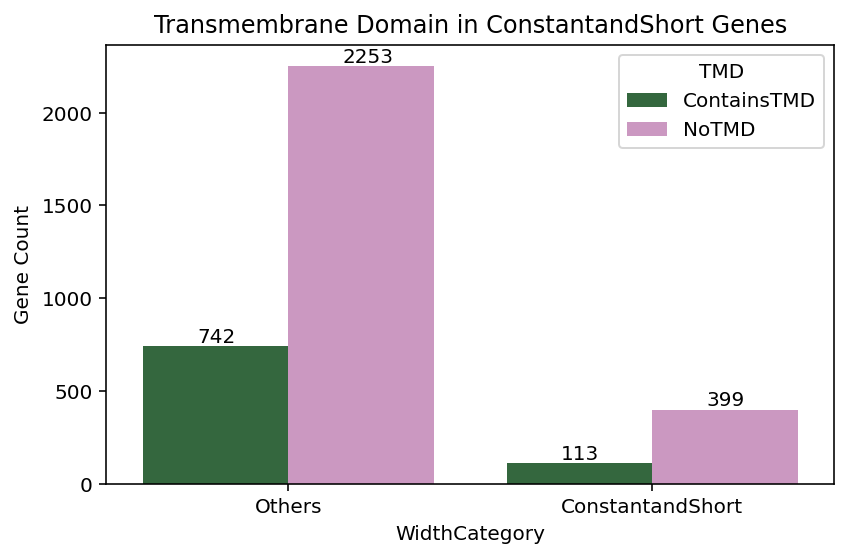

In [92]:
ax = sns.countplot(data=temp_df, x="WidthCategory", hue="TMD", palette="cubehelix", hue_order=["ContainsTMD", "NoTMD"])
plt.ylabel("Gene Count")
for p in ax.patches:
    ax.annotate('{:1d}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+20))
plt.title("Transmembrane Domain in ConstantandShort Genes")
plt.tight_layout()

#### Check if the onset point is at intron - exon junction. 

In [93]:
closest_junction = list()
for gene_id in temp_df_k["GeneID"]:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0,0]
    strand = I.gene_info[gene_id].strand
    ons = int(temp_df_k[temp_df_k["GeneID"] == gene_id].iloc[0]["MyOnset"])
    kl, k = list(), 0
    for i,j in I.protein_genome.db[best_transcript][0]:
        k += j-i+1 if strand == "+" else i-j+1
        kl.append(k)
    cj = min(kl, key=lambda x:abs(x-ons))
    closest_junction.append(cj)
closest_junction = np.array(closest_junction)
## 
closest_junction_global = list()
for gene_id in temp_df["GeneID"]:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0,0]
    strand = I.gene_info[gene_id].strand
    ons = int(temp_df[temp_df["GeneID"] == gene_id].iloc[0]["MyOnset"])
    kl, k = list(), 0
    for i,j in I.protein_genome.db[best_transcript][0]:
        k += j-i+1 if strand == "+" else i-j+1
        kl.append(k)
    cj = min(kl, key=lambda x:abs(x-ons))
    closest_junction_global.append(cj)
closest_junction_global = np.array(closest_junction_global)

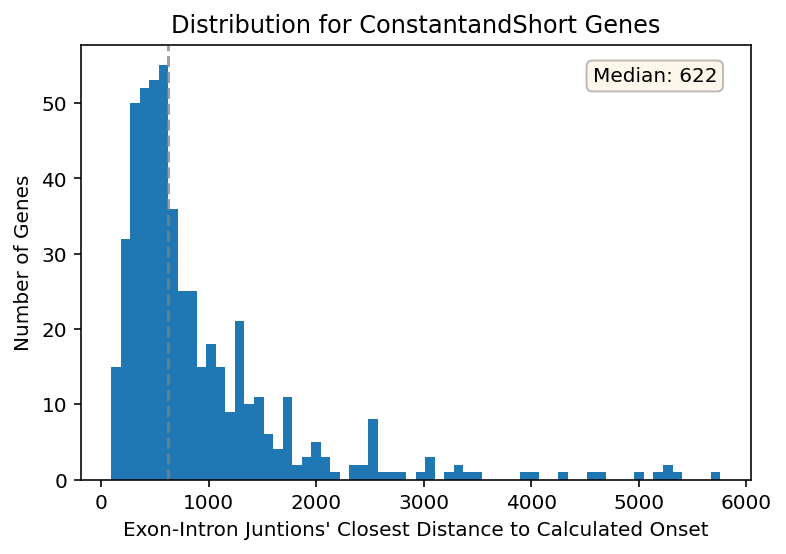

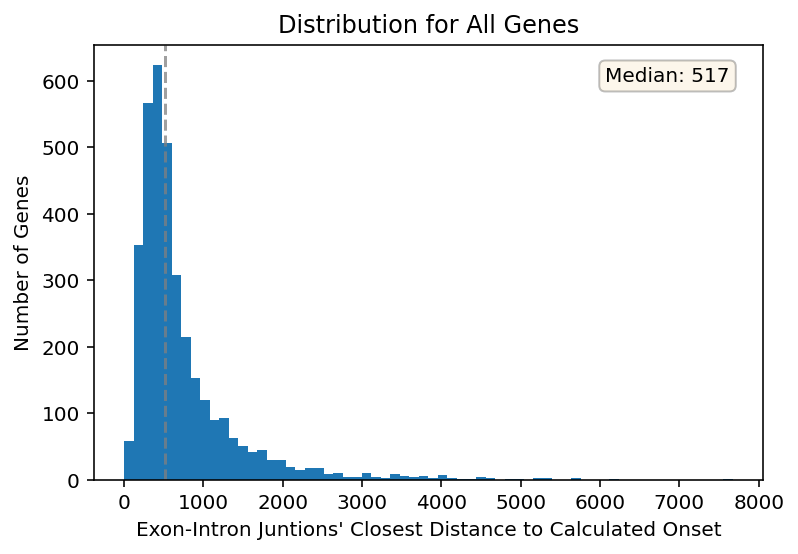

In [94]:
plt.hist(closest_junction, bins=64)
plt.xlabel("Exon-Intron Juntions' Closest Distance to Calculated Onset")
plt.ylabel("Number of Genes")
plt.title("Distribution for ConstantandShort Genes")
the_median = np.median(closest_junction)
plt.axvline(the_median, color="gray", alpha=0.75, linestyle = "--")
plt.text(0.95, 0.95, "Median: %2d" % (the_median), 
            transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment="right", alpha=1,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.25))
plt.show()

plt.hist(closest_junction_global, bins=64)
plt.xlabel("Exon-Intron Juntions' Closest Distance to Calculated Onset")
plt.ylabel("Number of Genes")
plt.title("Distribution for All Genes")
the_median = np.median(closest_junction_global)
plt.axvline(the_median, color="gray", alpha=0.75, linestyle = "--")
plt.text(0.95, 0.95, "Median: %2d" % (the_median), 
            transform=plt.gca().transAxes, verticalalignment='top', horizontalalignment="right", alpha=1,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.25))
plt.show()

## Categorization for Further Analysis

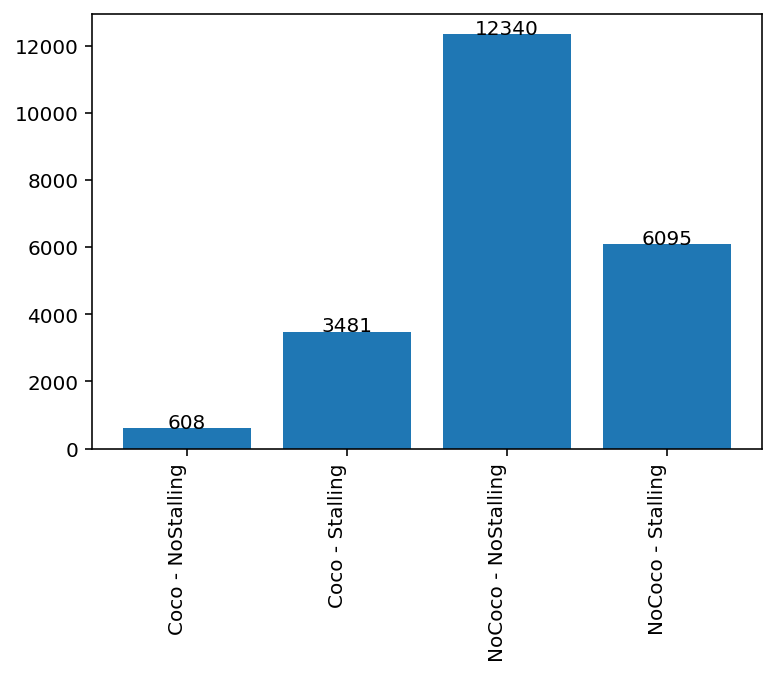

In [20]:
coco_genes = list(temp_df['GeneID'])
coco_nostalling = [gene_id for gene_id in I.gene_list if gene_id in coco_genes and len(gene_collision[gene_id]) == 0]
coco_stalling = [gene_id for gene_id in I.gene_list if gene_id in coco_genes and len(gene_collision[gene_id]) != 0]
nococo_nostalling = [gene_id for gene_id in I.gene_list if gene_id not in coco_genes and len(gene_collision[gene_id]) == 0]
nococo_stalling = [gene_id for gene_id in I.gene_list if gene_id not in coco_genes and len(gene_collision[gene_id]) != 0]

labels_cls = ["Coco - NoStalling", "Coco - Stalling", "NoCoco - NoStalling", "NoCoco - Stalling"]
counts_cls = [len(coco_nostalling), len(coco_stalling), len(nococo_nostalling), len(nococo_stalling)]
plt.bar(labels_cls, counts_cls)
for i, v in enumerate(counts_cls):
    plt.text(i, v, str(v), ha="center")
plt.xticks(rotation=90, ha='right')
count_plot_ylim= plt.ylim()
plt.show()

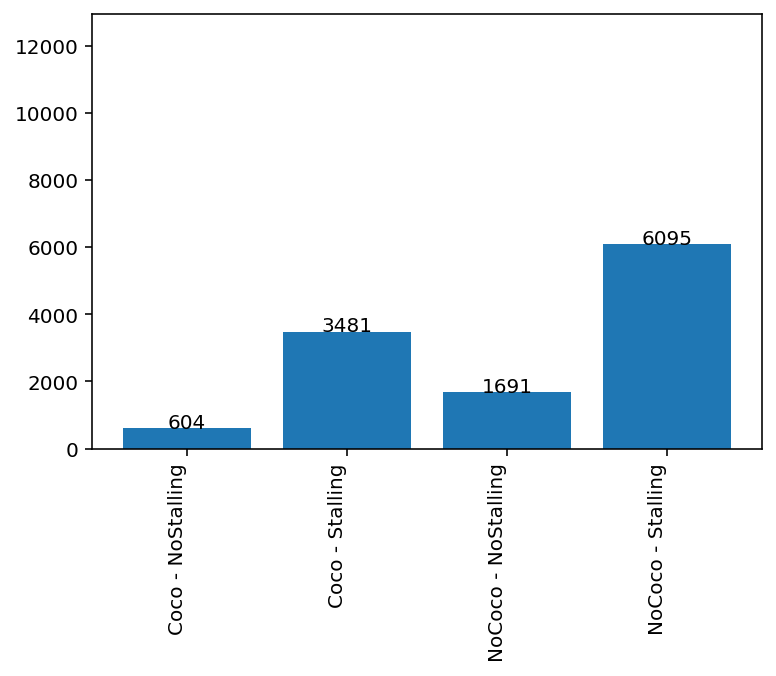

In [21]:
rpkm_thr = 1
coco_nostalling = [i for i in coco_nostalling if I.riboseq_sixtymers.background.calculate_rpkm_genes(i) > rpkm_thr]
coco_stalling = [i for i in coco_stalling if I.riboseq_sixtymers.background.calculate_rpkm_genes(i) > rpkm_thr]
nococo_nostalling = [i for i in nococo_nostalling if I.riboseq_sixtymers.background.calculate_rpkm_genes(i) > rpkm_thr]
nococo_stalling = [i for i in nococo_stalling if I.riboseq_sixtymers.background.calculate_rpkm_genes(i) > rpkm_thr]
low_rpkms = [i for i in I.gene_list if I.riboseq_sixtymers.background.calculate_rpkm_genes(i) <= rpkm_thr]

labels_cls = ["Coco - NoStalling", "Coco - Stalling", "NoCoco - NoStalling", "NoCoco - Stalling"]
counts_cls = [len(coco_nostalling), len(coco_stalling), len(nococo_nostalling), len(nococo_stalling)]
plt.bar(labels_cls, counts_cls)
for i, v in enumerate(counts_cls):
    plt.text(i, v, str(v), ha="center")
plt.xticks(rotation=90, ha='right')
plt.ylim(count_plot_ylim)
plt.show()

#### RPKM and Sixtymers Signal Relationship in Coco-Stalling

In [22]:
import skimage.measure
from astropy import convolution

In [23]:
sio_rpkm_multiple = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", "MyTotalRPKM"]]
sio_rpkm_multiple.sort_values(by=['MyTotalRPKM'], inplace=True)
sio_rpkm_multiple = sio_rpkm_multiple[sio_rpkm_multiple['GeneID'].isin(coco_stalling)]

flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio_rpkm_multiple.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio_rpkm_multiple["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio_rpkm_multiple["MyOnset"][sio_rpkm_multiple["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
        exp_rpm_bs = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)
        normalized_sixtymers = exp_rpm_bs / rpkm_background
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = normalized_sixtymers[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

/home/kai/anaconda3/envs/kemals/lib/python3.6/site-packages/skimage/measure/block.py:87: RuntimeWarning: Mean of empty slice
  **func_kwargs)


(1200, 3507)
(400, 1169)


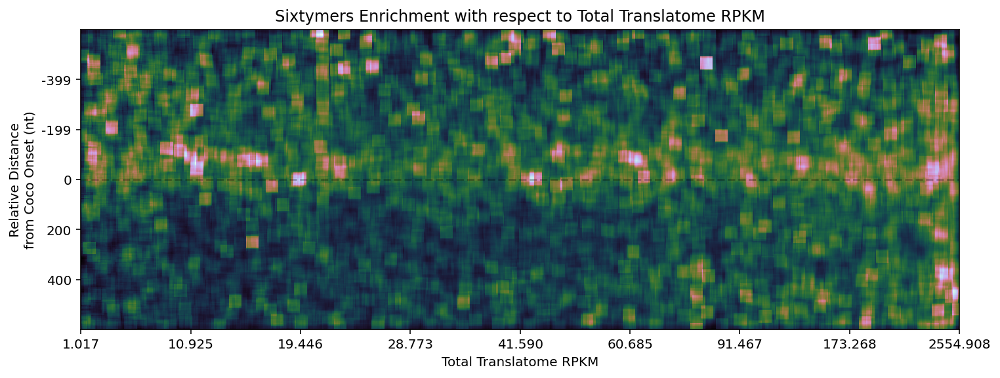

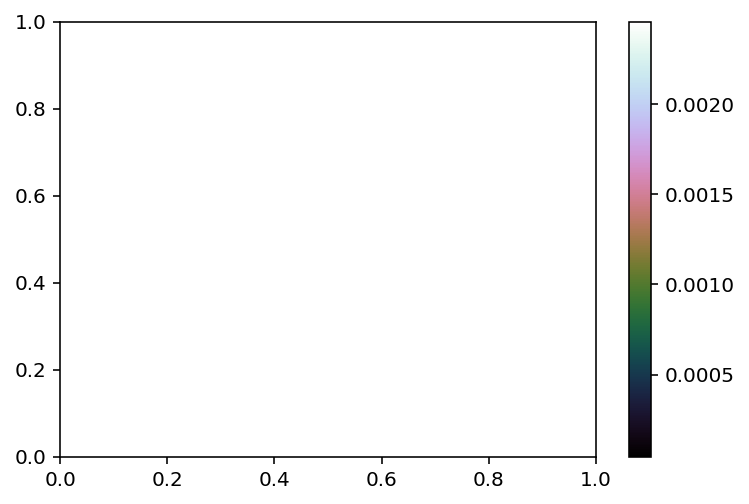

In [24]:
krnl = 17
a_matrix = skimage.measure.block_reduce(the_matrix, (3,3), np.nanmean)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl)))
print(the_matrix.shape)
print(a_matrix.shape)

plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='cubehelix', interpolation='nearest')
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sio_rpkm_multiple["MyTotalRPKM"], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Total Translatome RPKM")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Sixtymers Enrichment with respect to Total Translatome RPKM")
plt.show()

plt.colorbar(im)
plt.show()

#### RPKM and Peak Relationship in Coco-Stalling

In [25]:
sio_rpkm_multiple = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", "MyTotalRPKM"]]
sio_rpkm_multiple.sort_values(by=['MyTotalRPKM'], inplace=True)
sio_rpkm_multiple = sio_rpkm_multiple[sio_rpkm_multiple['GeneID'].isin(coco_stalling)]

flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio_rpkm_multiple.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio_rpkm_multiple["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio_rpkm_multiple["MyOnset"][sio_rpkm_multiple["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
        
        peak_array = np.zeros(gene_lengths[gene_id])
        for peak_position in gene_collision[gene_id]:
            peak_array[peak_position] = 1
        
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = peak_array[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

(1200, 3507)
(400, 1169)


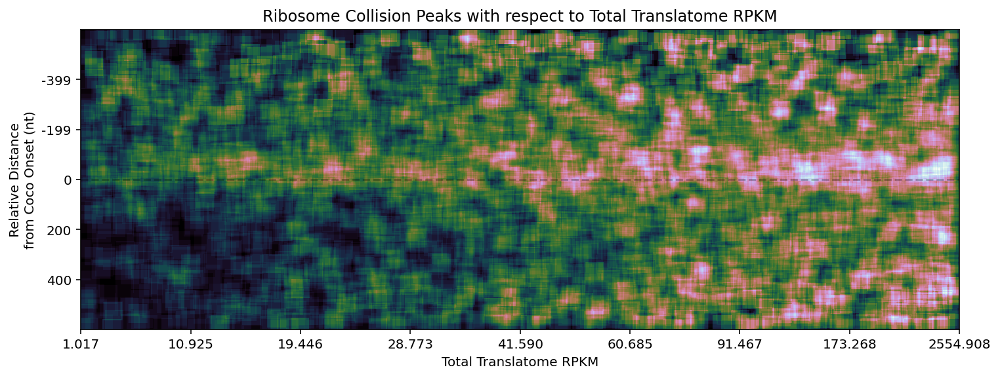

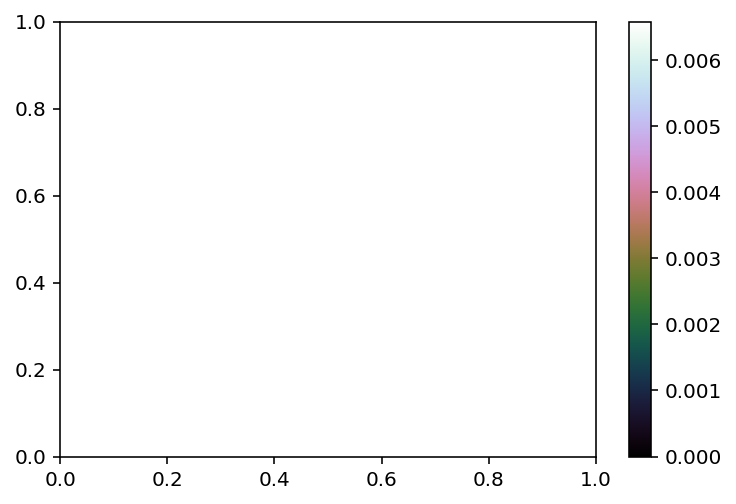

In [26]:
krnl = 25
a_matrix = skimage.measure.block_reduce(the_matrix, (3, 3), np.nanmean)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl)))
print(the_matrix.shape)
print(a_matrix.shape)

plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='cubehelix', interpolation='nearest')
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sio_rpkm_multiple["MyTotalRPKM"], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Total Translatome RPKM")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Ribosome Collision Peaks with respect to Total Translatome RPKM")
plt.show()

plt.colorbar(im)
plt.show()

/home/kai/anaconda3/envs/kemals/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/kai/anaconda3/envs/kemals/lib/python3.6/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


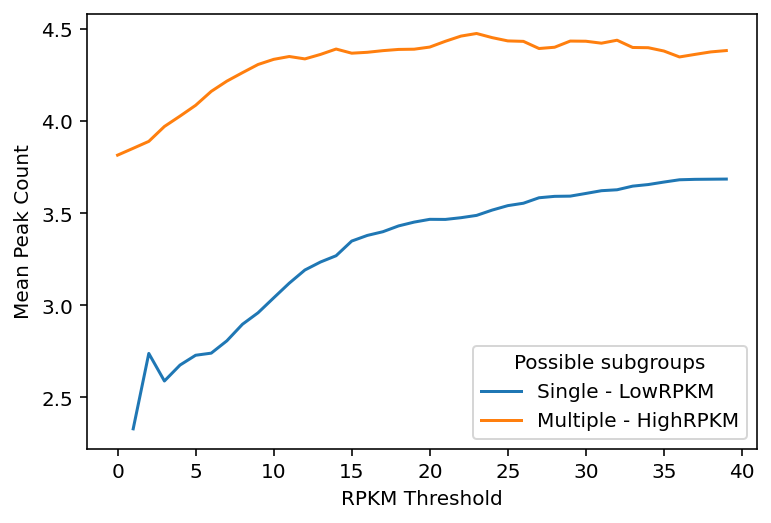

In [27]:
# How thredhold seperates number of peaks detected in two subgroups
gene_rpkms = {gene_id: rpkm_value for gene_id, rpkm_value in zip(temp_df["GeneID"], temp_df["MyTotalRPKM"])}
thr_list_1 = list()
thr_list_2 = list()
thr_list_3 = list()
for thr in np.arange(1,120,3):
    multiple_genes = [len(gene_collision[gene_id]) for gene_id in coco_stalling if gene_rpkms[gene_id] > thr]
    single_genes = [len(gene_collision[gene_id]) for gene_id in coco_stalling if gene_rpkms[gene_id] < thr]
    m1 = np.mean(single_genes)
    m2 = np.mean(multiple_genes)
    thr_list_1.append(m1)
    thr_list_2.append(m2)
    thr_list_3.append(m2-m1)
plt.plot(thr_list_1, label="Single - LowRPKM")
plt.plot(thr_list_2, label="Multiple - HighRPKM")
plt.xlabel("RPKM Threshold")
plt.ylabel("Mean Peak Count")
#plt.plot(thr_list_3)
plt.legend(title="Possible subgroups")
plt.show()

Number of Multiple: 2584
Number of Single: 897


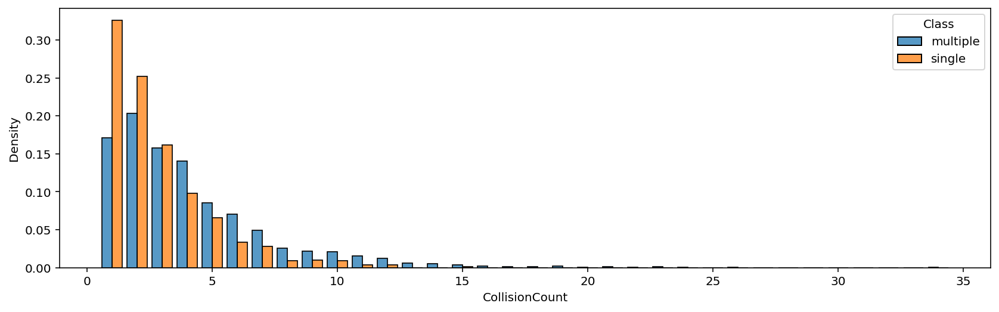

In [28]:
# Not really the case: Subgroupları çekip histogram yap
thr = 20
multiple_genes = [len(gene_collision[gene_id]) for gene_id in coco_stalling if gene_rpkms[gene_id] > thr]
single_genes = [len(gene_collision[gene_id]) for gene_id in coco_stalling if gene_rpkms[gene_id] < thr]
print(f"Number of Multiple: {len(multiple_genes)}")
print(f"Number of Single: {len(single_genes)}")

ms_df = pd.DataFrame([multiple_genes + single_genes, len(multiple_genes) * ["multiple"] + len(single_genes) * ["single"]]).T
ms_df.columns = ["CollisionCount", "Class"]

plt.figure(figsize=(14,4))
sns.histplot(ms_df, x="CollisionCount", hue="Class", discrete=True, common_norm=False, stat="density",
             multiple="dodge", bins=30, shrink=0.8)
plt.show()

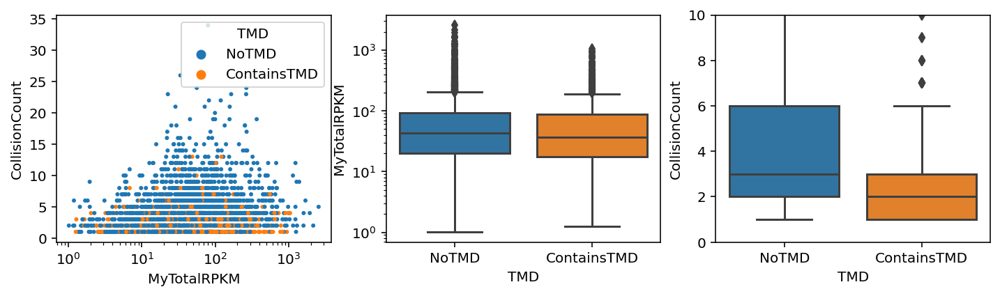

In [29]:
# rpkm vs peak count in non-tmd and tmd for coco_stalling genes

temp_df_temp = temp_df[temp_df["TMD"] != "Akaslmdlaslakmsd"]
temp_df_temp = temp_df_temp[temp_df_temp["GeneID"].isin(coco_stalling)]
temp_df_temp["CollisionCount"] = [len(gene_collision[i]) for i in temp_df_temp["GeneID"]]

fig, ax = plt.subplots(1,3,figsize=[12,3])
ax[0].set_xscale("log")
sns.scatterplot(data=temp_df_temp, x="MyTotalRPKM", y="CollisionCount", hue="TMD",
             linewidth=0, marker = ".", ax=ax[0])

sns.boxplot(data=temp_df_temp, x="TMD", y="MyTotalRPKM", ax=ax[1])
ax[1].set_yscale("log")

sns.boxplot(data=temp_df_temp, x="TMD", y="CollisionCount", ax=ax[2])
ax[2].set_ylim(0,10)
plt.show()

In [30]:
thr = 20
multiple_genes = [gene_id for gene_id in coco_stalling if gene_rpkms[gene_id] > thr]
single_genes = [gene_id for gene_id in coco_stalling if gene_rpkms[gene_id] < thr]

In [31]:
# TODO: Collision count için Coco-Stalling-NoTMD vs Rest yukarıdaki şeyin aynısı, hue grup olsun

## Investigate Different Features in Classes 

#### mRNA Secondary Structures

For each window, five folding metrics were calculated and archived. The Gibb’s minimum free energy (MFE) of folding (ΔG), which estimates the thermodynamic stability of the most stable 2D conformation of an RNA given Turner nearest neighbor energy parameters63,64 (a set of experimentally measured values taken from the analysis of many small RNA motifs). The ΔG was calculated using the program RNAfold, which is a component of the ViennaRNA package63; predictions were made at 37 °C (human body temperature) and values are reported in kcal/mol. 2D structures associated with window MFE predictions were captured and archived in “dot-bracket" notation; here, paired nt are represented by matched brackets “()” and single stranded nt by dots “.”. To determine if the MFE ΔG depends on the nt order or composition, we compared the native sequence ΔG vs. in silico rand- omized sequences with the same nt composition. In general, structured ncRNA molecules have lower (more stable) MFE values than random sequences of the same nucleotide composition65; a property which can be exploited for structured RNA motif discovery

In [205]:
x_sort = "MyTotalRPKM" # "MySixtymersRPKM"

sio_rpkm_multiple = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", x_sort]]
sio_rpkm_multiple.sort_values(by=[x_sort], inplace=True)
sio_rpkm_multiple = sio_rpkm_multiple[sio_rpkm_multiple['GeneID'].isin(coco_stalling)]

flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio_rpkm_multiple.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio_rpkm_multiple["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio_rpkm_multiple["MyOnset"][sio_rpkm_multiple["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
    
        peak_array= ss_mfe[gene_id]    
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = peak_array[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

(1200, 3507)
(366, 1135)


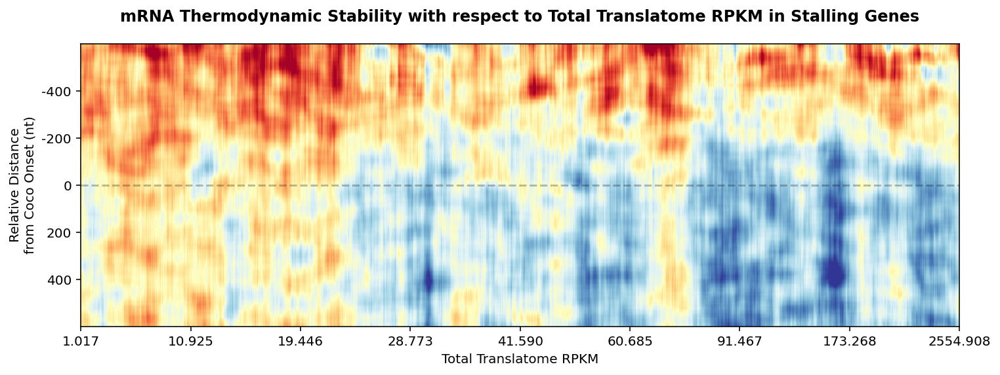

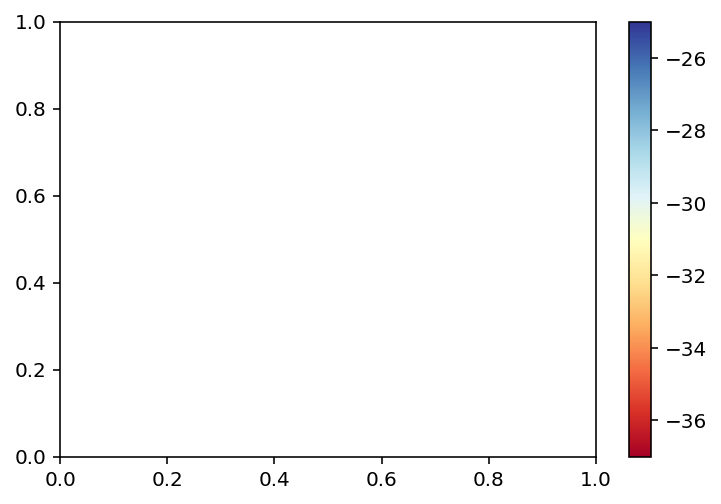

In [206]:
krnl = 17
a_matrix = skimage.measure.block_reduce(the_matrix, (3,3), np.nanmedian)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl*2+1)))

a_matrix = a_matrix[krnl:-krnl, krnl:-krnl]

print(the_matrix.shape)
print(a_matrix.shape)

plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='RdYlBu', interpolation='nearest', vmin=-37, vmax=-25)
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sio_rpkm_multiple[x_sort], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Total Translatome RPKM")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("mRNA Thermodynamic Stability with respect to Total Translatome RPKM in Stalling Genes", y=1.05, fontweight="bold")
plt.show()

plt.colorbar(im)
plt.show()

In [34]:
x_sort = "MyTotalRPKM" # "MySixtymersRPKM"

sio_rpkm_multiple = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", x_sort]]
sio_rpkm_multiple.sort_values(by=[x_sort], inplace=True)
sio_rpkm_multiple = sio_rpkm_multiple[sio_rpkm_multiple['GeneID'].isin(coco_nostalling)]

flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio_rpkm_multiple.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio_rpkm_multiple["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio_rpkm_multiple["MyOnset"][sio_rpkm_multiple["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
    
        peak_array= ss_mfe[gene_id]    
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = peak_array[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

(1200, 610)
(366, 170)


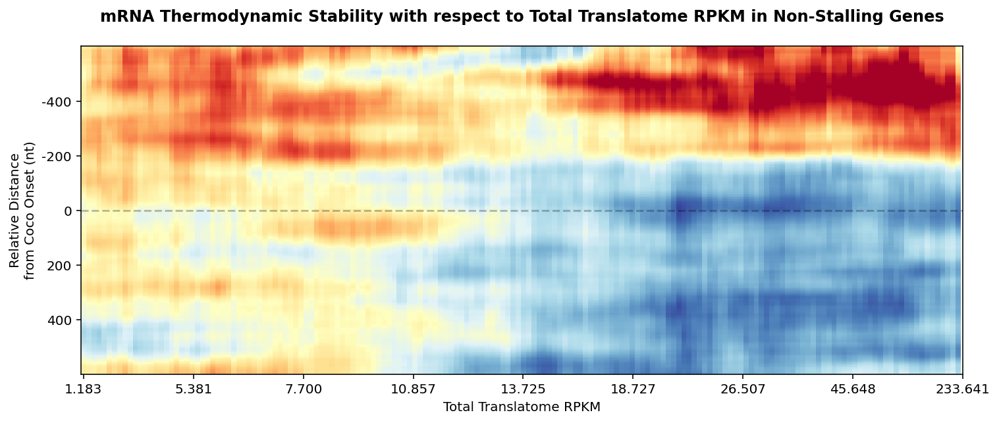

In [35]:
krnl = 17
a_matrix = skimage.measure.block_reduce(the_matrix, (3,3), np.nanmedian)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl*2+1)))

a_matrix = a_matrix[krnl:-krnl, krnl:-krnl]

print(the_matrix.shape)
print(a_matrix.shape)

plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='RdYlBu', interpolation='nearest', vmin=-37, vmax=-25, aspect=len(coco_nostalling)/len(coco_stalling))
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sio_rpkm_multiple[x_sort], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Total Translatome RPKM")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("mRNA Thermodynamic Stability with respect to Total Translatome RPKM in Non-Stalling Genes", y=1.05, fontweight="bold")
plt.show()

#plt.colorbar(im)
#plt.show()

###### Makes sense because:
more structured mRNAs slowly translated

In [36]:
x_sort = "SlopeMyOnset"

sio_rpkm_multiple = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", x_sort]]
sio_rpkm_multiple.sort_values(by=[x_sort], inplace=True)
sio_rpkm_multiple = sio_rpkm_multiple[sio_rpkm_multiple['GeneID'].isin(coco_stalling)]

flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio_rpkm_multiple.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio_rpkm_multiple["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio_rpkm_multiple["MyOnset"][sio_rpkm_multiple["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
    
        peak_array= ss_mfe[gene_id]    
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = peak_array[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

(1200, 3507)
(366, 1135)


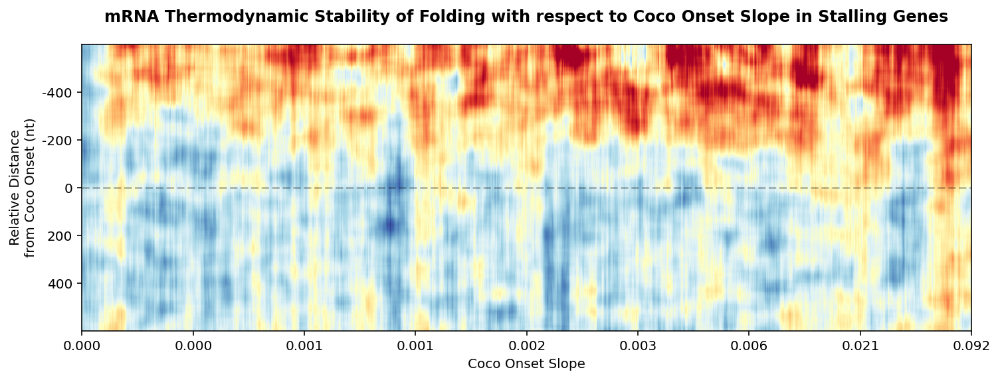

In [37]:
krnl = 17
a_matrix = skimage.measure.block_reduce(the_matrix, (3,3), np.nanmedian)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl*2+1)))

a_matrix = a_matrix[krnl:-krnl, krnl:-krnl]

print(the_matrix.shape)
print(a_matrix.shape)

plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='RdYlBu', interpolation='nearest', vmin=-37, vmax=-25)
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sio_rpkm_multiple[x_sort], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Coco Onset Slope")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("mRNA Thermodynamic Stability of Folding with respect to Coco Onset Slope in Stalling Genes", y=1.05, fontweight="bold")
plt.show()

#plt.colorbar(im)
#plt.show()

In [208]:
len(tmd_genes)

6780

In [38]:
x_sort = "SlopeMyOnset"

sio_rpkm_multiple = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", x_sort]]
sio_rpkm_multiple.sort_values(by=[x_sort], inplace=True)
sio_rpkm_multiple = sio_rpkm_multiple[sio_rpkm_multiple['GeneID'].isin(coco_nostalling)]

flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio_rpkm_multiple.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio_rpkm_multiple["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio_rpkm_multiple["MyOnset"][sio_rpkm_multiple["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
    
        peak_array= ss_mfe[gene_id]    
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = peak_array[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

(1200, 610)
(366, 170)


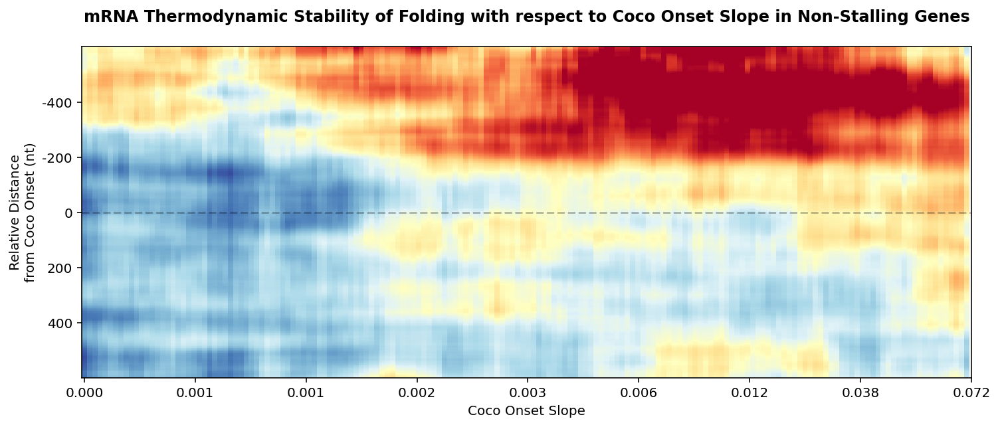

In [39]:
krnl = 17
a_matrix = skimage.measure.block_reduce(the_matrix, (3,3), np.nanmedian)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl*2+1)))

a_matrix = a_matrix[krnl:-krnl, krnl:-krnl]
print(the_matrix.shape)
print(a_matrix.shape)

plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='RdYlBu', interpolation='nearest', vmin=-37, vmax=-25, aspect=len(coco_nostalling)/len(coco_stalling))
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sio_rpkm_multiple[x_sort], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Coco Onset Slope")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("mRNA Thermodynamic Stability of Folding with respect to Coco Onset Slope in Non-Stalling Genes", y=1.05, fontweight="bold")
plt.show()

#plt.colorbar(im)
#plt.show()

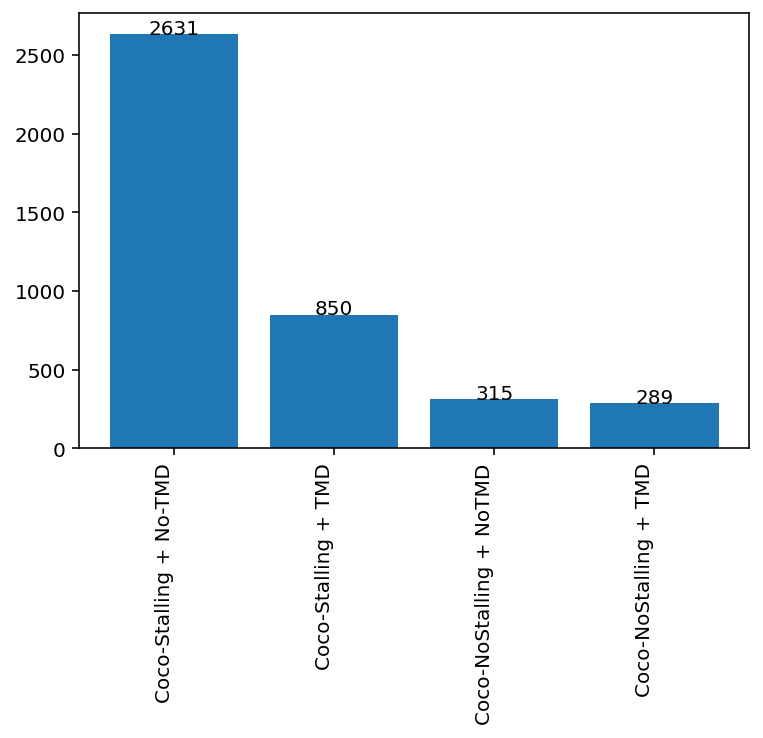

In [207]:
tbk1 = len([gene_id for gene_id in coco_stalling if gene_id not in tmd_genes])
tbk2 = len([gene_id for gene_id in coco_stalling if gene_id in tmd_genes])
tbk3 = len([gene_id for gene_id in coco_nostalling if gene_id not in tmd_genes])
tbk4 = len([gene_id for gene_id in coco_nostalling if gene_id in tmd_genes])
labels_cls = ["Coco-Stalling + No-TMD", "Coco-Stalling + TMD", "Coco-NoStalling + NoTMD", "Coco-NoStalling + TMD"]
counts_cls = [tbk1, tbk2, tbk3, tbk4]
plt.bar(labels_cls, counts_cls)
for i, v in enumerate(counts_cls):
    plt.text(i, v, str(v), ha="center")
plt.xticks(rotation=90, ha='right')
plt.show()

###### Makes sense because:
?

In [ ]:
flank = 800


gene_set = coco_stalling

metag = np.full((len(gene_set), flank * 2), np.nan)
ind = 0
for gene_id in gene_set:
    ons = gene_onset[gene_id]
    arr = ss_mfe[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1

# RANDOM Onset
onset_gene = 25
metag_average = np.full((len(gene_set) * onset_gene, flank * 2), np.nan)
ind = 0
for gene_id in gene_set:
    arr = ss_mfe[gene_id]
    for _ in range(onset_gene):
        ons = np.random.randint(90, gene_lengths[gene_id] - 90)
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = arr[start_position: ons+flank]
        metag_average[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1


m1 = np.array([smooth_array(i, 15, "hanning") for i in metag])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_average])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue

kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_average, confidence=1-((1-kk) / onset_gene))

palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_average, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label="Actual Data 95% CI")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label="Random Onset 95% CI")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Coco Assembly Onset")
plt.ylabel("mRNA Thermodynamic Stability of folding\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

Progress: |████████████████████| 100.0% 


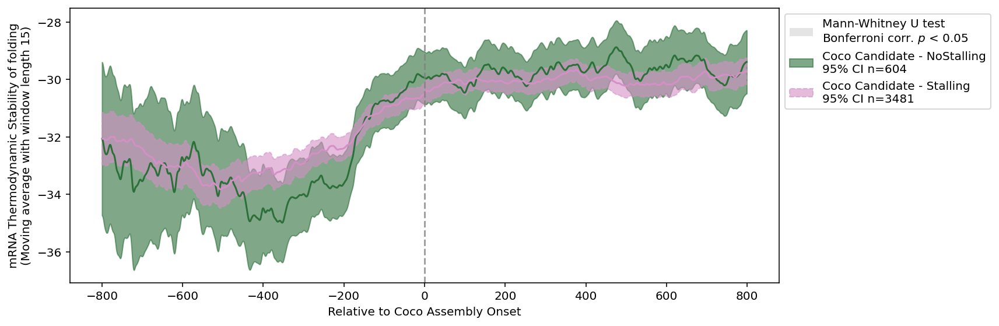

In [60]:
flank = 800

gene_set1 = coco_nostalling #multiple_genes#
gene_set2 = coco_stalling #single_genes#

metag_coco_nostalling = np.full((len(gene_set1), flank * 2), np.nan)
ind = 0
for gene_id in gene_set1:
    ons = gene_onset[gene_id]
    arr = ss_mfe[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_coco_nostalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1

flank = 800
metag_coco_stalling = np.full((len(gene_set2), flank * 2), np.nan)
ind = 0
for gene_id in gene_set2:
    ons = gene_onset[gene_id]
    arr = ss_mfe[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_coco_stalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1

m1 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_nostalling])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_stalling])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
signif_rnges = [[0,0]] if not signif_rnges else signif_rnges

kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag_coco_nostalling, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_coco_stalling, confidence=kk)

palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag_coco_nostalling, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_coco_stalling, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label=f"Coco Candidate - NoStalling\n95% CI n={len(gene_set1)}")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label=f"Coco Candidate - Stalling\n95% CI n={len(gene_set2)}")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Coco Assembly Onset")
plt.ylabel("mRNA Thermodynamic Stability of folding\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

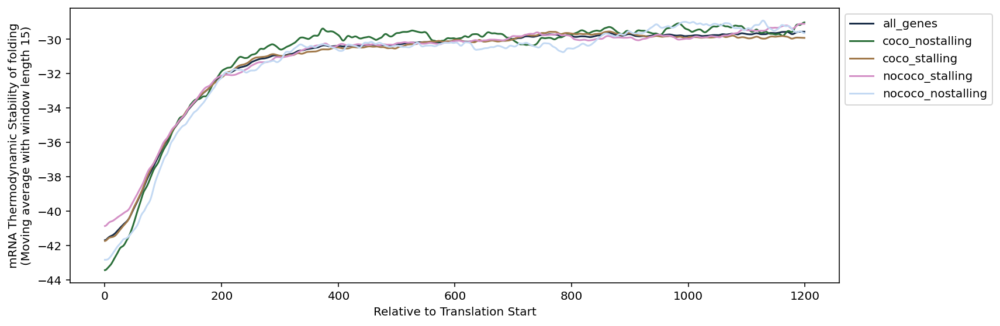

In [330]:
flank = 1200
metag_coco_nostalling = np.full((len(coco_nostalling), flank * 2), np.nan)
ind = 0
for gene_id in coco_nostalling:
    if gene_id not in ss_mfe:
        continue
    ons = 0
    arr = ss_mfe[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_coco_nostalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1
metag_coco_nostalling = metag_coco_nostalling[:,flank:]
    
metag_coco_stalling = np.full((len(coco_stalling), flank * 2), np.nan)
ind = 0
for gene_id in coco_stalling:
    if gene_id not in ss_mfe:
        continue
    ons = 0
    arr = ss_mfe[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_coco_stalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1
metag_coco_stalling = metag_coco_stalling[:,flank:]

metag_nococo_stalling = np.full((len(nococo_stalling), flank * 2), np.nan)
ind = 0
for gene_id in nococo_stalling:
    if gene_id not in ss_mfe:
        continue
    ons = 0
    arr = ss_mfe[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_nococo_stalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1
metag_nococo_stalling = metag_nococo_stalling[:,flank:]

metag_nococo_nostalling = np.full((len(nococo_nostalling), flank * 2), np.nan)
ind = 0
for gene_id in nococo_nostalling:
    if gene_id not in ss_mfe:
        continue
    ons = 0
    arr = ss_mfe[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_nococo_nostalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1
metag_nococo_nostalling = metag_nococo_nostalling[:,flank:]

metag_all_genes = np.full((len(I.gene_list), flank * 2), np.nan)
ind = 0
for gene_id in I.gene_list:
    if gene_id not in ss_mfe:
        continue
    ons = 0
    arr = ss_mfe[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_all_genes[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1
metag_all_genes = metag_all_genes[:,flank:]
    
palette = sns.color_palette("cubehelix", 5)
plt.figure(figsize=(12,4))
x_data = np.array(range(flank))
metags = [metag_all_genes, metag_coco_nostalling, metag_coco_stalling, metag_nococo_stalling, metag_nococo_nostalling]
metag_labs = ["all_genes", "coco_nostalling", "coco_stalling", "nococo_stalling", "nococo_nostalling"]
for ind, (metag, metag_lab) in enumerate(zip(metags, metag_labs)):
    plt.plot(x_data, smooth_array(np.nanmean(metag, axis=0), 15, "hanning"),
                color=palette[ind], alpha=1, label=metag_lab)

plt.xlabel("Relative to Translation Start")
plt.ylabel("mRNA Thermodynamic Stability of folding\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [36]:
# TODO: show mrna secondary structure vs sitymers relationship in general

Progress: |████████████████████| 100.0% 


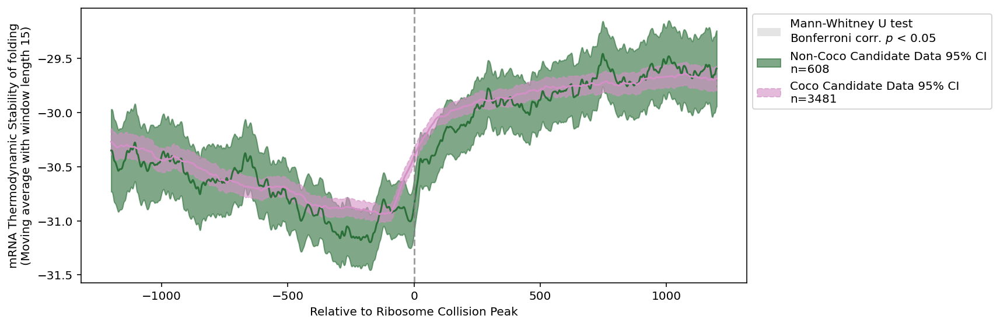

In [337]:
flank = 1200
gene_set = nococo_stalling
repeat_exp = 25
noc_m = np.sum([len(gene_collision[gene_id]) for gene_id in gene_set])

metag_cs = np.full((noc_m, flank * 2), np.nan)
ind = 0
for gene_id in gene_set:
    for ons in gene_collision[gene_id]:
        if gene_id not in ss_mfe:
            continue
        #ons = np.random.randint(90, gene_lengths[gene_id] - 90)
        arr = ss_mfe[gene_id]
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = arr[start_position: ons+flank]
        metag_cs[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
metag_cs_r = np.full((noc_m*repeat_exp, flank * 2), np.nan)
ind = 0
for gene_id in gene_set:
    for ons in gene_collision[gene_id]:
        if gene_id not in ss_mfe:
            continue
        for _ in range(repeat_exp):
            ons = np.random.randint(90, gene_lengths[gene_id] - 90)
            arr = ss_mfe[gene_id]
            start_position = max(0, ons-flank)
            start_offset = -min(0, ons-flank)
            marr = arr[start_position: ons+flank]
            metag_cs_r[ind, start_offset: len(marr) + start_offset] = marr
            ind += 1

m1 = np.array([smooth_array(i, 15, "hanning") for i in metag_cs])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_cs_r])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
signif_rnges = [[0,0]] if not signif_rnges else signif_rnges

kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag_cs, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_cs_r, confidence=1-((1-kk) / onset_gene))

palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag_cs, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_cs_r, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label="Actual Data 95% CI")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label="Random Onset 95% CI")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Ribosome Collision Peak")
plt.ylabel("mRNA Thermodynamic Stability of folding\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

### Protein Features: Charge

In [46]:
aminoacids = ['A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']
from Bio.SeqUtils.IsoelectricPoint import IsoelectricPoint as IP
charge_at_ends = IP("G").charge_at_pH(7.0)
aa_charge = {aa: IP(aa).charge_at_pH(7.0) - charge_at_ends for aa in aminoacids}
#aa_charge = {'A': 0, 'C': 0, 'D': -1, 'E': -1, 'F': 0, 'G': 0, 'H': 1, 'I': 0, 'K': 1, 'L': 0, 'M': 0, 'N': 0, 'P': 0, 'Q': 0, 'R': 1, 'S': 0, 'T': 0, 'V': 0, 'W': 0, 'Y': 0,}

In [47]:
gene_charge = dict()
for ind, gene_id in enumerate(I.gene_list):
    progress_bar(ind, len(I.gene_list) - 1, verbose=True)
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    protein_seq = I.protein_genome.db[best_transcript][1]
    protein_charge = np.array([aa_charge.get(aa, np.nan) for aa in protein_seq.upper() for _ in range(3)])
    gene_charge[gene_id] = protein_charge

assert len(gene_charge[gene_id]) == gene_lengths[gene_id]

Progress: |████████████████████| 100.0% 


In [154]:
coco_stalling_nontmd = [gene_id for gene_id in coco_stalling if gene_id not in tmd_genes]
#print(len(coco_stalling_nontmd))

x_sort = "SlopeMyOnset"

sio_rpkm_multiple = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", x_sort]]
sio_rpkm_multiple.sort_values(by=[x_sort], inplace=True)
sio_rpkm_multiple = sio_rpkm_multiple[sio_rpkm_multiple['GeneID'].isin(coco_stalling_nontmd)]

flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio_rpkm_multiple.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio_rpkm_multiple["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio_rpkm_multiple["MyOnset"][sio_rpkm_multiple["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
    
        peak_array= gene_charge[gene_id]    
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = peak_array[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

(1200, 2652)
(350, 834)


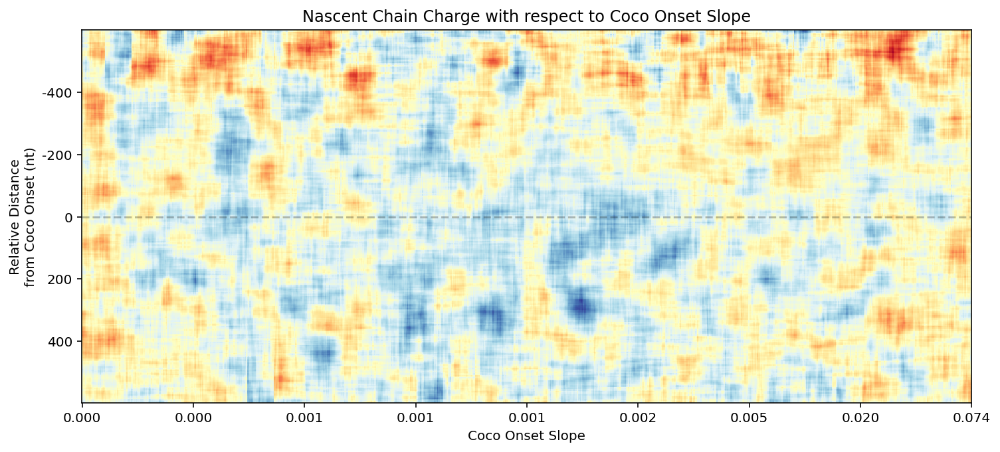

In [155]:
krnl = 25
a_matrix = skimage.measure.block_reduce(the_matrix, (3,3), np.nanmean)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl)))

krnl_add = 0
a_matrix = a_matrix[krnl+krnl_add:-krnl-krnl_add, krnl+krnl_add:-krnl-krnl_add]

print(the_matrix.shape)
print(a_matrix.shape)

plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='RdYlBu_r', interpolation='nearest')
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sio_rpkm_multiple[x_sort], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Coco Onset Slope")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Nascent Chain Charge with respect to Coco Onset Slope")
plt.show()

#plt.colorbar(im)
#plt.show()

Progress: |████████████████████| 100.0% 


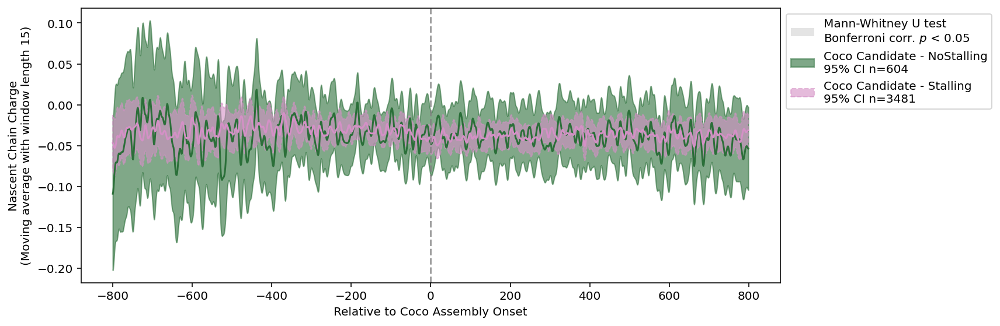

In [61]:
flank = 800

gene_set1 = coco_nostalling #multiple_genes#
gene_set2 = coco_stalling #single_genes#

metag_coco_nostalling = np.full((len(gene_set1), flank * 2), np.nan)
ind = 0
for gene_id in gene_set1:
    ons = gene_onset[gene_id]
    arr = gene_charge[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_coco_nostalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1

flank = 800
metag_coco_stalling = np.full((len(gene_set2), flank * 2), np.nan)
ind = 0
for gene_id in gene_set2:
    ons = gene_onset[gene_id]
    arr = gene_charge[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_coco_stalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1

m1 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_nostalling])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_stalling])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
signif_rnges = [[0,0]] if not signif_rnges else signif_rnges

kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag_coco_nostalling, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_coco_stalling, confidence=kk)

palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag_coco_nostalling, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_coco_stalling, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label=f"Coco Candidate - NoStalling\n95% CI n={len(gene_set1)}")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label=f"Coco Candidate - Stalling\n95% CI n={len(gene_set2)}")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Coco Assembly Onset")
plt.ylabel("Nascent Chain Charge\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

Progress: |████████████████████| 100.0% 


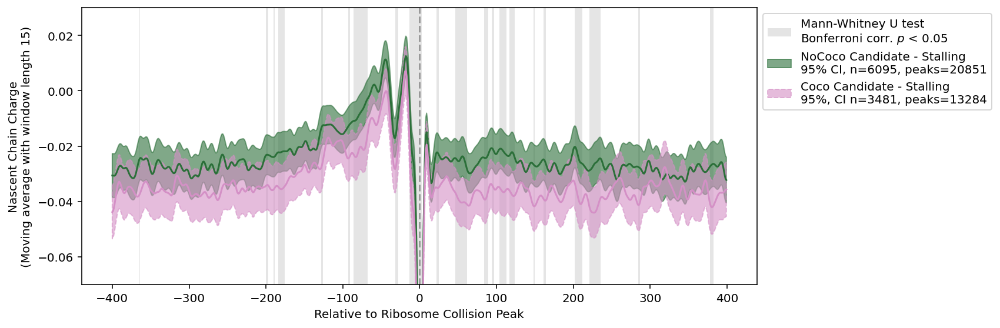

In [213]:
flank = 400

gene_set1 = nococo_stalling #multiple_genes#
gene_set2 = coco_stalling #single_genes#

ons_count1 = np.sum([len(gene_collision[i]) for i in gene_set1])
metag_coco_nostalling = np.full((ons_count1, flank * 2), np.nan)
ind = 0
for gene_id in gene_set1:
    for ons in gene_collision[gene_id]:
        arr = gene_charge[gene_id]
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = arr[start_position: ons+flank]
        metag_coco_nostalling[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1

ons_count2 = np.sum([len(gene_collision[i]) for i in gene_set2])
metag_coco_stalling = np.full((ons_count2, flank * 2), np.nan)
ind = 0
for gene_id in gene_set2:
    for ons in gene_collision[gene_id]:
        arr = gene_charge[gene_id]
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = arr[start_position: ons+flank]
        metag_coco_stalling[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1

m1 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_nostalling])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_stalling])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
signif_rnges = [[0,0]] if not signif_rnges else signif_rnges

kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag_coco_nostalling, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_coco_stalling, confidence=kk)

palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag_coco_nostalling, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_coco_stalling, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label=f"NoCoco Candidate - Stalling\n95% CI, n={len(gene_set1)}, peaks={ons_count1}")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label=f"Coco Candidate - Stalling\n95%, CI n={len(gene_set2)}, peaks={ons_count2}")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Ribosome Collision Peak")
plt.ylabel("Nascent Chain Charge\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()

plt.ylim(-0.07, 0.03)
plt.show()

### Protein Features: Hydrophobicity

In [45]:
aa_gravy = {"A": 1.8, "R": -4.5, "N": -3.5, "D": -3.5, "C": 2.5,
      "Q": -3.5, "E": -3.5, "G": -0.4, "H": -3.2, "I": 4.5,
      "L": 3.8, "K": -3.9, "M": 1.9, "F": 2.8, "P": -1.6,
      "S": -0.8, "T": -0.7, "W": -0.9, "Y": -1.3, "V": 4.2}

gene_gravy = dict()
for ind, gene_id in enumerate(I.gene_list):
    progress_bar(ind, len(I.gene_list) - 1, verbose=True)
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    protein_seq = I.protein_genome.db[best_transcript][1]
    protein_gravy = np.array([aa_gravy.get(aa, np.nan) for aa in protein_seq.upper() for _ in range(3)])
    gene_gravy[gene_id] = protein_gravy

assert len(gene_gravy[gene_id]) == gene_lengths[gene_id]

Progress: |████████████████████| 100.0% 


In [218]:
coco_stalling_nontmd = [gene_id for gene_id in coco_stalling if gene_id not in tmd_genes]
#print(len(coco_stalling_nontmd))

x_sort = "WidthAssembly"

sio_rpkm_multiple = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", x_sort]]
sio_rpkm_multiple.sort_values(by=[x_sort], inplace=True)
sio_rpkm_multiple = sio_rpkm_multiple[sio_rpkm_multiple['GeneID'].isin(coco_stalling_nontmd)]

flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio_rpkm_multiple.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio_rpkm_multiple["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio_rpkm_multiple["MyOnset"][sio_rpkm_multiple["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
        #if gene_id not in tmd_genes:
        peak_array = gene_gravy[gene_id] #tmd_dict, gene_gravy
        #else:
        #peak_array = np.full(gene_lengths[gene_id], np.nan)
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = peak_array[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

(1200, 2652)
(350, 834)


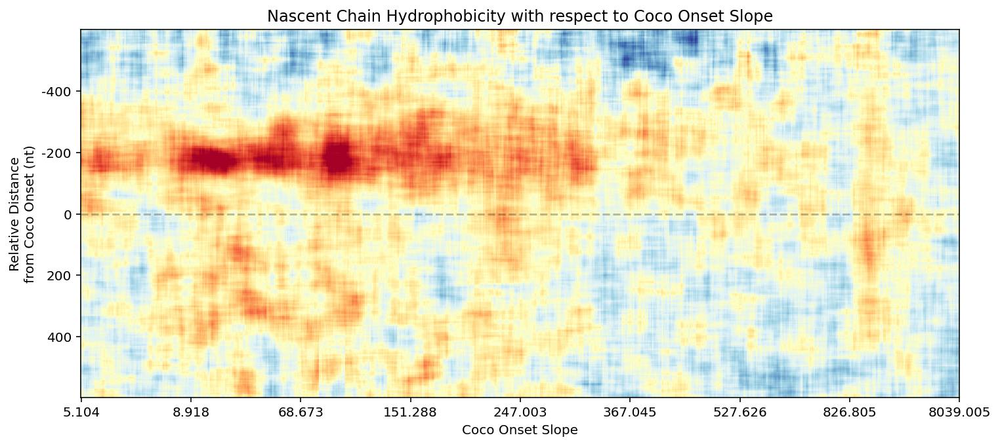

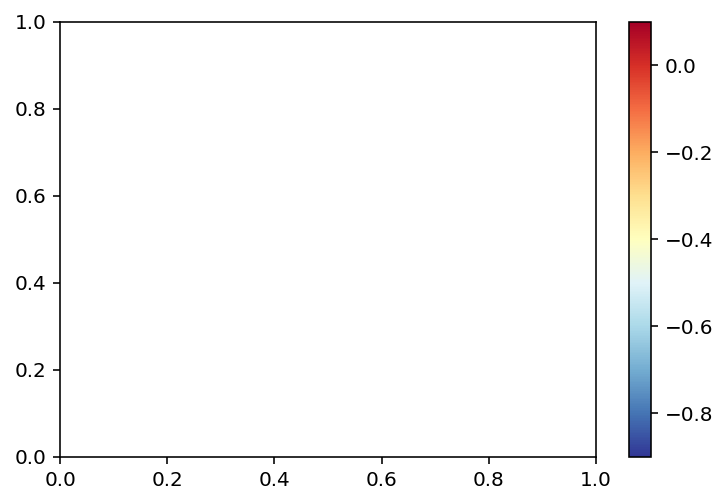

In [219]:
krnl = 25
a_matrix = skimage.measure.block_reduce(the_matrix, (3,3), np.nanmean)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl)))

krnl_add = 0
a_matrix = a_matrix[krnl+krnl_add:-krnl-krnl_add, krnl+krnl_add:-krnl-krnl_add]

print(the_matrix.shape)
print(a_matrix.shape)

plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='RdYlBu_r', interpolation='nearest', vmin=-0.9, vmax=0.1)
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sio_rpkm_multiple[x_sort], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Coco Onset Slope")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Nascent Chain Hydrophobicity with respect to Coco Onset Slope")
plt.show()

plt.colorbar(im)
plt.show()

Progress: |████████████████████| 100.0% 


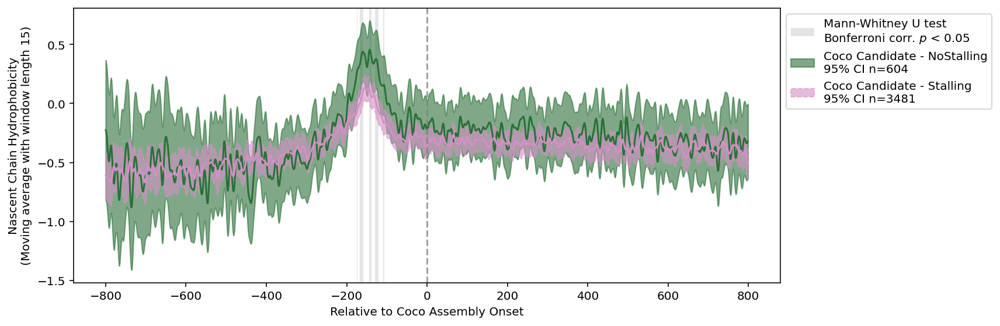

In [196]:
flank = 800

gene_set1 = coco_nostalling #multiple_genes#
gene_set2 = coco_stalling #single_genes#

metag_coco_nostalling = np.full((len(gene_set1), flank * 2), np.nan)
ind = 0
for gene_id in gene_set1:
    ons = gene_onset[gene_id]
    arr = gene_gravy[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_coco_nostalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1

flank = 800
metag_coco_stalling = np.full((len(gene_set2), flank * 2), np.nan)
ind = 0
for gene_id in gene_set2:
    ons = gene_onset[gene_id]
    arr = gene_gravy[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag_coco_stalling[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1

m1 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_nostalling])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_stalling])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
signif_rnges = [[0,0]] if not signif_rnges else signif_rnges

kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag_coco_nostalling, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_coco_stalling, confidence=kk)

palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag_coco_nostalling, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_coco_stalling, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label=f"Coco Candidate - NoStalling\n95% CI n={len(gene_set1)}")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label=f"Coco Candidate - Stalling\n95% CI n={len(gene_set2)}")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Coco Assembly Onset")
plt.ylabel("Nascent Chain Hydrophobicity\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

Progress: |████████████████████| 100.0% 


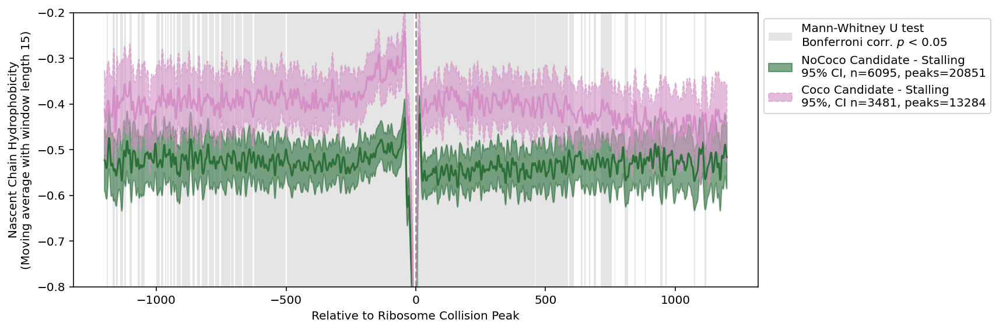

In [197]:
flank = 1200

gene_set1 = nococo_stalling #multiple_genes #[i for i in nococo_stalling if i not in tmd_genes] # 
gene_set2 = coco_stalling #single_genes #[i for i in coco_stalling if i not in tmd_genes] #

ons_count1 = np.sum([len(gene_collision[i]) for i in gene_set1])
metag_coco_nostalling = np.full((ons_count1, flank * 2), np.nan)
ind = 0
for gene_id in gene_set1:
    for ons in gene_collision[gene_id]:
        arr = gene_gravy[gene_id]
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = arr[start_position: ons+flank]
        metag_coco_nostalling[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1

ons_count2 = np.sum([len(gene_collision[i]) for i in gene_set2])
metag_coco_stalling = np.full((ons_count2, flank * 2), np.nan)
ind = 0
for gene_id in gene_set2:
    for ons in gene_collision[gene_id]:

        arr = gene_gravy[gene_id]
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = arr[start_position: ons+flank]
        metag_coco_stalling[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1

m1 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_nostalling])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_coco_stalling])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
signif_rnges = [[0,0]] if not signif_rnges else signif_rnges

kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag_coco_nostalling, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_coco_stalling, confidence=kk)

palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag_coco_nostalling, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_coco_stalling, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label=f"NoCoco Candidate - Stalling\n95% CI, n={len(gene_set1)}, peaks={ons_count1}")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label=f"Coco Candidate - Stalling\n95%, CI n={len(gene_set2)}, peaks={ons_count2}")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Ribosome Collision Peak")
plt.ylabel("Nascent Chain Hydrophobicity\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()

plt.ylim(-0.8, -0.2)
plt.show()

Note: tmd'leri de koyunca yine aynı yerde kalıyor amk

In [ ]:
# Charge
# Hydrophobicity
# Flexibility

### Protein Features: Transmembrane Domains

In [200]:
x_sort = "HeightAssembly"
GL = [i for i in coco_stalling + coco_nostalling  if i in tmd_genes]

sio_rpkm_multiple = onsetdf[(~onsetdf.isna().any(axis=1))][["GeneID", "MyOnset", x_sort]]
sio_rpkm_multiple.sort_values(by=[x_sort], inplace=True)
sio_rpkm_multiple = sio_rpkm_multiple[sio_rpkm_multiple['GeneID'].isin(GL)]

flank = 600
rpkm_threshold_for_sixtymers = 0.001
the_matrix = np.full((sio_rpkm_multiple.shape[0], flank*2), np.nan)
ind = 0
for gene_id in sio_rpkm_multiple["GeneID"]:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = int(sio_rpkm_multiple["MyOnset"][sio_rpkm_multiple["GeneID"] == gene_id].unique())
    if rpkm_background > rpkm_threshold_for_sixtymers:
    
        peak_array= tmd_dict[gene_id]    
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = peak_array[start_position: ons+flank]
        the_matrix[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
the_matrix = the_matrix.T

(1200, 1145)
(354, 336)


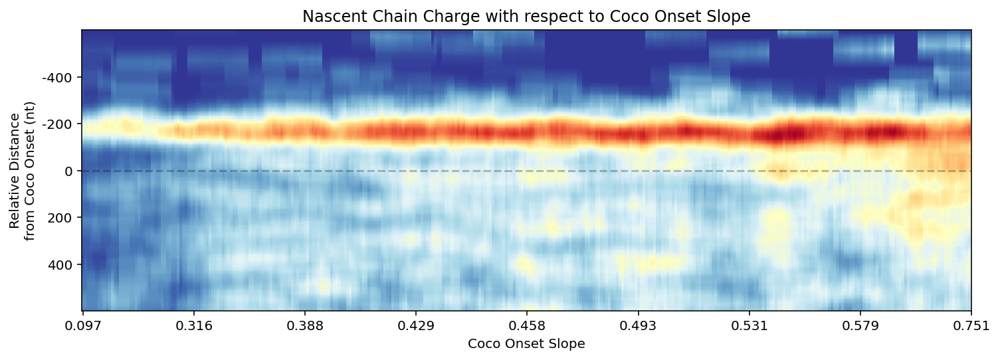

In [202]:
krnl = 23
a_matrix = skimage.measure.block_reduce(the_matrix, (3,3), np.nanmean)
a_matrix = convolution.convolve(a_matrix, np.ones((krnl, krnl)))

krnl_add = 0
a_matrix = a_matrix[krnl+krnl_add:-krnl-krnl_add, krnl+krnl_add:-krnl-krnl_add]

print(the_matrix.shape)
print(a_matrix.shape)

plt.figure(figsize=(12,12))
im = plt.imshow(a_matrix, cmap='RdYlBu_r', interpolation='nearest', aspect=0.3)
    
locs = np.linspace(0, a_matrix.shape[1], 9)
labels = ["%.3f" % (np.percentile(sio_rpkm_multiple[x_sort], loc/a_matrix.shape[1] * 100)) for loc in locs]
plt.xticks(locs, labels)

locs = np.linspace(0, a_matrix.shape[0], 7)[1:-1]
labels = ["%d" % ((loc - a_matrix.shape[0]/2) / (a_matrix.shape[0]/2) * flank) for loc in locs]
plt.yticks(locs, labels)

plt.axhline(a_matrix.shape[0] / 2, color="black", alpha=0.25, linestyle = "--")

plt.xlabel("Coco Onset Slope")
plt.ylabel("Relative Distance\nfrom Coco Onset (nt)")
plt.title("Nascent Chain Charge with respect to Coco Onset Slope")
plt.show()

#plt.colorbar(im)
#plt.show()

In [ ]:
1

#### Collision peaks logos for Coco vs Non-Coco

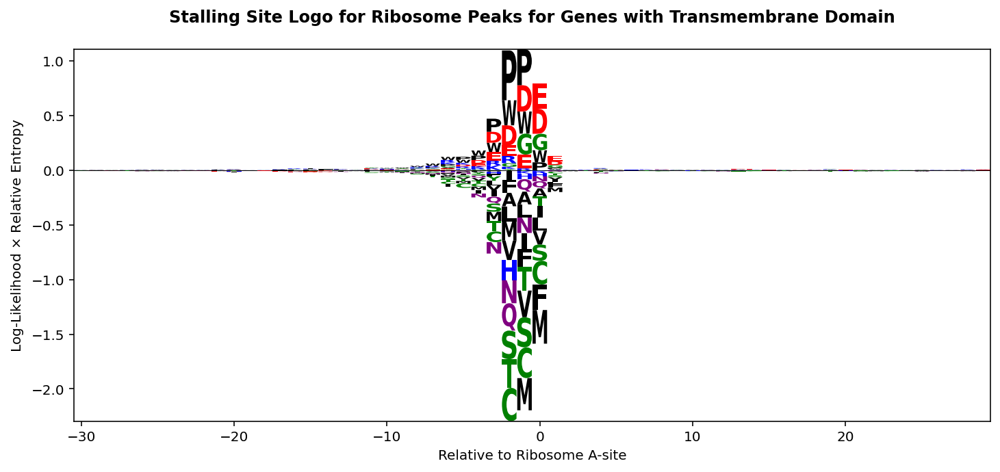

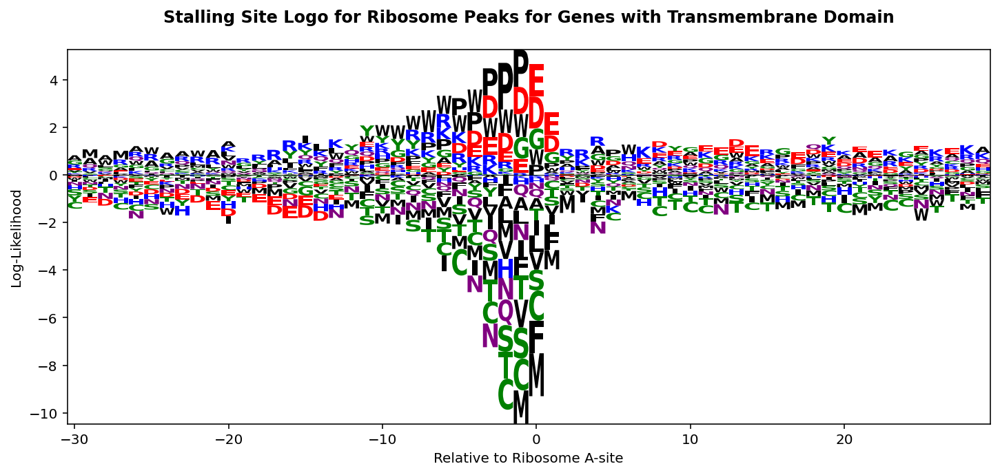

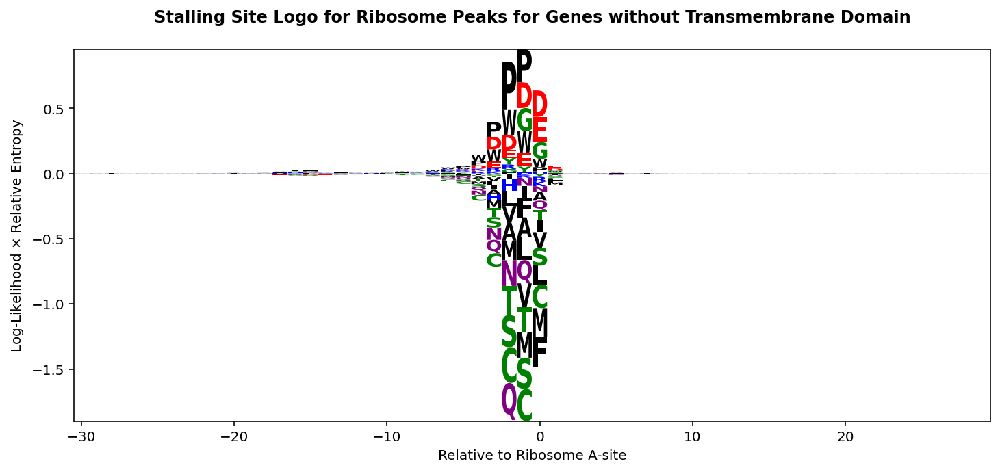

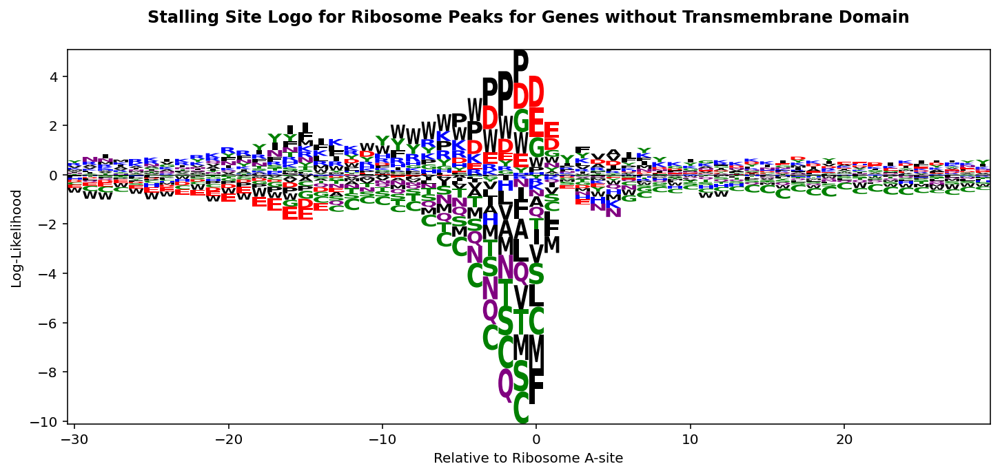

In [144]:
from Bio.SeqUtils.ProtParam import ProteinAnalysis

fl = 30
aa = ['A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']

associated_peaks = [i for i in I.gene_list if i in tmd_genes]

expected_seq = ""
for gene_id in associated_peaks:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    expected_seq += I.protein_genome.db[best_transcript][1]
dfk_expected = pd.DataFrame([ProteinAnalysis(expected_seq).get_amino_acids_percent()] * (fl * 2), index=np.arange(-fl, fl))
del expected_seq

fill_matrix = np.zeros((fl * 2, len(aa)))
for gene_id in associated_peaks:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    protein_seq = "."*fl + I.protein_genome.db[best_transcript][1] + "."*fl
    for nt_position in gene_collision[gene_id]:
        aa_position = math.floor(nt_position / 3) + fl
        fpca = protein_seq[aa_position-fl: aa_position+fl]
        for i_fl in range(fl * 2):
            try:
                # Increase the relevant position with normalized intensity
                fill_matrix[i_fl, aa.index(fpca[i_fl])] += 1
            except ValueError:
                pass  # Raises ValueError for non-conventional amino acids or "."
dfk_observed = pd.DataFrame((fill_matrix.T / np.sum(fill_matrix, axis=1)).T, columns=aa, index=np.arange(-fl, fl))
sonc = [stats.entropy(dfk_observed.iloc[i], dfk_expected.iloc[i]) for i in range(fl * 2)]
#plt.plot(np.arange(-fl, fl), sonc)
#plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
#plt.title("Information Content")

import logomaker
to_plot = (np.log2(dfk_observed/ dfk_expected).T * sonc).T
fig, ax = plt.subplots(1,1,figsize=[12,5])
ss_logo = logomaker.Logo(to_plot, flip_below=False, color_scheme='chemistry', ax=ax)
ss_logo.ax.set_ylabel(r"Log-Likelihood $\times$ Relative Entropy")
ss_logo.ax.set_xlabel("Relative to A-site for Stalled Ribosome")
ss_logo.ax.set_title("Stalling Site Logo for Ribosome Peaks for Genes with Transmembrane Domain", y=1.05, fontweight="bold")
plt.show()

fig, ax = plt.subplots(1,1,figsize=[12,5])
ss_logo = logomaker.Logo(np.log2(dfk_observed/ dfk_expected), flip_below=False, color_scheme='chemistry', ax=ax)
ss_logo.ax.set_ylabel(r"Log-Likelihood")
ss_logo.ax.set_xlabel("Relative to A-site for Stalled Ribosome")
ss_logo.ax.set_title("Stalling Site Logo for Ribosome Peaks for Genes with Transmembrane Domain", y=1.05, fontweight="bold")
plt.show()

################################################################################################################
################################################################################################################

associated_peaks = [i for i in I.gene_list if i not in tmd_genes]

expected_seq = ""
for gene_id in associated_peaks:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    expected_seq += I.protein_genome.db[best_transcript][1]
dfk_expected = pd.DataFrame([ProteinAnalysis(expected_seq).get_amino_acids_percent()] * (fl * 2), index=np.arange(-fl, fl))
del expected_seq

fill_matrix = np.zeros((fl * 2, len(aa)))
for gene_id in associated_peaks:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    protein_seq = "."*fl + I.protein_genome.db[best_transcript][1] + "."*fl
    for nt_position in gene_collision[gene_id]:
        aa_position = math.floor(nt_position / 3) + fl
        fpca = protein_seq[aa_position-fl: aa_position+fl]
        for i_fl in range(fl * 2):
            try:
                # Increase the relevant position with normalized intensity
                fill_matrix[i_fl, aa.index(fpca[i_fl])] += 1
            except ValueError:
                pass  # Raises ValueError for non-conventional amino acids or "."
dfk_observed = pd.DataFrame((fill_matrix.T / np.sum(fill_matrix, axis=1)).T, columns=aa, index=np.arange(-fl, fl))
sonc = [stats.entropy(dfk_observed.iloc[i], dfk_expected.iloc[i]) for i in range(fl * 2)]
#plt.plot(np.arange(-fl, fl), sonc)
#plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
#plt.title("Information Content")

import logomaker
to_plot = (np.log2(dfk_observed/ dfk_expected).T * sonc).T
fig, ax = plt.subplots(1,1,figsize=[12,5])
ss_logo = logomaker.Logo(to_plot, flip_below=False, color_scheme='chemistry', ax=ax)
ss_logo.ax.set_ylabel(r"Log-Likelihood $\times$ Relative Entropy")
ss_logo.ax.set_xlabel("Relative to A-site for Stalled Ribosome")
ss_logo.ax.set_title("Stalling Site Logo for Ribosome Peaks for Genes without Transmembrane Domain", y=1.05, fontweight="bold")
plt.show()

fig, ax = plt.subplots(1,1,figsize=[12,5])
ss_logo = logomaker.Logo(np.log2(dfk_observed/ dfk_expected), flip_below=False, color_scheme='chemistry', ax=ax)
ss_logo.ax.set_ylabel(r"Log-Likelihood")
ss_logo.ax.set_xlabel("Relative to A-site for Stalled Ribosome")
ss_logo.ax.set_title("Stalling Site Logo for Ribosome Peaks for Genes without Transmembrane Domain", y=1.05, fontweight="bold")
plt.show()


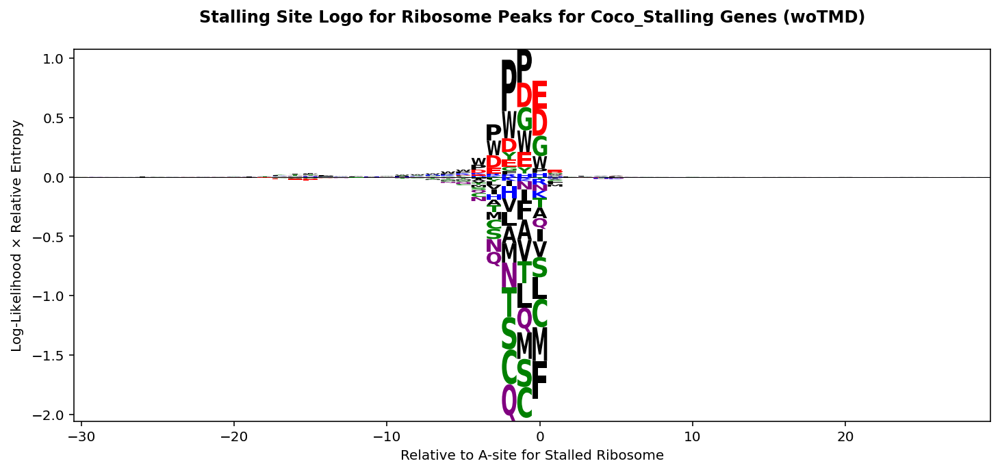

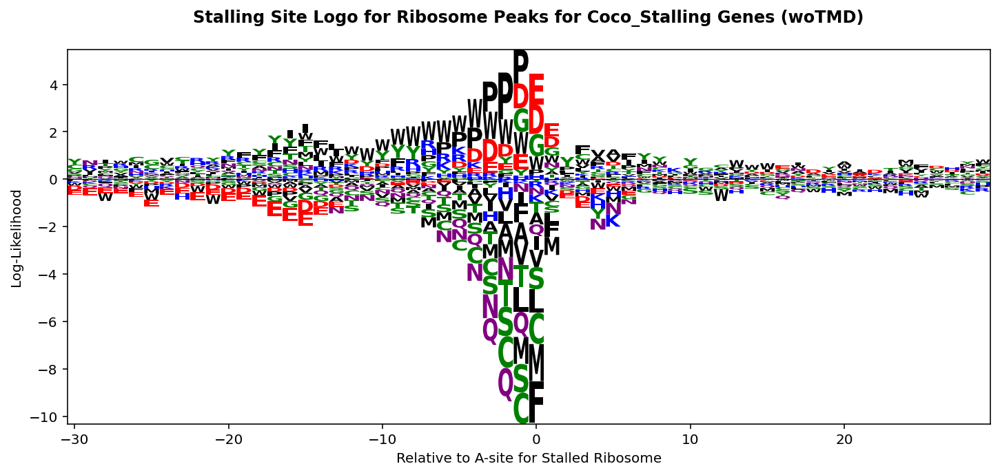

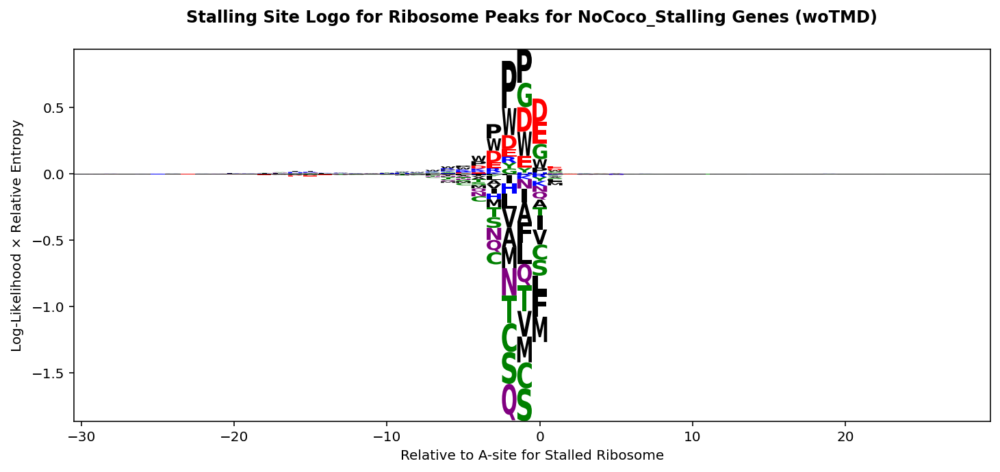

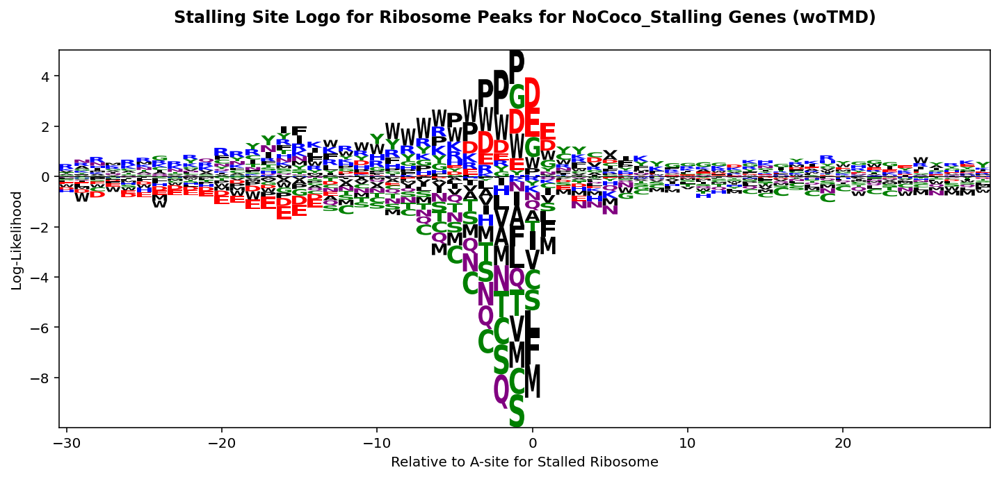

In [146]:
from Bio.SeqUtils.ProtParam import ProteinAnalysis

fl = 30
aa = ['A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']

associated_peaks = [i for i in coco_stalling if i not in tmd_genes]

expected_seq = ""
for gene_id in associated_peaks:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    expected_seq += I.protein_genome.db[best_transcript][1]
dfk_expected = pd.DataFrame([ProteinAnalysis(expected_seq).get_amino_acids_percent()] * (fl * 2), index=np.arange(-fl, fl))
del expected_seq

fill_matrix = np.zeros((fl * 2, len(aa)))
for gene_id in associated_peaks:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    protein_seq = "."*fl + I.protein_genome.db[best_transcript][1] + "."*fl
    for nt_position in gene_collision[gene_id]:
        aa_position = math.floor(nt_position / 3) + fl
        fpca = protein_seq[aa_position-fl: aa_position+fl]
        for i_fl in range(fl * 2):
            try:
                # Increase the relevant position with normalized intensity
                fill_matrix[i_fl, aa.index(fpca[i_fl])] += 1
            except ValueError:
                pass  # Raises ValueError for non-conventional amino acids or "."
dfk_observed = pd.DataFrame((fill_matrix.T / np.sum(fill_matrix, axis=1)).T, columns=aa, index=np.arange(-fl, fl))
sonc = [stats.entropy(dfk_observed.iloc[i], dfk_expected.iloc[i]) for i in range(fl * 2)]
#plt.plot(np.arange(-fl, fl), sonc)
#plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
#plt.title("Information Content")

import logomaker
to_plot = (np.log2(dfk_observed/ dfk_expected).T * sonc).T
fig, ax = plt.subplots(1,1,figsize=[12,5])
ss_logo = logomaker.Logo(to_plot, flip_below=False, color_scheme='chemistry', ax=ax)
ss_logo.ax.set_ylabel(r"Log-Likelihood $\times$ Relative Entropy")
ss_logo.ax.set_xlabel("Relative to A-site for Stalled Ribosome")
ss_logo.ax.set_title("Stalling Site Logo for Ribosome Peaks for Coco_Stalling Genes (woTMD)", y=1.05, fontweight="bold")
plt.show()

fig, ax = plt.subplots(1,1,figsize=[12,5])
ss_logo = logomaker.Logo(np.log2(dfk_observed/ dfk_expected), flip_below=False, color_scheme='chemistry', ax=ax)
ss_logo.ax.set_ylabel(r"Log-Likelihood")
ss_logo.ax.set_xlabel("Relative to A-site for Stalled Ribosome")
ss_logo.ax.set_title("Stalling Site Logo for Ribosome Peaks for Coco_Stalling Genes (woTMD)", y=1.05, fontweight="bold")
plt.show()

################################################################################################################
################################################################################################################

associated_peaks = [i for i in nococo_stalling if i not in tmd_genes]

expected_seq = ""
for gene_id in associated_peaks:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    expected_seq += I.protein_genome.db[best_transcript][1]
dfk_expected = pd.DataFrame([ProteinAnalysis(expected_seq).get_amino_acids_percent()] * (fl * 2), index=np.arange(-fl, fl))
del expected_seq

fill_matrix = np.zeros((fl * 2, len(aa)))
for gene_id in associated_peaks:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    protein_seq = "."*fl + I.protein_genome.db[best_transcript][1] + "."*fl
    for nt_position in gene_collision[gene_id]:
        aa_position = math.floor(nt_position / 3) + fl
        fpca = protein_seq[aa_position-fl: aa_position+fl]
        for i_fl in range(fl * 2):
            try:
                # Increase the relevant position with normalized intensity
                fill_matrix[i_fl, aa.index(fpca[i_fl])] += 1
            except ValueError:
                pass  # Raises ValueError for non-conventional amino acids or "."
dfk_observed = pd.DataFrame((fill_matrix.T / np.sum(fill_matrix, axis=1)).T, columns=aa, index=np.arange(-fl, fl))
sonc = [stats.entropy(dfk_observed.iloc[i], dfk_expected.iloc[i]) for i in range(fl * 2)]
#plt.plot(np.arange(-fl, fl), sonc)
#plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
#plt.title("Information Content")

import logomaker
to_plot = (np.log2(dfk_observed/ dfk_expected).T * sonc).T
fig, ax = plt.subplots(1,1,figsize=[12,5])
ss_logo = logomaker.Logo(to_plot, flip_below=False, color_scheme='chemistry', ax=ax)
ss_logo.ax.set_ylabel(r"Log-Likelihood $\times$ Relative Entropy")
ss_logo.ax.set_xlabel("Relative to A-site for Stalled Ribosome")
ss_logo.ax.set_title("Stalling Site Logo for Ribosome Peaks for NoCoco_Stalling Genes (woTMD)", y=1.05, fontweight="bold")
plt.show()

fig, ax = plt.subplots(1,1,figsize=[12,5])
ss_logo = logomaker.Logo(np.log2(dfk_observed/ dfk_expected), flip_below=False, color_scheme='chemistry', ax=ax)
ss_logo.ax.set_ylabel(r"Log-Likelihood")
ss_logo.ax.set_xlabel("Relative to A-site for Stalled Ribosome")
ss_logo.ax.set_title("Stalling Site Logo for Ribosome Peaks for NoCoco_Stalling Genes (woTMD)", y=1.05, fontweight="bold")
plt.show()


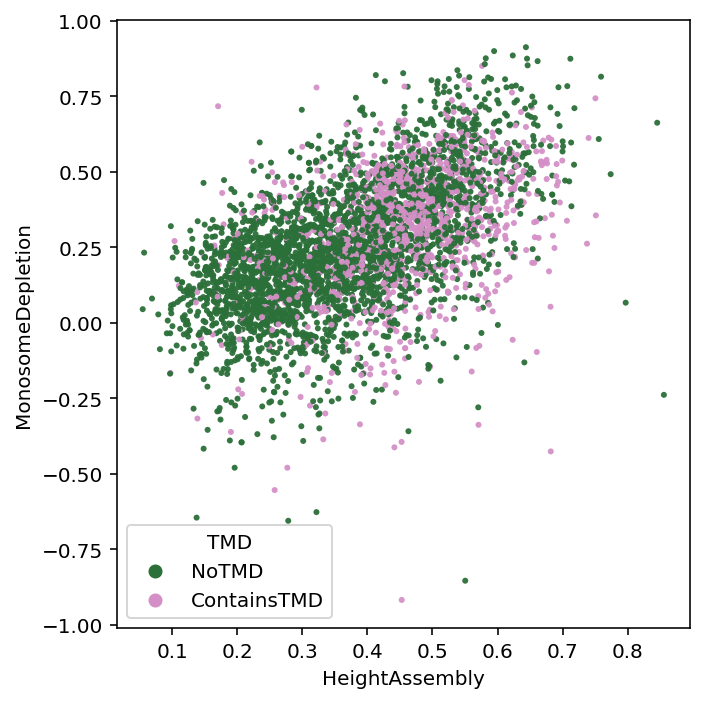

In [95]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(data=temp_df, x="HeightAssembly", y="MonosomeDepletion", hue="TMD", alpha=0.95,
                palette="cubehelix", linewidth=0, marker = ".", ax=ax)
plt.tight_layout()

## CocoAssembly Onset and Transmembrane Domains

In [96]:
flank = 600
metag = np.full((temp_df.shape[0], flank * 2), np.nan)
ind = 0
for row_series in temp_df.iterrows():
    gene_id = row_series[1]["GeneID"]
    ons = int(row_series[1]["MyOnset"])
    arr = tmd_dict[gene_id]
    start_position = max(0, ons-flank)
    start_offset = -min(0, ons-flank)
    marr = arr[start_position: ons+flank]
    metag[ind, start_offset: len(marr) + start_offset] = marr
    ind += 1
ind

3507

In [97]:
# RANDOM Onset
onset_gene = 25
metag_average = np.full((temp_df.shape[0] * onset_gene, flank * 2), np.nan)
ind = 0
for row_series in temp_df.iterrows():
    gene_id = row_series[1]["GeneID"]
    arr = tmd_dict[gene_id]
    for _ in range(onset_gene):
        ons = np.random.randint(gene_lengths[gene_id])
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = arr[start_position: ons+flank]
        metag_average[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
ind

87675

In [98]:
m1 = np.array([smooth_array(i, 15, "hanning") for i in metag])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_average])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
print(signif_rnges)

Progress: |████████████████████| 100.0% 
[[1, 358], [397, 518]]


In [99]:
kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_average, confidence=1-((1-kk) / onset_gene))

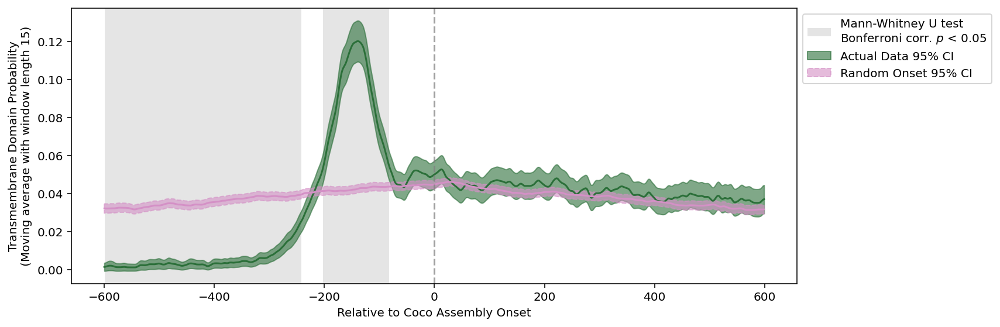

In [100]:
palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_average, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label="Actual Data 95% CI")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label="Random Onset 95% CI")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Coco Assembly Onset")
plt.ylabel("Transmembrane Domain Probability\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

## Sixtymers Enrichment and Transmembrane Domains

metagene_profile:
- origin: first nt of first tmd 
- data: sixtymers 


#### For All Genes

In [101]:
genes_of_tmd = [i for i in tmd_dict if np.sum(tmd_dict[i]) > 0]
len(genes_of_tmd)

6304

No association is seen if rpkm_threshold == 0.1 but similar result if rpkm_threshold == 0.1

#### Only for Coco Assembly Condidates

In [102]:
tmd_onset_genes = list(temp_df[temp_df["TMD"] != "NoTMD"]["GeneID"])
genes_of_tmd = [i for i in tmd_dict if np.sum(tmd_dict[i]) > 0 and i in tmd_onset_genes]
len(genes_of_tmd)

768

In [103]:
rpkm_threshold_for_sixtymers = 1

In [104]:
flank = 350
metag = np.full((len(genes_of_tmd), flank * 2), np.nan)
ind = 0
for gene_id in genes_of_tmd:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = np.where(tmd_dict[gene_id] != 0)[0]
    if rpkm_background > rpkm_threshold_for_sixtymers and len(ons) > 0:
        ons = ons[0]
        exp_rpm_bs = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)
        arr = exp_rpm_bs / rpkm_background
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = arr[start_position: ons+flank]
        metag[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
ind

768

In [105]:
# RANDOM Onset
onset_gene = 25
metag_average = np.full((len(genes_of_tmd) * onset_gene, flank * 2), np.nan)
ind = 0
for gene_id in genes_of_tmd:
    rpkm_background = I.riboseq_sixtymers.background.calculate_rpkm_genes(gene_id)
    ons = np.where(tmd_dict[gene_id] != 0)[0]
    if rpkm_background > rpkm_threshold_for_sixtymers and len(ons) > 0:
        exp_rpm_bs = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)
        arr = exp_rpm_bs / rpkm_background
        for _ in range(onset_gene):
            ons = np.random.randint(gene_lengths[gene_id])
            start_position = max(0, ons-flank)
            start_offset = -min(0, ons-flank)
            marr = arr[start_position: ons+flank]
            metag_average[ind, start_offset: len(marr) + start_offset] = marr
            ind += 1
ind


19200

In [106]:
m1 = np.array([smooth_array(i, 15, "hanning") for i in metag])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_average])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
print(signif_rnges)

Progress: |████████████████████| 100.0% 
[[370, 371], [373, 373], [410, 600]]


In [107]:
kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_average, confidence=1-((1-kk) / onset_gene))

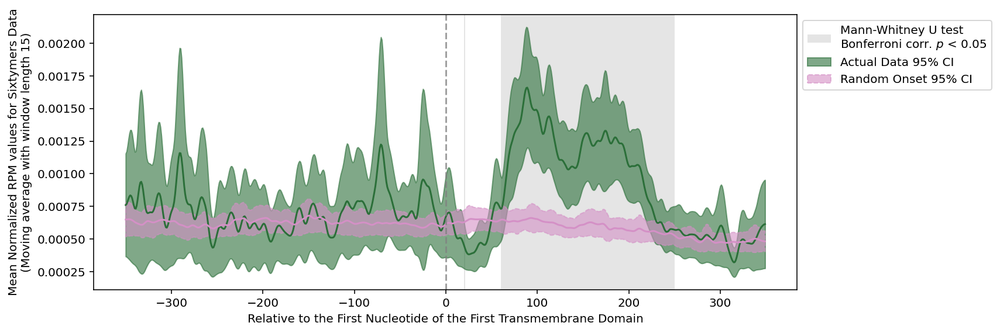

In [108]:
palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_average, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label="Actual Data 95% CI")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label="Random Onset 95% CI")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to the First Nucleotide of the First Transmembrane Domain")
plt.ylabel("Mean Normalized RPM values for Sixtymers Data\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

## CocoAssembly Sigmoidal Curve and Transmembrane Domains: DEPRECATED

metagene_profile:
- origin: first nt of first tmd 
- data: sigmoidal curve

In [109]:
tmd_onset_genes = list(temp_df[temp_df["TMD"] != "NoTMD"]["GeneID"])
genes_of_tmd = [i for i in tmd_dict if np.sum(tmd_dict[i]) > 0 and i in tmd_onset_genes]
len(genes_of_tmd)

768

In [110]:
rpkm_threshold_for_sixtymers = 1

In [111]:
flank = 2500
metag = np.full((len(genes_of_tmd), flank * 2), np.nan)
ind = 0
for gene_id in genes_of_tmd:

    ons = np.where(tmd_dict[gene_id] != 0)[0]
    if len(ons) > 0:
        ons = ons[0]
        
        arr = I.riboseq_coco.calculate_curve(gene_id)
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = arr[start_position: ons+flank]
        metag[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
ind

/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1981: RuntimeWarning: overflow encountered in exp
  return ((i_max - i_init) / (1 + np.exp(-a_1 * (x - i_mid))) + i_init) * \
/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1982: RuntimeWarning: overflow encountered in exp
  ((1 - i_final) / (1 + np.exp(-a_2 * (x - (i_mid + i_dist)))) + i_final)
/home/kai/HDD_Kemal/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1977: RuntimeWarning: overflow encountered in exp
  return (i_max - i_init) / (1 + np.exp(-a * (x - i_mid))) + i_init


768

In [112]:
# RANDOM Onset
onset_gene = 25
metag_average = np.full((len(genes_of_tmd) * onset_gene, flank * 2), np.nan)
ind = 0
for gene_id in genes_of_tmd:

    ons = np.where(tmd_dict[gene_id] != 0)[0]
    if len(ons) > 0:
        
        arr = I.riboseq_coco.calculate_curve(gene_id)
        for _ in range(onset_gene):
            ons = np.random.randint(gene_lengths[gene_id])
            start_position = max(0, ons-flank)
            start_offset = -min(0, ons-flank)
            marr = arr[start_position: ons+flank]
            metag_average[ind, start_offset: len(marr) + start_offset] = marr
            ind += 1
ind


19200

In [113]:
m1 = np.array([smooth_array(i, 15, "hanning") for i in metag])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_average])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
print(signif_rnges)

Progress: |████████████████████| 100.0% 
[[1586, 1701], [1727, 1727], [1730, 1735], [1739, 1744], [1826, 1837], [1840, 2728], [2812, 3593], [3603, 3608]]


In [114]:
kk = 0.95 
bootstrap_ci = confidence_interval_normal(metag, confidence=kk)
bootstrap_ci_random = confidence_interval_normal(metag_average, confidence=1-((1-kk) / onset_gene))

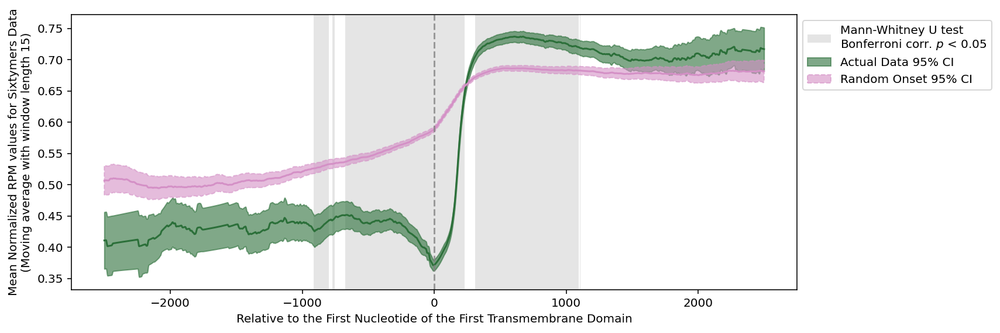

In [115]:
palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_average, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.6, label="Actual Data 95% CI")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.6, linestyle="--", label="Random Onset 95% CI")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to the First Nucleotide of the First Transmembrane Domain")
plt.ylabel("Mean Normalized RPM values for Sixtymers Data\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

## Transmembrane Domains cause Collision cause CocoAssembly?

In [116]:
onsetdf.head()

,GeneID,GeneName,MyOnset,PapersOnset,Confidence,GeneLength,PaperTotalRPKM,MySixtymersRPKM,MyTotalRPKM,SlopeMyOnset,HeightAssembly,WidthAssembly,SlopeClass,MonDep_lg_val,MonosomeDepletion,PeakCount,ClosestPeak,TMD,WidthCategory
0,ENSG00000094914,AAAS,461.0,465.0,High,1638.0,0.121248,102.058374,89.765197,0.005300,0.497321,93.833881,2.0,975.0,0.439295,9.0,15.0,NoTMD,Others
1,ENSG00000081760,AACS,312.0,303.0,High,2016.0,0.023634,13.453680,20.600090,0.010595,0.556481,52.523687,2.0,506.0,0.694991,2.0,382.0,NoTMD,Others
2,ENSG00000109576,AADAT,418.0,558.0,Low,1275.0,0.005600,7.619262,10.523488,0.011941,0.427146,35.771692,2.0,931.0,0.251714,3.0,-20.0,NoTMD,Others
3,ENSG00000131043,AAR2,356.0,321.0,High,1152.0,0.061421,71.800416,65.873338,0.002370,0.283736,119.731143,2.0,900.0,0.107714,4.0,-16.0,NoTMD,Others
4,ENSG00000124608,AARS2,622.0,642.0,Low,2955.0,0.031557,27.380521,25.648697,0.000598,0.389167,650.791953,1.0,2955.0,0.343435,8.0,-71.0,NoTMD,Others


2d metagene_profile: 
- y-origin: onset
- x-sort: tmd enrichment exist or not
- context: sixtymers data

todo: width için 2-d yap bir de.

## Cross Comparison: Height and Slope at Onset versus Sixtymers (3D Analysis)

In [ ]:
# 3d heatmap?

# Conservation around Coco Onset

In [135]:
I.conservation_gerp = ConservationGerp(I.temp_repo_dir, I.organism, I.ensembl_release)

In [136]:
gerp_dict = dict()
for ind, gene_id in enumerate(I.gene_list):
    gerp_dict[gene_id] = I.conservation_gerp.get_best_transcript(gene_id, I.gene_info, I.protein_genome)
    if ind % 100 == 0 or ind == (len(I.gene_list) - 1):
        progress_bar(ind, len(I.gene_list) - 1, verbose=True)

Progress: |████████████████████| 100.0% 


In [137]:
number_of_offset = 0
for gene_id in I.gene_list:
    ons = gene_onset[gene_id]
    if not np.isnan(ons):
        number_of_offset += 1
number_of_offset

7796

In [150]:
flank = 400
metag = np.full((number_of_offset, flank * 2), np.nan)
ind = 0
for gene_id in I.gene_list:
    ons = gene_onset[gene_id]
    if not np.isnan(ons):
        gerp = gerp_dict[gene_id]
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = gerp[start_position: ons+flank]
        metag[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
ind

7796

In [151]:
onset_gene = 25
metag_average = np.full((number_of_offset * onset_gene, flank * 2), np.nan)
ind = 0
for gene_id in I.gene_list:
    ons = gene_onset[gene_id]
    if not np.isnan(ons):
        for _ in range(onset_gene):
            ons = np.random.randint(gene_lengths[gene_id])
            gerp = gerp_dict[gene_id]
            start_position = max(0, ons-flank)
            start_offset = -min(0, ons-flank)
            marr = gerp[start_position: ons+flank]
            metag_average[ind, start_offset: len(marr) + start_offset] = marr
            ind += 1
ind

194900

- Showing that the data is not normally distributed.
- The reason why bootstrapping is used for CI, the reason why mannwhitneyu is used

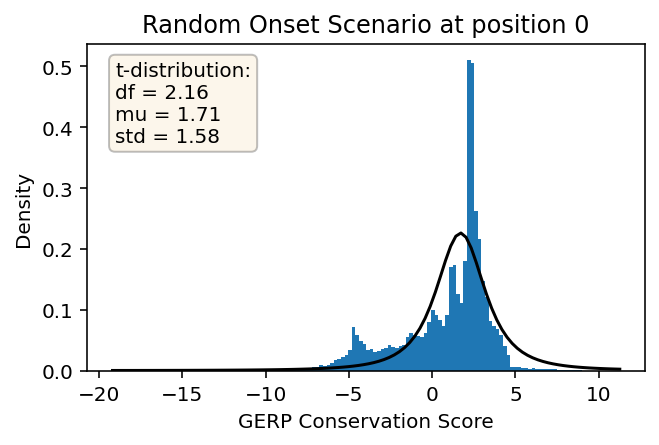

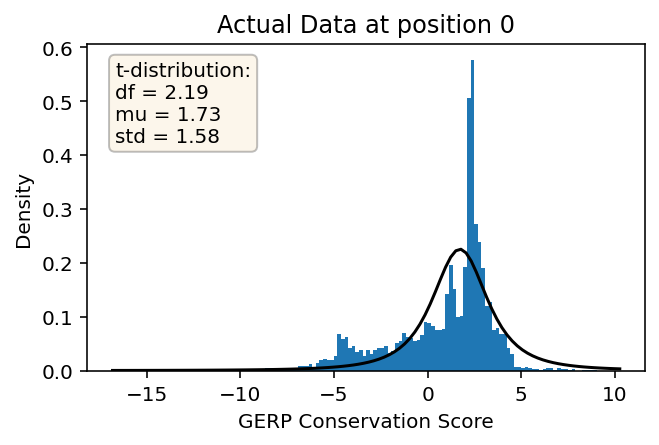

In [152]:
example_point = flank

for m, tit in zip([metag_average, metag],["Random Onset Scenario", "Actual Data"]):
    example_dist = m[:,example_point]
    example_dist = example_dist[~np.isnan(example_dist)]
    params = stats.t.fit(example_dist)
    fig, ax = plt.subplots(1,1,figsize=[5,3])
    plt.hist(example_dist, bins=128, density=True)
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = stats.t.pdf(x, *params)
    plt.plot(x, p, 'k')
    ax.text(0.05, 0.95, "t-distribution:\ndf = %.2f\nmu = %.2f\nstd = %.2f" % params, 
            transform=ax.transAxes, verticalalignment='top', horizontalalignment="left", alpha=1,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.25))
    plt.title(f"{tit} at position {flank - example_point}")
    plt.ylabel("Density")
    plt.xlabel("GERP Conservation Score")
    plt.show()

Non-parametric statistical analysis. There is no need to assume that our observations, or the underlying populations, are normally distributed. Thanks to the Central Limit Theorem, the resampling distribution of the effect size will approach a normality.

In [153]:
m1 = np.array([smooth_array(i, 15, "hanning") for i in metag])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_average])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
print(signif_rnges)

Progress: |████████████████████| 100.0% 
[[165, 302], [397, 401], [412, 422]]


In [154]:
kk = 0.95 
bootstrap_ci = confidence_interval_calculate(metag, confidence=kk)
bootstrap_ci_random = confidence_interval_calculate(metag_average, confidence=1-((1-kk) / onset_gene))

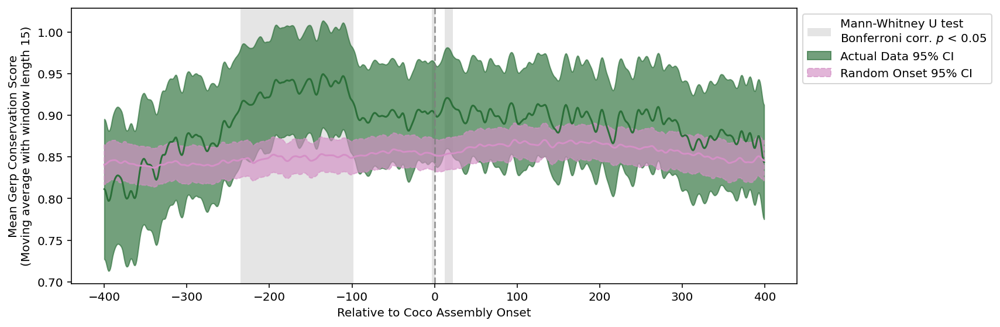

In [155]:
palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12,4))
x_data = np.array(range(-flank, flank))

plt.plot(x_data, smooth_array(np.nanmean(metag, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_average, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.66, label="Actual Data 95% CI")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.66, linestyle="--", label="Random Onset 95% CI")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Coco Assembly Onset")
plt.ylabel("Mean Gerp Conservation Score\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

## Conservation around Collision Peaks

In [159]:
number_of_collisions = 0
for gene_id in gene_collision:
    number_of_collisions += len(gene_collision[gene_id])
number_of_collisions

34135

In [160]:
flank = 400
metag = np.full((number_of_collisions, flank * 2), np.nan)
ind = 0
for gene_id in gene_collision:
    gerp = gerp_dict[gene_id]
    col = gene_collision[gene_id]
    for ons in col:
        start_position = max(0, ons-flank)
        start_offset = -min(0, ons-flank)
        marr = gerp[start_position: ons+flank]
        metag[ind, start_offset: len(marr) + start_offset] = marr
        ind += 1
ind

34135

In [162]:
collison_gene = 25
flank = 400
metag_average = np.full((number_of_collisions * collison_gene, flank * 2), np.nan)
ind = 0
for gene_id in gene_collision:
    gerp = gerp_dict[gene_id]
    col = gene_collision[gene_id]
    for ons in col:
        for _ in range(collison_gene):
            ons = np.random.randint(gene_lengths[gene_id])
            start_position = max(0, ons-flank)
            start_offset = -min(0, ons-flank)
            marr = gerp[start_position: ons+flank]
            metag_average[ind, start_offset: len(marr) + start_offset] = marr
            ind += 1
ind

853375

In [163]:
m1 = np.array([smooth_array(i, 15, "hanning") for i in metag])
m2 = np.array([smooth_array(i, 15, "hanning") for i in metag_average])
significance = list()
for i in range (flank*2):
    progress_bar(i, flank*2 - 1, verbose=True)
    m1_l = m1[:,i][~np.isnan(m1[:,i])]
    m2_l = m2[:,i][~np.isnan(m2[:,i])]
    significance.append(stats.mannwhitneyu(m1_l, m2_l).pvalue < 0.05 / (flank * 2))
significance = np.array(significance).astype(int)
## Ranges for plotting
signif_rnges = list()
first_element = False
for ind, i in enumerate(significance):
    if not first_element and i == 0:
        continue
    elif not first_element and i == 1:
        first_element = ind
    elif i == 0 or ind == len(significance) - 1:
        signif_rnges.append([first_element, ind - 1])
        first_element = False
    elif i == 1:
        continue
print(signif_rnges)

Progress: |████████████████████| 100.0% 
[[357, 363], [386, 416]]


In [164]:
kk = 0.95 
bootstrap_ci = confidence_interval_calculate(metag, confidence=kk)
bootstrap_ci_random = confidence_interval_calculate(metag_average, confidence=1-((1-kk) / onset_gene))

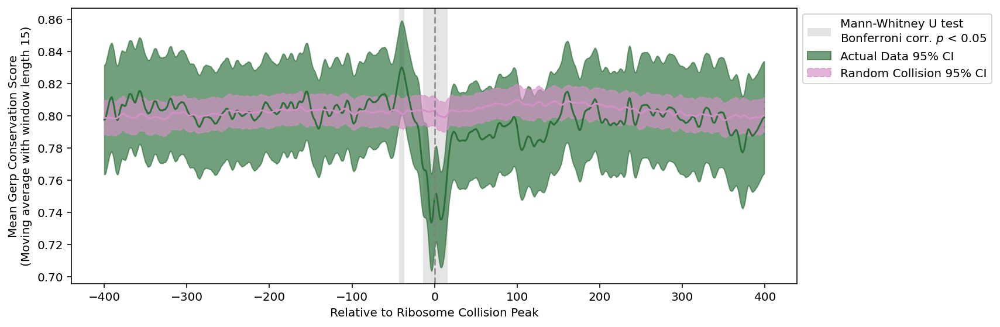

In [165]:
palette = sns.color_palette("cubehelix", 2)
plt.figure(figsize=(12, 4))
x_data = np.array(range(-flank, flank))
plt.plot(x_data, smooth_array(np.nanmean(metag, axis=0), 15, "hanning"),
                color=palette[0], alpha=1)
plt.plot(x_data, smooth_array(np.nanmean(metag_average, axis=0), 15, "hanning"),
                color=palette[1], alpha=1)
plt.fill_between(x_data, smooth_array(bootstrap_ci[0],15, "hanning"), smooth_array(bootstrap_ci[1],15, "hanning"),
                color=palette[0], alpha=0.66, label="Actual Data 95% CI")
plt.fill_between(x_data, smooth_array(bootstrap_ci_random[0],15, "hanning"), smooth_array(bootstrap_ci_random[1],15, "hanning"),
                color=palette[1], alpha=0.66, linestyle="--", label="Random Collision 95% CI")
for i_rng, rng in enumerate(signif_rnges):
    plt.axvspan(rng[0] - flank, rng[1] - flank, color="gray", alpha=0.20, zorder=0, linewidth=0,
                label="Mann-Whitney U test\nBonferroni corr. $p$ < 0.05" if i_rng == 0 else "")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Ribosome Collision Peak")
plt.ylabel("Mean Gerp Conservation Score\n(Moving average with window length 15)")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

## Conservation at ribosome collision peaks coinciding with coco onset

# .

# .

# .

# .

# .

# .

# IDEAS

# .

# .

# .

# .

# .

# .

## Streching the Coco curve

In [378]:
def get_assembl_curve(gene_id):
    sgnl = I.riboseq_coco.calculate_curve(gene_id)
    drvt = np.gradient(sgnl)
    ons = gene_onset[gene_id]
    m = drvt[ons]
    karsi = sgnl[ons] - sgnl.min()
    komsu = karsi/m * 4
    return [max(0, math.floor(ons - komsu)), min(gene_lengths[gene_id], math.ceil(ons + komsu))]

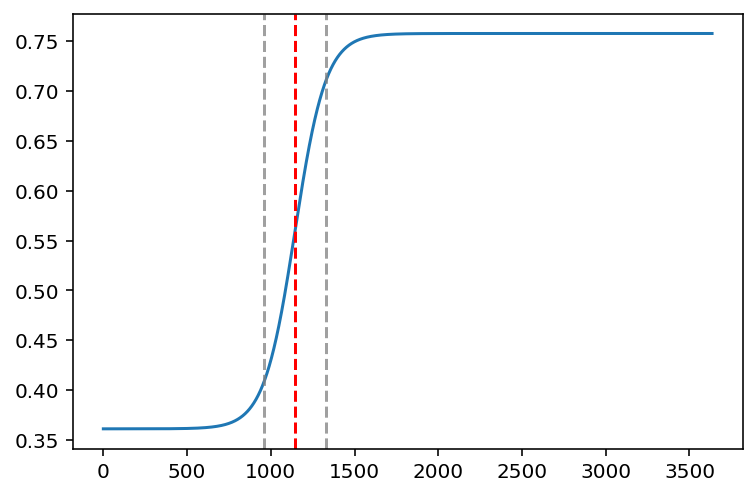

In [379]:
gene_id = "ENSG00000064651"
m1, m2 = get_assembl_curve(gene_id)
sgnl = I.riboseq_coco.calculate_curve(gene_id)
plt.plot(sgnl)
ons = gene_onset[gene_id]
plt.axvline(ons, color="red", alpha=1, linestyle = "--")
plt.axvline(m1, color="gray", alpha=0.75, linestyle = "--")
plt.axvline(m2, color="gray", alpha=0.75, linestyle = "--")
plt.show()
#I.riboseq_coco.plot_result(gene_id)

In [380]:
gene_assembl = {gene_id: get_assembl_curve(gene_id) for gene_id in gene_onset if not np.isnan(gene_onset[gene_id])}

/home/kai/KEMALINECIK/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1941: RuntimeWarning: overflow encountered in exp
  ((1 - i_final) / (1 + np.exp(-a_2 * (x - (i_mid + i_dist)))) + i_final)
/home/kai/KEMALINECIK/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1940: RuntimeWarning: overflow encountered in exp
  return ((i_max - i_init) / (1 + np.exp(-a_1 * (x - i_mid))) + i_init) * \
/home/kai/KEMALINECIK/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1936: RuntimeWarning: overflow encountered in exp
  return (i_max - i_init) / (1 + np.exp(-a * (x - i_mid))) + i_init


In [381]:
import scipy.interpolate as interp
def interpolate_5000(arr, toto=5000):
    arr1_interp = interp.interp1d(np.arange(arr.size), arr, kind="linear")
    return arr1_interp(np.linspace(0, arr.size-1, toto))

In [382]:
lst = []
for gene_id in I.gene_list:
    ons = gene_onset[gene_id]
    if not np.isnan(ons):
        m1, m2 = get_assembl_curve(gene_id)    
        signl = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)[m1:m2]
        signl = signl / I.riboseq_sixtymers.background.calculate_rpm_genes(gene_id)
        lst.append(list(interpolate_5000(signl)))
lst=np.array(lst)

In [395]:
repeat=10
lst_ar=np.zeros(lst.shape) 
for _ in range(repeat):
    lst_r = []
    for gene_id in I.gene_list:
        ons = gene_onset[gene_id]
        if not np.isnan(ons):
            m1, m2 = get_assembl_curve(gene_id)    
            signl_r = np.random.choice(normalized_sixtymers_random, m2-m1)
            lst_r.append(list(interpolate_5000(signl_r))) 
    lst_ar += np.array(lst_r)
lst_ar = lst_ar / repeat

/home/kai/KEMALINECIK/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1941: RuntimeWarning: overflow encountered in exp
  ((1 - i_final) / (1 + np.exp(-a_2 * (x - (i_mid + i_dist)))) + i_final)
/home/kai/KEMALINECIK/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1940: RuntimeWarning: overflow encountered in exp
  return ((i_max - i_init) / (1 + np.exp(-a_1 * (x - i_mid))) + i_init) * \
/home/kai/KEMALINECIK/from_raf_computer/Kemal/RiboSeqAnalysis/infrastructure/main.py:1936: RuntimeWarning: overflow encountered in exp
  return (i_max - i_init) / (1 + np.exp(-a * (x - i_mid))) + i_init


In [403]:
repeat=5
lst_ars=np.zeros(lst.shape) 
for _ in range(repeat):
    lst_rs = []
    for gene_id in I.gene_list:
        ons = gene_onset[gene_id]
        if not np.isnan(ons):
            m1 = np.random.randint(0, gene_lengths[gene_id] / 3 * 2) 
            m2 = np.random.randint(m1+14, gene_lengths[gene_id])
            signl = I.riboseq_sixtymers.experiment.calculate_rpm_positions(gene_id)[m1:m2]
            signl = signl / I.riboseq_sixtymers.background.calculate_rpm_genes(gene_id)
            lst_rs.append(list(interpolate_5000(signl))) 
    lst_ars += np.array(lst_rs)
lst_ars = lst_ars / repeat

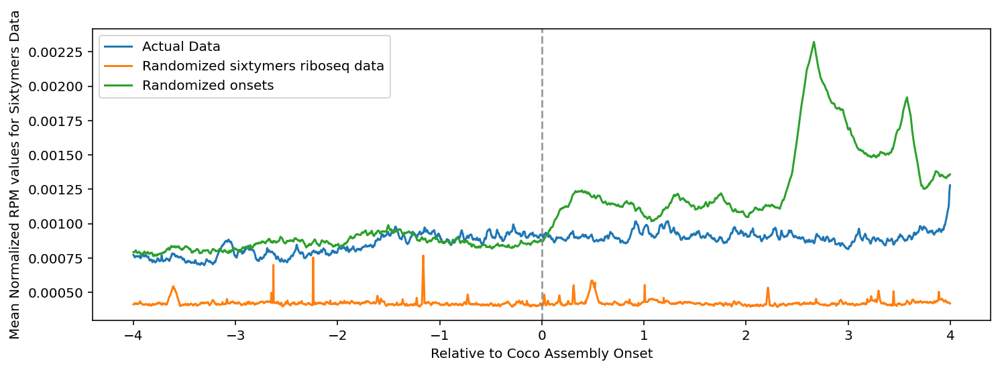

In [404]:
plt.figure(figsize=(12,4))
x_data = np.arange(-4, 4, 8/5000)
plt.plot(x_data, np.mean(lst, axis=0), label="Actual Data")
plt.plot(x_data, np.mean(lst_ar, axis=0), label="Randomized sixtymers riboseq data")
plt.plot(x_data, np.mean(lst_ars, axis=0), label="Randomized onsets")
plt.axvline(0, color="gray", alpha=0.75, linestyle = "--")
plt.xlabel("Relative to Coco Assembly Onset")
plt.ylabel("Mean Normalized RPM values for Sixtymers Data")
plt.legend()
plt.show()

## Look for sequence logo everywhere

* go for the collision peaks which does not show the logo
* go for the sequence similar to logo but does not show collision peak

For example, check GERP conservation scores in and around these regions

## Investigating collision peaks on coco, the shape of the fitting?

In [10]:
m=list(associated_peaks.keys())
print(f"Number of genes involved in the Coco-Sixtymer relationship based on detected collison peaks: {len(m)}")

print(f"\nThese genes has following statistics in for RPKM ({len(m)}):")
rpkms_of_these_genes = [I.riboseq_sixtymers.background.calculate_rpkm_genes(i) for i in m]
print(f"Mean: {np.mean(rpkms_of_these_genes)}")
print(f"Std Dev: {np.std(rpkms_of_these_genes)}")
print(f"Median: {np.median(rpkms_of_these_genes)}")

print(f"\nAll Genes ({len(I.gene_list)}):")
rpkms_of_these_genes = [I.riboseq_sixtymers.background.calculate_rpkm_genes(i) for i in I.gene_list]
print(f"Mean: {np.mean(rpkms_of_these_genes)}")
print(f"Std Dev: {np.std(rpkms_of_these_genes)}")
print(f"Median: {np.median(rpkms_of_these_genes)}")

msa = [i for i in I.gene_list if not np.isnan(gene_onset[i])]
print(f"\nGenes which fited Coco ({len(msa)}):")
rpkms_of_these_genes = [I.riboseq_sixtymers.background.calculate_rpkm_genes(i) for i in msa]
print(f"Mean: {np.mean(rpkms_of_these_genes)}")
print(f"Std Dev: {np.std(rpkms_of_these_genes)}")
print(f"Median: {np.median(rpkms_of_these_genes)}")

Number of genes involved in the Coco-Sixtymer relationship based on detected collison peaks: 620

These genes has following statistics in for RPKM (620):
Mean: 163.1563404194835
Std Dev: 326.01236702475535
Median: 55.22335557456464

All Genes (22524):
Mean: 40.506679251459744
Std Dev: 155.06101207215647
Median: 1.7091719641796888

Genes which fited Coco (7796):
Mean: 107.24722428322525
Std Dev: 247.17198543924593
Median: 35.91412299221416


## K-modes clustering of ribosome collision sites

In [90]:
chem_dict = dict()
for aa, chem in (("GCTYS", "Pol"),
("DE", "Aci"),
("KHR", "Bas"),
("UX.", np.nan),
("QN", "Neu"),
("AMILVFPW", "Hyd")):
    for a in aa:
        chem_dict[a] = chem

In [91]:
coll_region = list()
fl = 20
for gene_id in gene_collision:
    best_transcript = I.gene_info[gene_id].transcripts.iloc[0][0]  # At least 1 transcript exists
    protein_seq = "."*fl + I.protein_genome.db[best_transcript][1] + "."*fl
    for nt_position in gene_collision[gene_id]:
        aa_position = math.floor(nt_position / 3) + fl
        fpca = list(protein_seq[aa_position-fl: aa_position+fl])
        #fpca = [chem_dict[a] for a in fpca]
        coll_region.append(fpca)
coll_region = np.array(coll_region)

In [94]:
from kmodes.kmodes import KModes
km = KModes(n_clusters=2, max_iter=100, init='cao', n_init=1, verbose=1)
clusters = km.fit_predict(coll_region)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 590835.0


# Motif Discovery Tool for Coco Onset